## ⚙️ Import Libraries

In [2]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
#print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.15.0
GPU devices: 1


## ⏳ Load the Data (no outlier)

In [3]:
from sklearn.model_selection import train_test_split
import numpy as np
data_train = np.load("/kaggle/input/clean-ds-mars/clean/train.npz")
data_test = np.load("/kaggle/input/clean-ds-mars/clean/test.npz")

X_train = data_train["x"]
y_train = data_train["y"]

X_test = data_test["x"]

print(y_train[0].shape)
print(f"Test X shape: {X_test.shape}")

# Perform train-validation split (80-20 split)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

print(f"Train set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")

(64, 128)
Test X shape: (10022, 64, 128)
Train set: (2004, 64, 128), (2004, 64, 128)
Validation set: (501, 64, 128), (501, 64, 128)


### Outliers removed

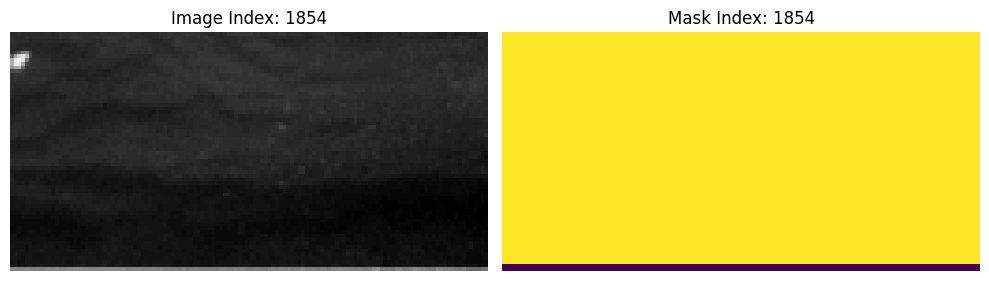

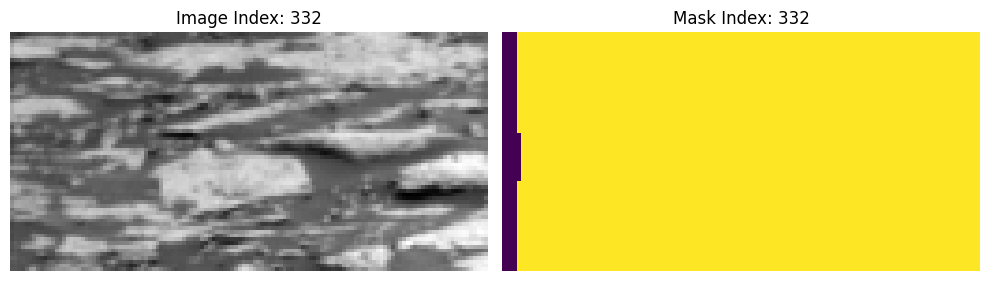

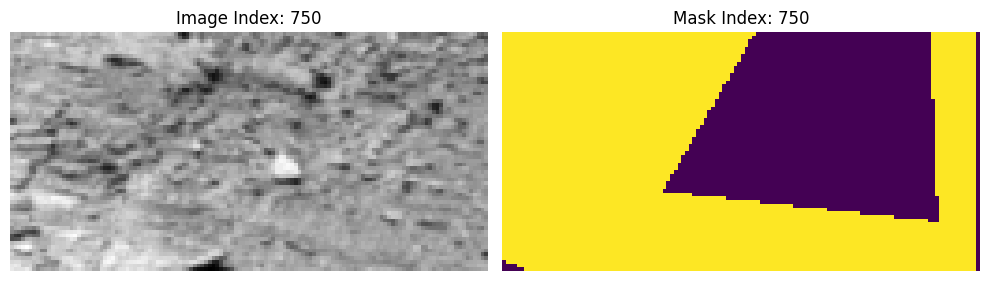

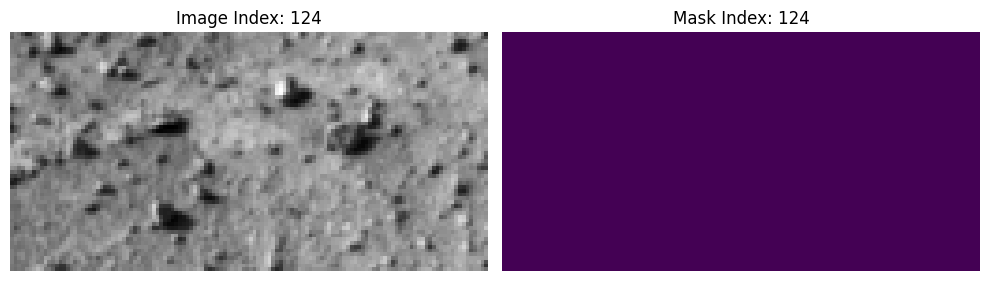

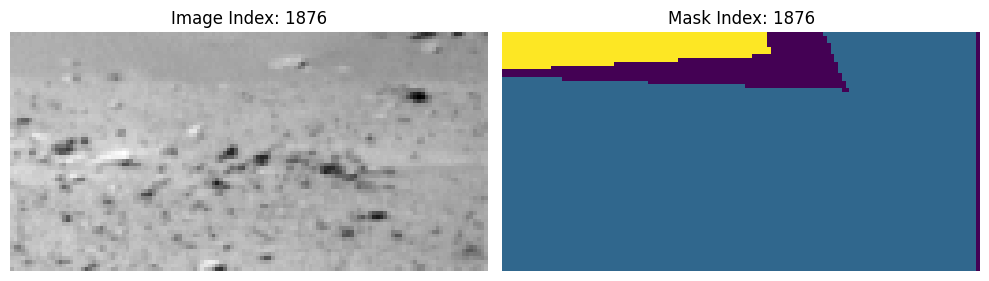

In [4]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis")
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## LETS DO SOME AUGMENTATION!!

## invert image

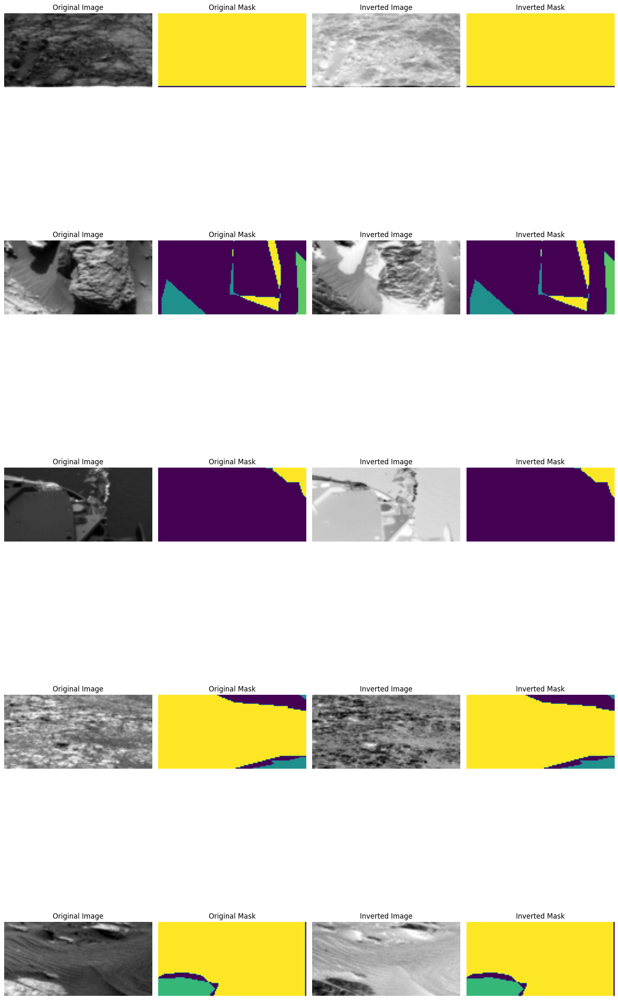

In [5]:


import numpy as np
from skimage.util import random_noise

# Define augmentation functions with mask handling
def invert_image(image, mask):
    return 255 - image, mask  # Mask remains unchanged

def add_salt_and_pepper_noise(image, mask, amount=0.02):
    """
    Add salt-and-pepper noise to an image, preserving its grayscale range.

    Args:
        image (np.ndarray): Input grayscale image with range [0, 255].
        mask (np.ndarray): Corresponding mask (unchanged).
        amount (float): Proportion of image pixels to replace with noise.

    Returns:
        noisy_image (np.ndarray): Image with salt-and-pepper noise applied.
        mask (np.ndarray): Unchanged mask.
    """
    # Normalize the image to [0, 1]
    normalized_image = image / 255.0
    # Add salt-and-pepper noise
    noisy_image = random_noise(normalized_image, mode='s&p', amount=amount)
    # Scale back to [0, 255]
    noisy_image = (noisy_image * 255).astype(np.uint8)
    return noisy_image, mask


"""def rotate_image(image, mask, angle):
    rotated_image = rotate(image, angle, reshape=False, mode='constant', cval=0)
    rotated_mask = rotate(mask, angle, reshape=False, mode='constant', order=0)
    return rotated_image, rotated_mask"""
"""
def adjust_brightness(image, mask, factor=1.2):
    brightened_image = np.clip(image * factor, 0, 255).astype(np.uint8)
    return brightened_image, mask  # Mask remains unchanged"""

# Visualize augmentations with masks
def visualize_all_augmentations(images, masks):
    plt.figure(figsize=(15, 30))
    for i, (image, mask) in enumerate(zip(images, masks)):
        # Original image and mask
        plt.subplot(len(images), 4, i * 4 + 1)
        plt.imshow(image, cmap="gray")
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(len(images), 4, i * 4 + 2)
        plt.imshow(mask, cmap="viridis")
        plt.title("Original Mask")
        plt.axis("off")

        # Inversion
        inverted_image, inverted_mask = invert_image(image, mask)
        plt.subplot(len(images), 4, i * 4 + 3)
        plt.imshow(inverted_image, cmap="gray")
        plt.title("Inverted Image")
        plt.axis("off")

        plt.subplot(len(images), 4, i * 4 + 4)
        plt.imshow(inverted_mask, cmap="viridis")
        plt.title("Inverted Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# Randomly select 5 samples from the dataset
random_indices = np.random.choice(len(X_train), size=5, replace=False)
sample_images = X_train[random_indices]
sample_masks = y_train[random_indices]

# Visualize augmentations
visualize_all_augmentations(sample_images, sample_masks)


### rotation

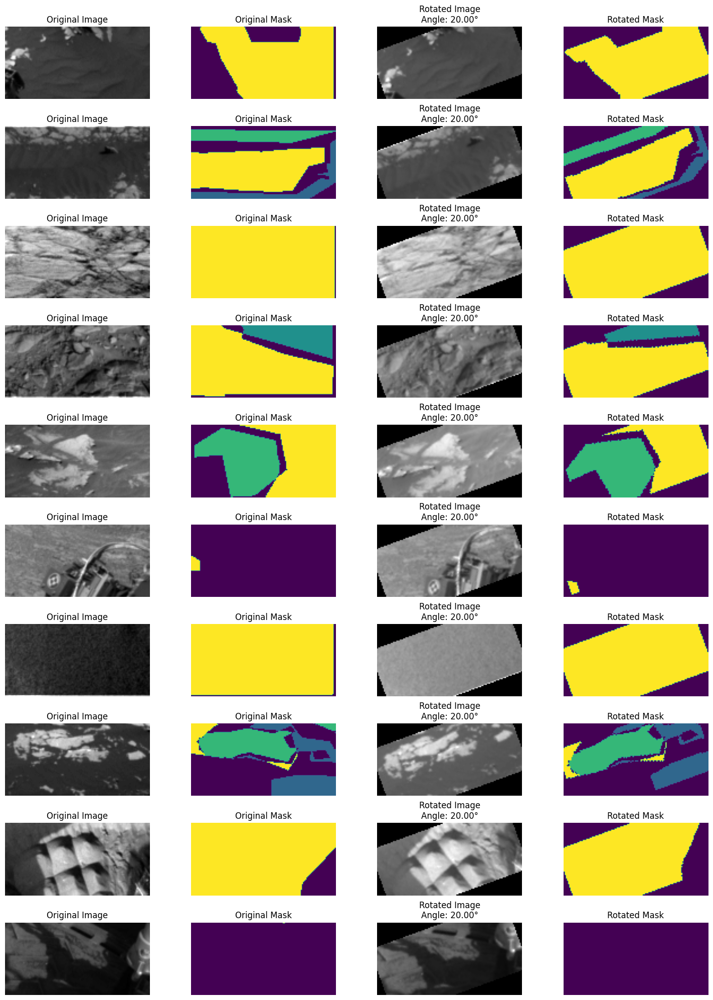

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate

# Define the rotation function using scipy
def rotate_image_and_mask(image, mask, angle):
    """
    Rotate a grayscale image and its corresponding mask by a given angle.
    """
    # Rotate the grayscale image (bilinear interpolation)
    rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

    # Rotate the mask (nearest-neighbor interpolation)
    rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

    return rotated_image, rotated_mask

# Randomly select 10 images
random_indices = np.random.choice(len(X_train), size=10, replace=False)
selected_images = X_train[random_indices]
selected_masks = y_train[random_indices]

# Apply random rotation and visualize
plt.figure(figsize=(15, 20))
for i, (image, mask) in enumerate(zip(selected_images, selected_masks)):
    # Generate a random angle for rotation
    angle = np.random.uniform(20, 20)  # Random angle between -30° and 30°

    # Rotate the image and mask
    rotated_image, rotated_mask = rotate_image_and_mask(image, mask, angle)

    # Plot original and rotated images/masks
    plt.subplot(10, 4, i * 4 + 1)
    plt.imshow(image, cmap="gray")
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 2)
    plt.imshow(mask, cmap="viridis")
    plt.title("Original Mask")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 3)
    plt.imshow(rotated_image, cmap="gray")
    plt.title(f"Rotated Image\nAngle: {angle:.2f}°")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 4)
    plt.imshow(rotated_mask, cmap="viridis")
    plt.title("Rotated Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()


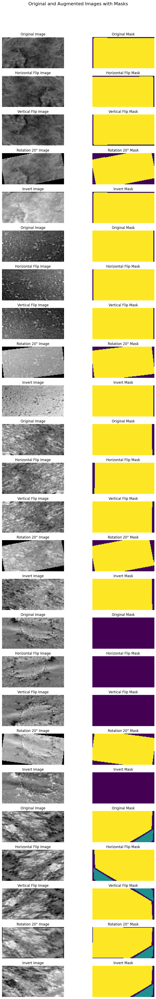

In [7]:
# Helper functions for applying augmentations
def augment_image_and_mask(image, mask, augment_type):
    if augment_type == "Horizontal Flip":
        return np.fliplr(image), np.fliplr(mask)
    elif augment_type == "Vertical Flip":
        return np.flipud(image), np.flipud(mask)
    elif augment_type == "Rotation 20°":
        angle = np.random.uniform(-20, 20)
        # Rotate the grayscale image (bilinear interpolation)
        rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

        # Rotate the mask (nearest-neighbor interpolation)
        rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

        return rotated_image, rotated_mask
    elif augment_type=="Invert":
        inverted_image, inverted_mask = invert_image(image, mask)
        return inverted_image,inverted_mask
        
    """elif augment_type == "Zoom (0.8-1.2)":
        zoom_factor = random.uniform(0.8, 1.2)
        zoom_image = np.clip(image * zoom_factor, 0, 255)
        return zoom_image, mask
    elif augment_type == "Shift (Width and Height)":
        shift_x, shift_y = random.uniform(-0.1, 0.1), random.uniform(-0.1, 0.1)
        return shift(image, [shift_x * image.shape[0], shift_y * image.shape[1]]), shift(mask, [shift_x * mask.shape[0], shift_y * mask.shape[1]], order=0)"""
    return image, mask

# Define augmentations
data_augmentations = {
    "Horizontal Flip": "Horizontal Flip",
    "Vertical Flip": "Vertical Flip",
    "Rotation 20°": "Rotation 20°",
    "Invert":"Invert"
    #"Zoom (0.8-1.2)": "Zoom (0.8-1.2)",
    #"Shift (Width and Height)": "Shift (Width and Height)",
}

# Visualize 5 random images and masks with augmentations
random_indices = np.random.choice(len(X_train), size=5, replace=False)
# Adjusting to display original image/mask with augmentations below each
fig, axes = plt.subplots(len(random_indices) * (1 + len(data_augmentations)), 2, figsize=(10, 50))
fig.suptitle("Original and Augmented Images with Masks", fontsize=16)

for idx, random_idx in enumerate(random_indices):
    original_image = X_train[random_idx]
    original_mask = y_train[random_idx]

    # Plot original image and mask
    row = idx * (1 + len(data_augmentations))  # Calculate starting row for each original image
    axes[row, 0].imshow(original_image, cmap='gray')
    axes[row, 0].set_title("Original Image")
    axes[row, 0].axis('off')

    axes[row, 1].imshow(original_mask)
    axes[row, 1].set_title("Original Mask")
    axes[row, 1].axis('off')

    # Apply augmentations and plot augmented images and masks
    for aug_idx, (augmentation_name, augment_type) in enumerate(data_augmentations.items()):
        augmented_image, augmented_mask = augment_image_and_mask(original_image, original_mask, augment_type)

        axes[row + aug_idx + 1, 0].imshow(augmented_image , cmap='gray' )
        axes[row + aug_idx + 1, 0].set_title(f"{augmentation_name} Image")
        axes[row + aug_idx + 1, 0].axis('off')

        axes[row + aug_idx + 1, 1].imshow(augmented_mask)
        axes[row + aug_idx + 1, 1].set_title(f"{augmentation_name} Mask")
        axes[row + aug_idx + 1, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [8]:
import os
import matplotlib.pyplot as plt

# Directory where augmented files are stored
output_dir = "augmented_data"
os.makedirs(output_dir, exist_ok=True)

# Re-save augmented datasets to the directory with structured filenames
for augmentation_name, augment_type in data_augmentations.items():
    augmented_images = []
    augmented_masks = []

    for image, mask in zip(X_train, y_train):
        aug_image, aug_mask = augment_image_and_mask(image, mask, augment_type)
        augmented_images.append(aug_image)
        augmented_masks.append(aug_mask)

    # Convert lists to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_masks = np.array(augmented_masks)

    # Save to npz file
    output_path = os.path.join(output_dir, f"{augmentation_name.replace(' ', '_').lower()}.npz")
    np.savez_compressed(output_path, augmented_images=augmented_images, augmented_masks=augmented_masks)


File: vertical_flip.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


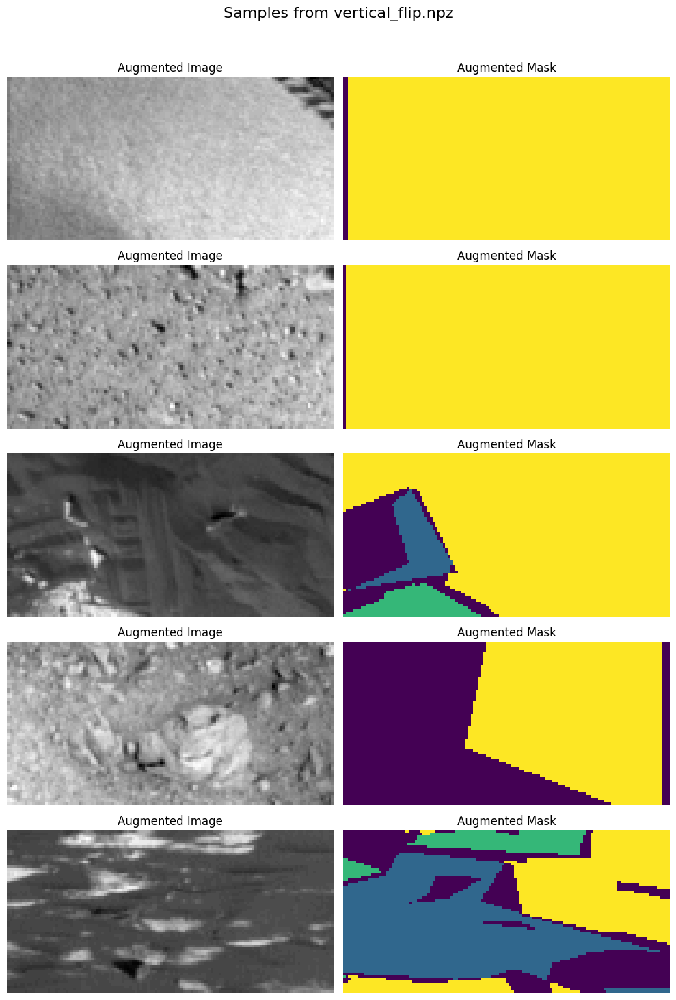

File: invert.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


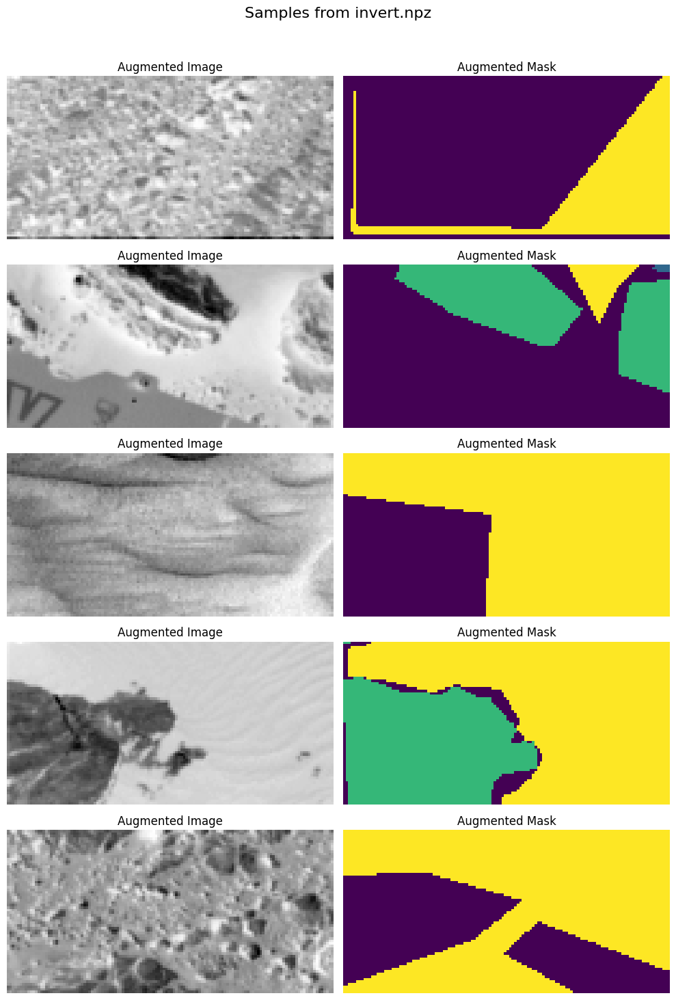

File: rotation_20°.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


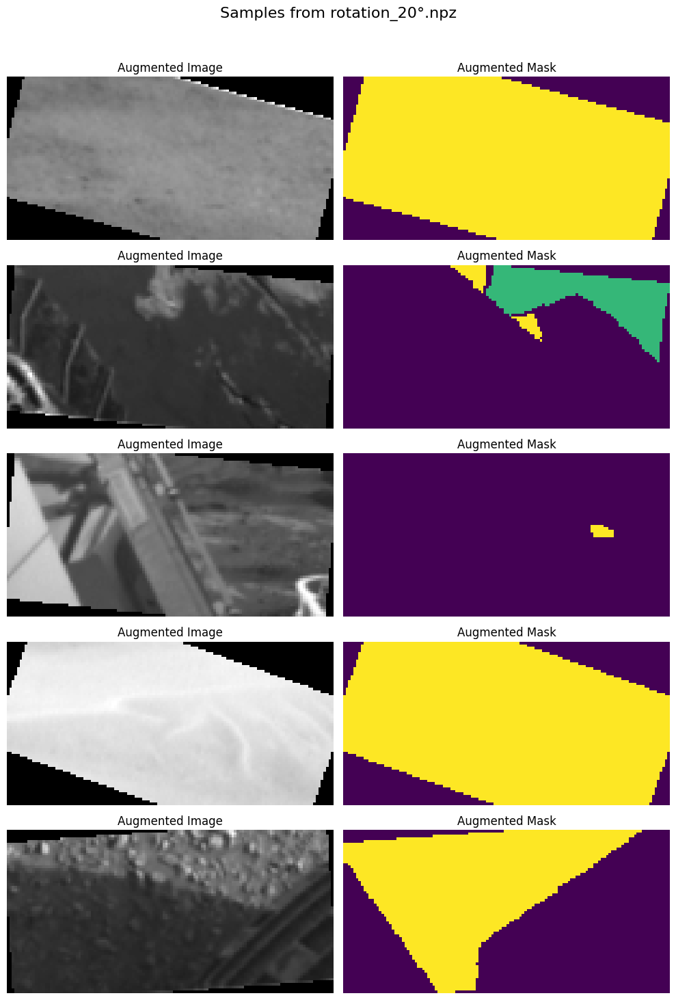

File: horizontal_flip.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


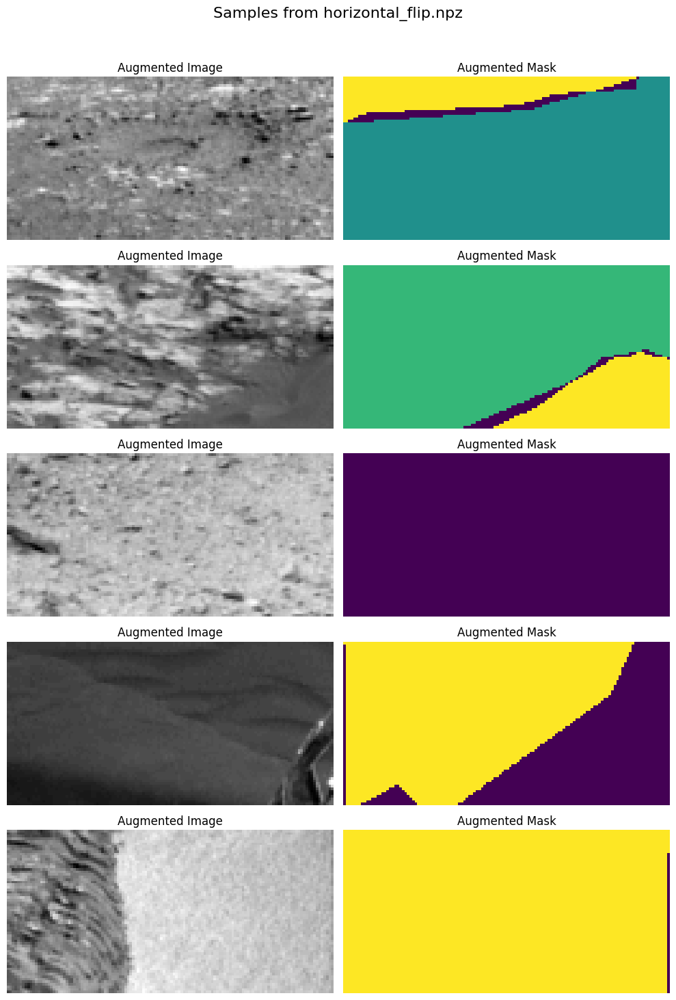

In [9]:
# Read the saved files and display details
output_dir="/kaggle/working/augmented_data"
for file_name in os.listdir(output_dir):
    if file_name.endswith(".npz"):
        file_path = os.path.join(output_dir, file_name)
        data = np.load(file_path)

        # Display keys and their shapes
        print(f"File: {file_name}")
        for key in data.keys():
            print(f"  Key: {key}, Shape: {data[key].shape}")

        # Plot 5 random images and masks
        fig, axes = plt.subplots(5, 2, figsize=(10, 15))
        fig.suptitle(f"Samples from {file_name}", fontsize=16)
        for i in range(5):
            random_idx = np.random.randint(data["augmented_images"].shape[0])
            axes[i, 0].imshow(data["augmented_images"][random_idx], cmap="gray")
            axes[i, 0].set_title("Augmented Image")
            axes[i, 0].axis("off")
            axes[i, 1].imshow(data["augmented_masks"][random_idx])
            axes[i, 1].set_title("Augmented Mask")
            axes[i, 1].axis("off")
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

## 🛠️ Train and Save the Model

In [10]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/horizontal_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (4008, 64, 128)
New y_train shape: (4008, 64, 128)


In [11]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/vertical_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (6012, 64, 128)
New y_train shape: (6012, 64, 128)


In [12]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/rotation_20°.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (8016, 64, 128)
New y_train shape: (8016, 64, 128)


In [13]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/invert.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (10020, 64, 128)
New y_train shape: (10020, 64, 128)


In [14]:
# Add color channel and rescale pixels between 0 and 1
X_train = X_train[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0

input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

Input shape: (64, 128, 1)
Number of classes: 5


In [15]:
X_val = X_val[..., np.newaxis] / 255.0

In [16]:
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_train shape: {y_train.shape}")

X_train shape: (10020, 64, 128, 1)
X_val shape: (501, 64, 128, 1)
y_train shape: (10020, 64, 128)


In [17]:
# Custom callback for visualization
class VisualizeSegmentationCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train, num_images=2):
        super().__init__()
        self.X_train = X_train
        self.y_train = y_train
        self.num_images = num_images
        self.selected_indices = []

        # Identify images containing at least 4 classes
        for i in range(len(y_train)):
            if len(np.unique(y_train[i])) >= 4:  # Check for at least 4 classes
                self.selected_indices.append(i)
            if len(self.selected_indices) == num_images:
                break

    def on_epoch_end(self, epoch, logs=None):
        # Plot predictions for the selected images
        fig, axes = plt.subplots(self.num_images, 3, figsize=(15, self.num_images * 5))

        for idx, i in enumerate(self.selected_indices):
            # Extract image and ground truth
            X_sample = self.X_train[i:i + 1]  # Add batch dimension
            y_sample = self.y_train[i]

            # Predict on the image
            predicted_mask = self.model.predict(X_sample)
            predicted_mask = np.argmax(predicted_mask, axis=-1)[0]  # Convert to class labels

            # Visualize the input, ground truth, and predicted mask
            axes[idx, 0].imshow(X_sample[0].squeeze(), cmap="gray")
            axes[idx, 0].set_title("Input Image")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(y_sample, cmap="viridis")
            axes[idx, 1].set_title("Ground Truth Mask")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(predicted_mask, cmap="viridis")
            axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
            axes[idx, 2].axis("off")

        plt.tight_layout()
        plt.show()

## Adding advanced tecnics

In [18]:
# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove any singleton dimensions
y_train = np.squeeze(y_train)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

if y_train.ndim == 3:  # Ensure y_train has the correct shape
    y_train = y_train[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

Shape of X_train after reshaping: (10020, 64, 128, 1)
Shape of y_train after reshaping: (10020, 64, 128, 1)


In [19]:
# Ensure the input shape for both images and masks is correct
X_val = np.squeeze(X_val)  # Remove any singleton dimensions
y_val= np.squeeze(y_val)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_val.ndim == 3:  # If missing the channel dimension, add it
    X_val = X_val[..., np.newaxis]

if y_val.ndim == 3:  # Ensure y_train has the correct shape
    y_val = y_val[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_val.shape}")
print(f"Shape of y_train after reshaping: {y_val.shape}")

Shape of X_train after reshaping: (501, 64, 128, 1)
Shape of y_train after reshaping: (501, 64, 128, 1)


In [20]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove singleton dimensions
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

y_train = np.squeeze(y_train)  # Ensure that y_train has the correct shape

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

# Data Augmentation for Images and Masks
image_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],  # Adjust brightness
)

# Masks should only be flipped or translated without interpolation
mask_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)

# Ensure y_train has the correct shape for augmentation
y_train = np.expand_dims(y_train, axis=-1)  # Add channel dimension to masks

# Fit augmentations to the data
image_datagen.fit(X_train)
mask_datagen.fit(y_train)

# Create the generators
image_generator = image_datagen.flow(X_train, batch_size=32, seed=42)
mask_generator = mask_datagen.flow(y_train, batch_size=32, seed=42)

train_generator = zip(image_generator, mask_generator)

# Weighted Loss Function for Class Imbalance
def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)

    def loss(y_true, y_pred):
        # Remove the extra dimension from y_true using tf.squeeze
        y_true = tf.squeeze(y_true, axis=-1)

        y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(weights))
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        return -tf.reduce_sum(y_true * tf.math.log(y_pred) * weights, axis=-1)

    return loss

# Convert y_train to integers for class count
y_train_int = y_train.astype(np.int32)

# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1

print(f"Class pixel counts: {class_pixel_counts}")
print(f"Calculated class weights: {class_weights}")

# Updated EarlyStopping with min_delta to ignore minimal improvements
early_stopping = EarlyStopping(
    monitor="val_loss",  # Monitor loss instead of validation loss
    patience=10,
    restore_best_weights=True,
    min_delta=1e-4  # Minimum change to qualify as an improvement
)


model_checkpoint = ModelCheckpoint(
    filepath="best_model.keras",
    monitor="val_loss",  # Monitor loss instead of validation loss
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",  # Monitor loss instead of validation loss
    factor=0.5,
    patience=5,
    verbose=1,
    mode="min",
    min_lr=1e-6
)

# Visualization Callback for Two Images with At Least 4 Classes
visualize_callback = VisualizeSegmentationCallback(X_val, y_val, num_images=2)




Shape of X_train after reshaping: (10020, 64, 128, 1)
Shape of y_train after reshaping: (10020, 64, 128)
Class pixel counts: [21123299 27102054 19243048 14511071   104368]
Calculated class weights: [0.00483734 0.00377021 0.00531    0.00704156 0.97904089]


In [21]:
import tensorflow as tf
from keras.saving import register_keras_serializable

@register_keras_serializable()
class CustomMeanIoU(tf.keras.metrics.Metric):
    def __init__(self, num_classes, ignore_class=None, name="custom_mean_iou", **kwargs):
        super(CustomMeanIoU, self).__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.ignore_class = ignore_class

        # Add a confusion matrix to track per-class intersection and union
        self.total_cm = self.add_weight(
            name="total_confusion_matrix",
            shape=(self.num_classes, self.num_classes),
            initializer="zeros",
            dtype=tf.float32,
        )

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Flatten inputs
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.argmax(y_pred, axis=-1)  # Convert one-hot predictions to class indices
        y_pred = tf.reshape(y_pred, [-1])

        # Compute the confusion matrix
        current_cm = tf.math.confusion_matrix(
            y_true,
            y_pred,
            num_classes=self.num_classes,
            weights=sample_weight,
            dtype=tf.float32,
        )

        # Update the total confusion matrix
        self.total_cm.assign_add(current_cm)

    def result(self):
        # Compute per-class Intersection and Union
        intersection = tf.linalg.diag_part(self.total_cm)
        union = tf.reduce_sum(self.total_cm, axis=0) + tf.reduce_sum(self.total_cm, axis=1) - intersection

        # Mask the ignored class, if specified
        if self.ignore_class is not None:
            intersection = tf.tensor_scatter_nd_update(intersection, [[self.ignore_class]], [0.0])
            union = tf.tensor_scatter_nd_update(union, [[self.ignore_class]], [1.0])  # Avoid division by zero

        # Compute IoU per class
        iou_per_class = tf.divide(intersection, union + tf.keras.backend.epsilon())

        # Compute mean IoU (ignoring the ignored class if applicable)
        valid_classes = tf.reduce_sum(tf.cast(union > 0, tf.float32))
        mean_iou = tf.reduce_sum(iou_per_class) / valid_classes

        return mean_iou

    def reset_states(self):
        # Reset the confusion matrix
        self.total_cm.assign(tf.zeros_like(self.total_cm))


In [22]:
from tensorflow.keras.callbacks import Callback
class SaveBestMeanIoU(Callback):
    def __init__(self, filepath, monitor="val_mean_io_u", mode="max", verbose=1):
        super(SaveBestMeanIoU, self).__init__()
        self.filepath = filepath
        self.monitor = monitor
        self.mode = mode
        self.verbose = verbose
        self.best = -float("inf") if mode == "max" else float("inf")

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # Debug: Print available keys in logs
        print(f"Available log keys: {logs.keys()}")
        
        # Use the correct log key
        current = logs.get(self.monitor)
        if current is None:
            if self.verbose > 0:
                print(f"Warning: Monitor '{self.monitor}' is not available in logs.")
            return

        if (self.mode == "max" and current > self.best) or (self.mode == "min" and current < self.best):
            self.best = current
            if self.verbose > 0:
                print(f"Epoch {epoch + 1}: {self.monitor} improved to {current:.4f}, saving model.")
            self.model.save(self.filepath)


Epoch 1/1000


I0000 00:00:1733828839.340939    6918 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


314/314 [==============================] - ETA: 0s - loss: 1.3318 - accuracy: 0.3765 - mean_io_u: 0.1288 - custom_mean_iou: 0.1112

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:2723: UserWarning: Metric CustomMeanIoU implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 1: val_custom_mean_iou improved to 0.0740, saving model.


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 1: val_loss improved from inf to 1.27114, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


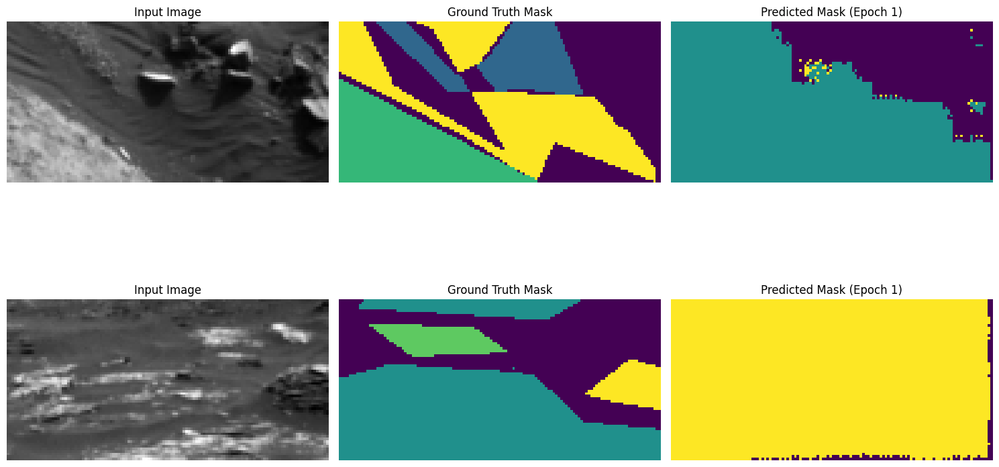

314/314 [==============================] - 68s 168ms/step - loss: 1.3318 - accuracy: 0.3765 - mean_io_u: 0.1288 - custom_mean_iou: 0.1112 - val_loss: 1.2711 - val_accuracy: 0.3871 - val_mean_io_u: 0.0931 - val_custom_mean_iou: 0.0740 - lr: 1.0000e-04
Epoch 2/1000
313/314 [============================>.] - ETA: 0s - loss: 1.1347 - accuracy: 0.4863 - mean_io_u: 0.2238 - custom_mean_iou: 0.1949Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 2: val_custom_mean_iou improved to 0.2066, saving model.

Epoch 2: val_loss improved from 1.27114 to 1.07250, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


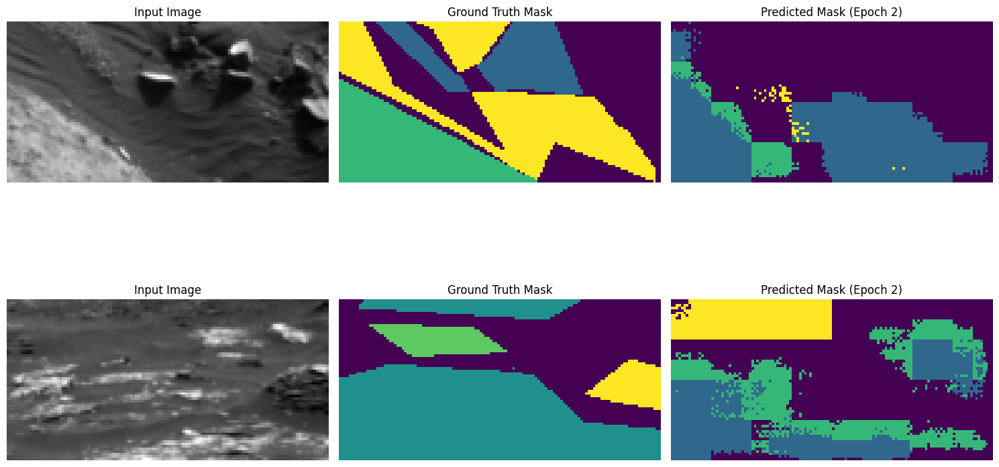

314/314 [==============================] - 48s 152ms/step - loss: 1.1347 - accuracy: 0.4863 - mean_io_u: 0.2238 - custom_mean_iou: 0.1949 - val_loss: 1.0725 - val_accuracy: 0.5477 - val_mean_io_u: 0.2411 - val_custom_mean_iou: 0.2066 - lr: 1.0000e-04
Epoch 3/1000
313/314 [============================>.] - ETA: 0s - loss: 1.0517 - accuracy: 0.5369 - mean_io_u: 0.2623 - custom_mean_iou: 0.2286Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 3: val_custom_mean_iou improved to 0.2685, saving model.

Epoch 3: val_loss improved from 1.07250 to 0.96680, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


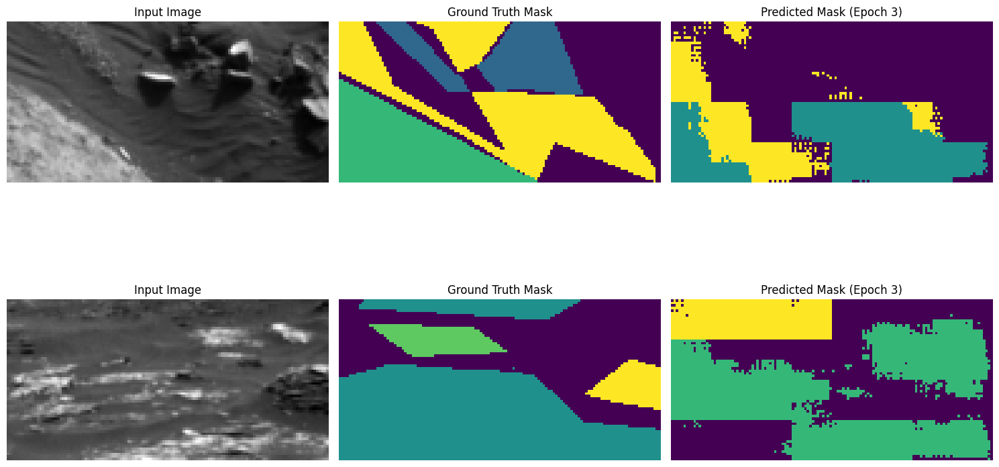

314/314 [==============================] - 48s 152ms/step - loss: 1.0517 - accuracy: 0.5369 - mean_io_u: 0.2624 - custom_mean_iou: 0.2286 - val_loss: 0.9668 - val_accuracy: 0.6002 - val_mean_io_u: 0.3124 - val_custom_mean_iou: 0.2685 - lr: 1.0000e-04
Epoch 4/1000
313/314 [============================>.] - ETA: 0s - loss: 0.9884 - accuracy: 0.5816 - mean_io_u: 0.3005 - custom_mean_iou: 0.2608Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 4: val_custom_mean_iou improved to 0.2822, saving model.

Epoch 4: val_loss improved from 0.96680 to 0.95397, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


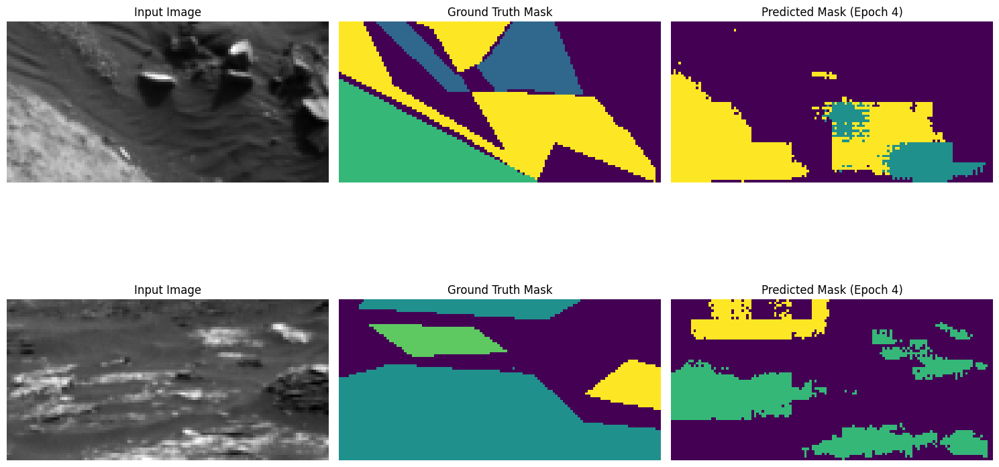

314/314 [==============================] - 48s 152ms/step - loss: 0.9885 - accuracy: 0.5815 - mean_io_u: 0.3004 - custom_mean_iou: 0.2607 - val_loss: 0.9540 - val_accuracy: 0.6073 - val_mean_io_u: 0.3194 - val_custom_mean_iou: 0.2822 - lr: 1.0000e-04
Epoch 5/1000
313/314 [============================>.] - ETA: 0s - loss: 0.9435 - accuracy: 0.6089 - mean_io_u: 0.3266 - custom_mean_iou: 0.2821Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 5: val_custom_mean_iou improved to 0.3090, saving model.

Epoch 5: val_loss improved from 0.95397 to 0.88823, saving model to best_model.keras
1/1 [==============================] - 0s 20ms/step


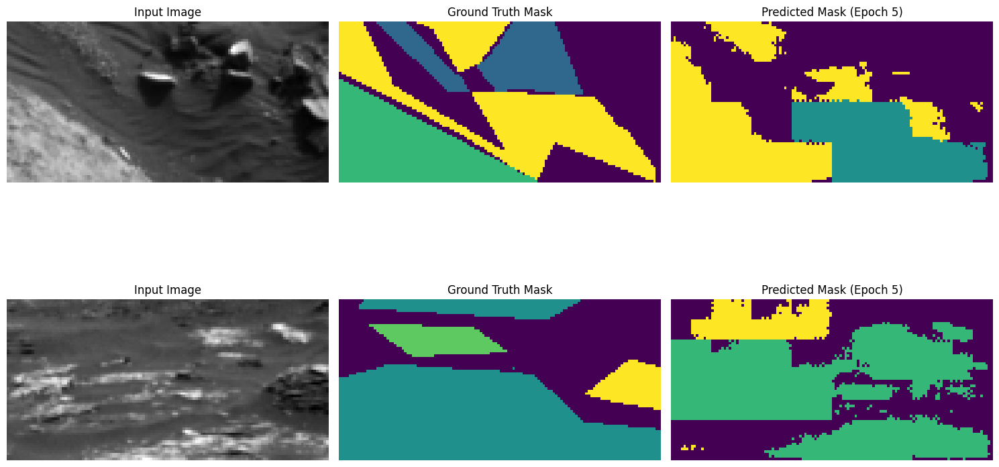

314/314 [==============================] - 48s 152ms/step - loss: 0.9435 - accuracy: 0.6088 - mean_io_u: 0.3265 - custom_mean_iou: 0.2821 - val_loss: 0.8882 - val_accuracy: 0.6407 - val_mean_io_u: 0.3598 - val_custom_mean_iou: 0.3090 - lr: 1.0000e-04
Epoch 6/1000
313/314 [============================>.] - ETA: 0s - loss: 0.9244 - accuracy: 0.6184 - mean_io_u: 0.3313 - custom_mean_iou: 0.2868Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 6: val_loss did not improve from 0.88823
1/1 [==============================] - 0s 19ms/step


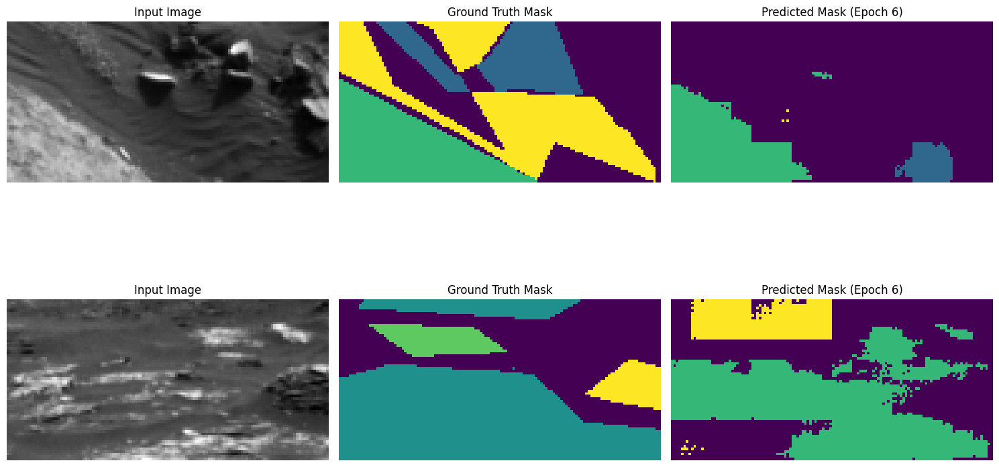

314/314 [==============================] - 47s 148ms/step - loss: 0.9245 - accuracy: 0.6183 - mean_io_u: 0.3313 - custom_mean_iou: 0.2867 - val_loss: 0.9129 - val_accuracy: 0.6309 - val_mean_io_u: 0.3422 - val_custom_mean_iou: 0.2995 - lr: 1.0000e-04
Epoch 7/1000
313/314 [============================>.] - ETA: 0s - loss: 0.8903 - accuracy: 0.6376 - mean_io_u: 0.3467 - custom_mean_iou: 0.3004Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 7: val_loss improved from 0.88823 to 0.88254, saving model to best_model.keras
1/1 [==============================] - 0s 21ms/step


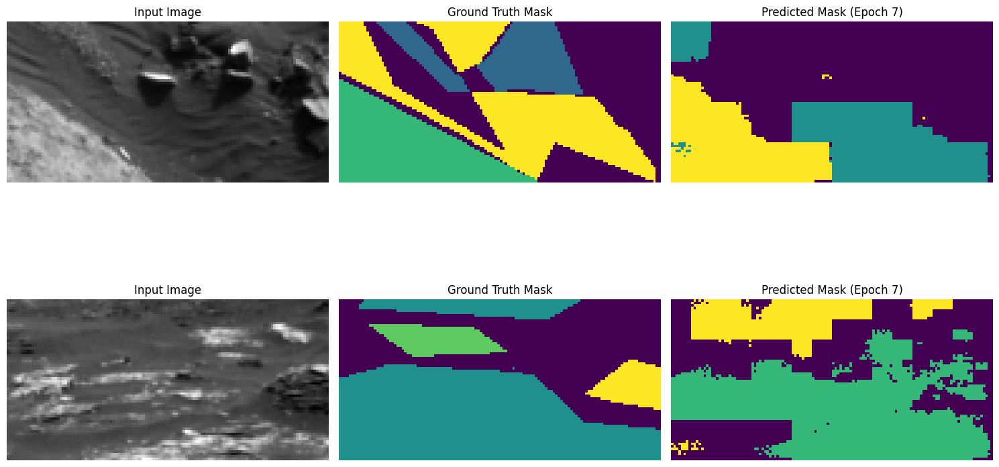

314/314 [==============================] - 47s 150ms/step - loss: 0.8904 - accuracy: 0.6375 - mean_io_u: 0.3466 - custom_mean_iou: 0.3003 - val_loss: 0.8825 - val_accuracy: 0.6527 - val_mean_io_u: 0.3495 - val_custom_mean_iou: 0.3024 - lr: 1.0000e-04
Epoch 8/1000
313/314 [============================>.] - ETA: 0s - loss: 0.8693 - accuracy: 0.6491 - mean_io_u: 0.3546 - custom_mean_iou: 0.3081Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 8: val_custom_mean_iou improved to 0.3440, saving model.

Epoch 8: val_loss improved from 0.88254 to 0.81095, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


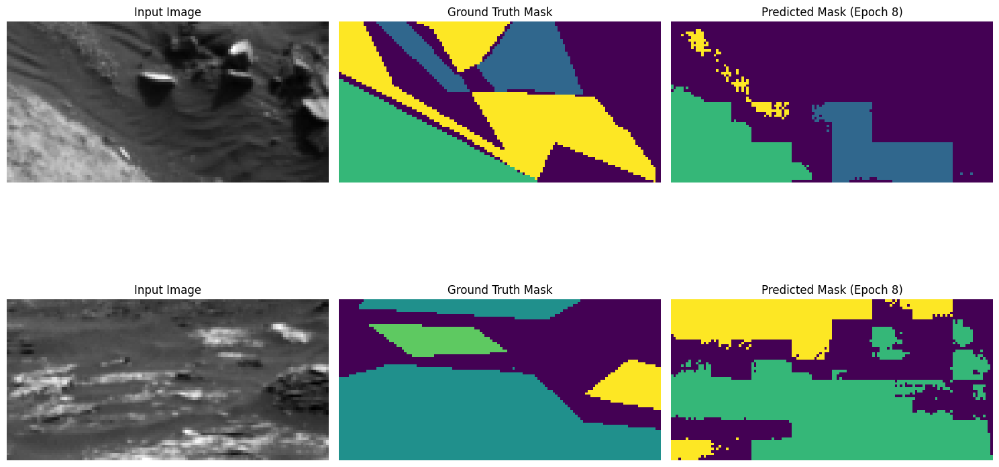

314/314 [==============================] - 48s 152ms/step - loss: 0.8692 - accuracy: 0.6491 - mean_io_u: 0.3546 - custom_mean_iou: 0.3081 - val_loss: 0.8110 - val_accuracy: 0.6916 - val_mean_io_u: 0.3974 - val_custom_mean_iou: 0.3440 - lr: 1.0000e-04
Epoch 9/1000
313/314 [============================>.] - ETA: 0s - loss: 0.8453 - accuracy: 0.6610 - mean_io_u: 0.3639 - custom_mean_iou: 0.3164Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 9: val_custom_mean_iou improved to 0.3440, saving model.

Epoch 9: val_loss improved from 0.81095 to 0.78506, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


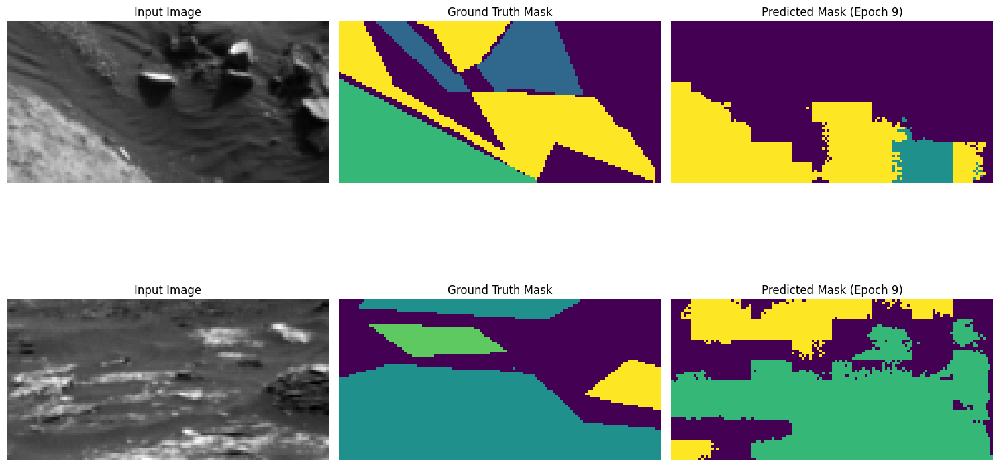

314/314 [==============================] - 48s 152ms/step - loss: 0.8453 - accuracy: 0.6611 - mean_io_u: 0.3639 - custom_mean_iou: 0.3165 - val_loss: 0.7851 - val_accuracy: 0.6985 - val_mean_io_u: 0.3935 - val_custom_mean_iou: 0.3440 - lr: 1.0000e-04
Epoch 10/1000
313/314 [============================>.] - ETA: 0s - loss: 0.8230 - accuracy: 0.6703 - mean_io_u: 0.3709 - custom_mean_iou: 0.3231Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 10: val_custom_mean_iou improved to 0.3449, saving model.

Epoch 10: val_loss did not improve from 0.78506
1/1 [==============================] - 0s 19ms/step


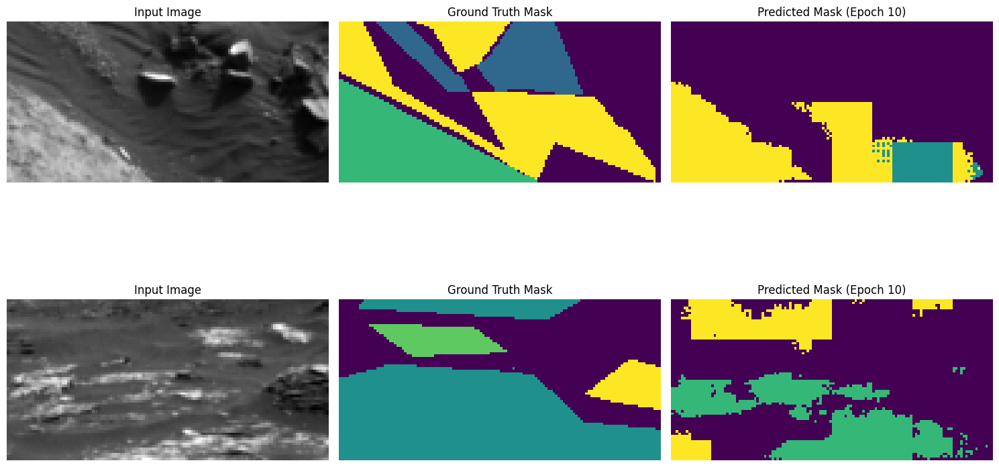

314/314 [==============================] - 47s 149ms/step - loss: 0.8231 - accuracy: 0.6703 - mean_io_u: 0.3708 - custom_mean_iou: 0.3230 - val_loss: 0.7963 - val_accuracy: 0.6972 - val_mean_io_u: 0.3880 - val_custom_mean_iou: 0.3449 - lr: 1.0000e-04
Epoch 11/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7963 - accuracy: 0.6829 - mean_io_u: 0.3829 - custom_mean_iou: 0.3334Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 11: val_custom_mean_iou improved to 0.3471, saving model.

Epoch 11: val_loss did not improve from 0.78506
1/1 [==============================] - 0s 19ms/step


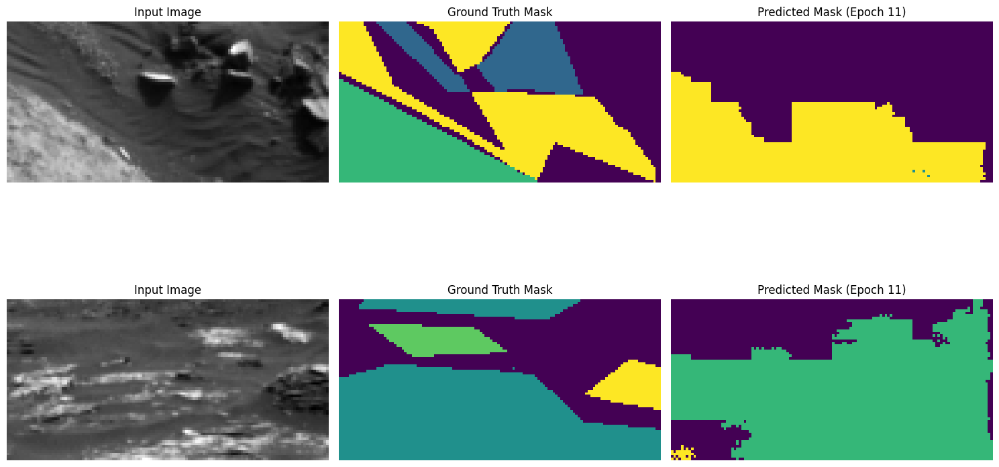

314/314 [==============================] - 47s 149ms/step - loss: 0.7962 - accuracy: 0.6829 - mean_io_u: 0.3830 - custom_mean_iou: 0.3334 - val_loss: 0.8109 - val_accuracy: 0.6941 - val_mean_io_u: 0.3999 - val_custom_mean_iou: 0.3471 - lr: 1.0000e-04
Epoch 12/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7803 - accuracy: 0.6902 - mean_io_u: 0.3883 - custom_mean_iou: 0.3386Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 12: val_loss did not improve from 0.78506
1/1 [==============================] - 0s 18ms/step


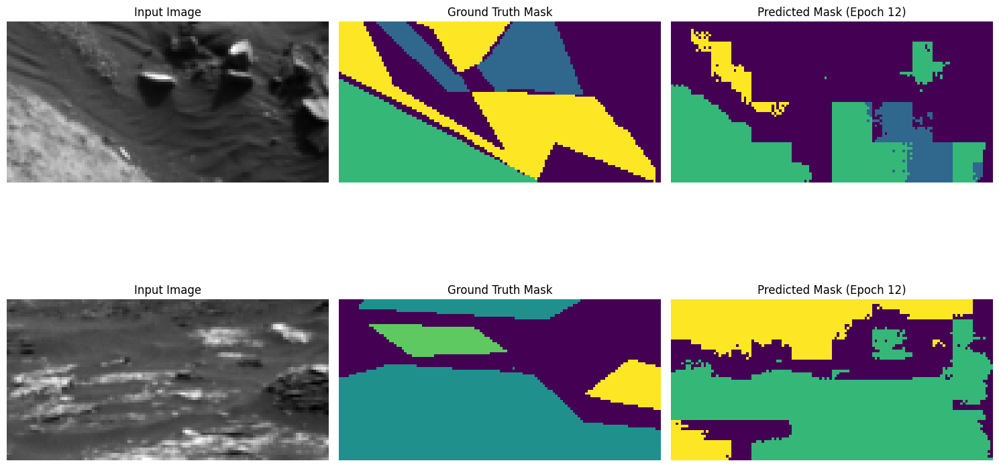

314/314 [==============================] - 46s 147ms/step - loss: 0.7803 - accuracy: 0.6902 - mean_io_u: 0.3883 - custom_mean_iou: 0.3386 - val_loss: 0.8165 - val_accuracy: 0.6868 - val_mean_io_u: 0.3951 - val_custom_mean_iou: 0.3404 - lr: 1.0000e-04
Epoch 13/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7699 - accuracy: 0.6950 - mean_io_u: 0.3934 - custom_mean_iou: 0.3426Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 13: val_custom_mean_iou improved to 0.3573, saving model.

Epoch 13: val_loss improved from 0.78506 to 0.76536, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


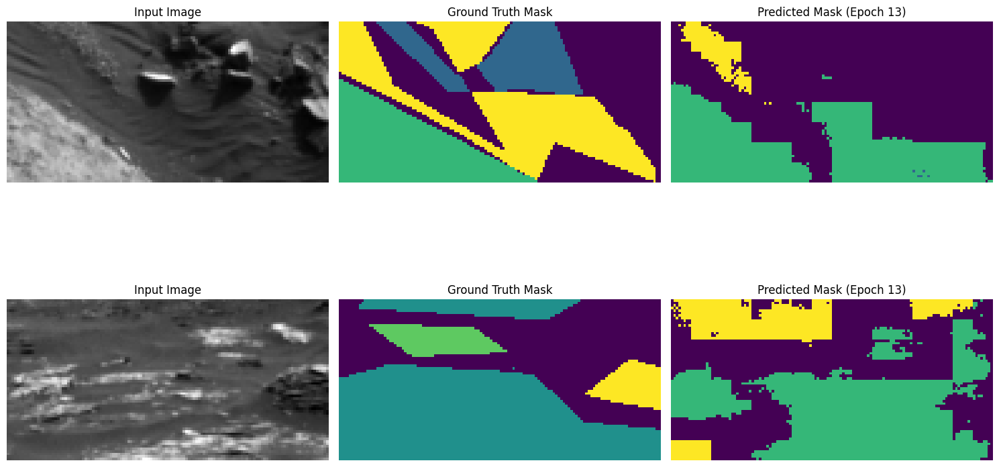

314/314 [==============================] - 48s 152ms/step - loss: 0.7700 - accuracy: 0.6950 - mean_io_u: 0.3933 - custom_mean_iou: 0.3426 - val_loss: 0.7654 - val_accuracy: 0.7098 - val_mean_io_u: 0.4103 - val_custom_mean_iou: 0.3573 - lr: 1.0000e-04
Epoch 14/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7458 - accuracy: 0.7058 - mean_io_u: 0.4037 - custom_mean_iou: 0.3520Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 14: val_loss did not improve from 0.76536
1/1 [==============================] - 0s 19ms/step


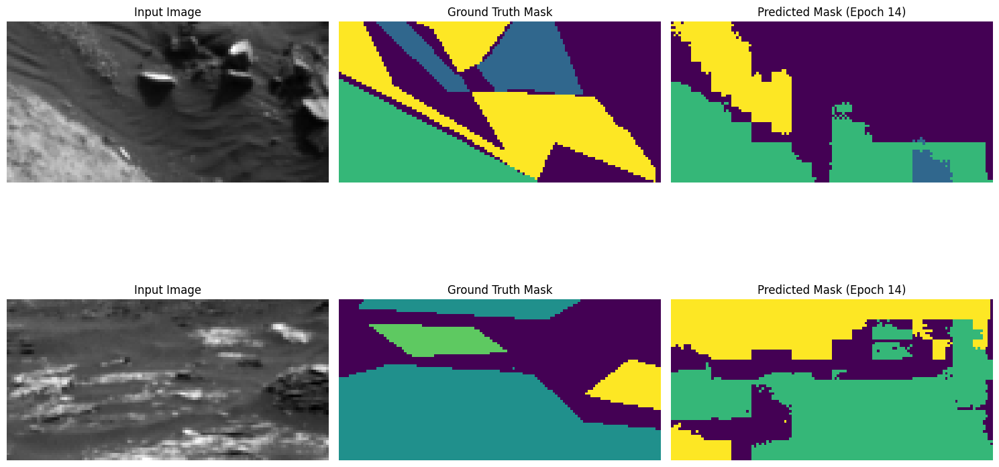

314/314 [==============================] - 46s 147ms/step - loss: 0.7459 - accuracy: 0.7057 - mean_io_u: 0.4037 - custom_mean_iou: 0.3520 - val_loss: 0.8141 - val_accuracy: 0.6848 - val_mean_io_u: 0.4000 - val_custom_mean_iou: 0.3421 - lr: 1.0000e-04
Epoch 15/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7392 - accuracy: 0.7074 - mean_io_u: 0.4044 - custom_mean_iou: 0.3526Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 15: val_loss did not improve from 0.76536
1/1 [==============================] - 0s 19ms/step


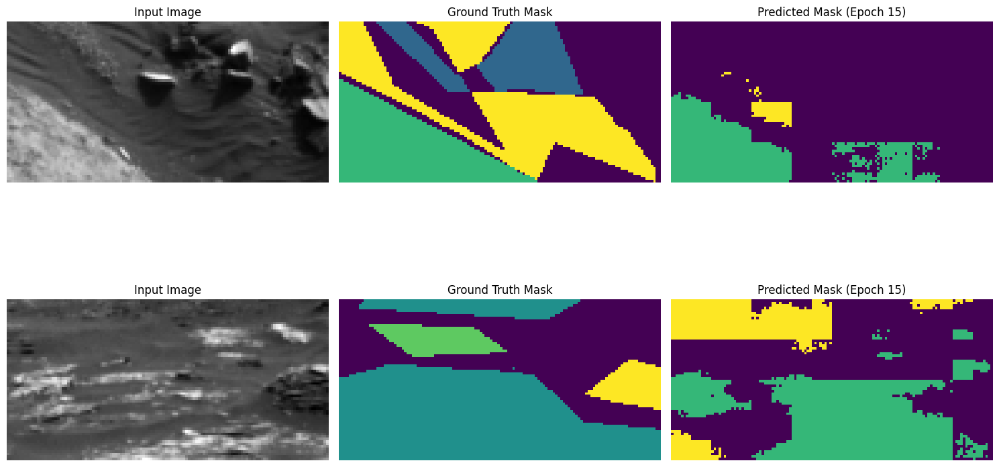

314/314 [==============================] - 46s 147ms/step - loss: 0.7391 - accuracy: 0.7074 - mean_io_u: 0.4045 - custom_mean_iou: 0.3527 - val_loss: 0.7783 - val_accuracy: 0.7048 - val_mean_io_u: 0.3996 - val_custom_mean_iou: 0.3524 - lr: 1.0000e-04
Epoch 16/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7251 - accuracy: 0.7132 - mean_io_u: 0.4089 - custom_mean_iou: 0.3570Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 16: val_loss improved from 0.76536 to 0.75361, saving model to best_model.keras
1/1 [==============================] - 0s 22ms/step


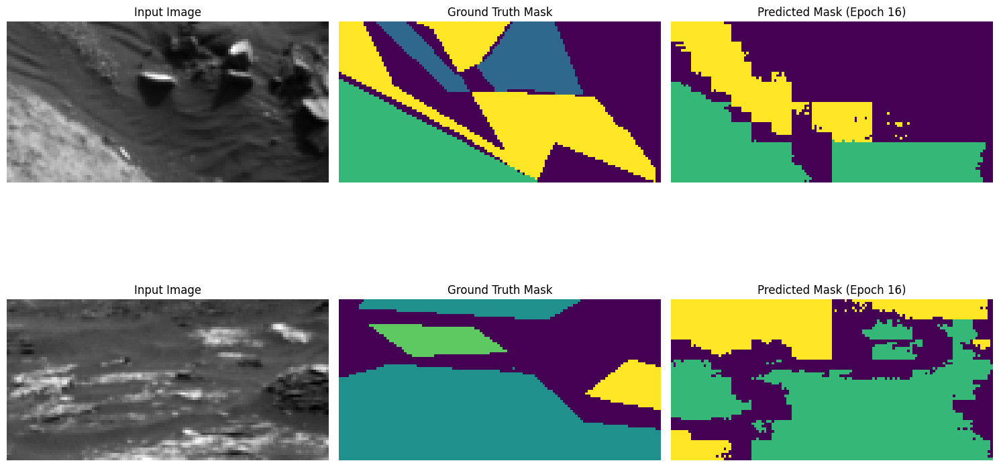

314/314 [==============================] - 48s 152ms/step - loss: 0.7251 - accuracy: 0.7132 - mean_io_u: 0.4089 - custom_mean_iou: 0.3570 - val_loss: 0.7536 - val_accuracy: 0.7081 - val_mean_io_u: 0.4103 - val_custom_mean_iou: 0.3553 - lr: 1.0000e-04
Epoch 17/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7033 - accuracy: 0.7247 - mean_io_u: 0.4194 - custom_mean_iou: 0.3666Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 17: val_loss did not improve from 0.75361
1/1 [==============================] - 0s 18ms/step


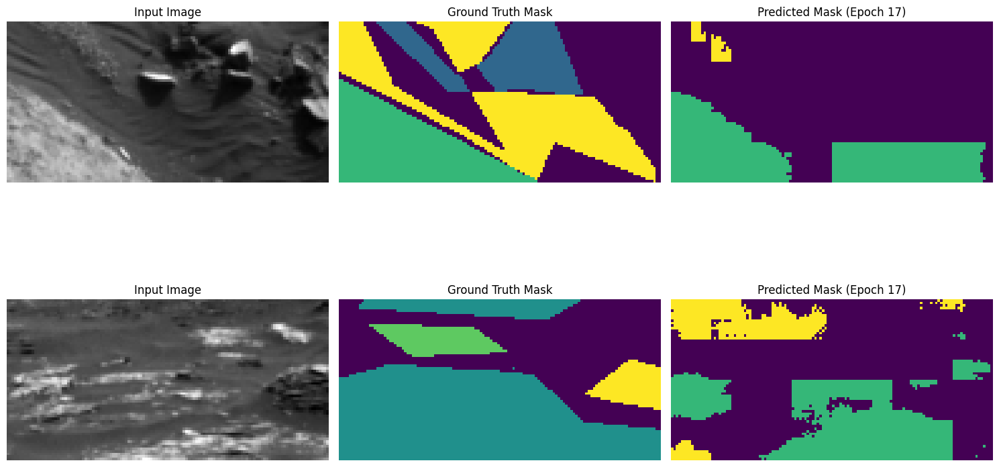

314/314 [==============================] - 46s 147ms/step - loss: 0.7033 - accuracy: 0.7247 - mean_io_u: 0.4195 - custom_mean_iou: 0.3666 - val_loss: 0.8093 - val_accuracy: 0.7047 - val_mean_io_u: 0.3891 - val_custom_mean_iou: 0.3505 - lr: 1.0000e-04
Epoch 18/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6941 - accuracy: 0.7289 - mean_io_u: 0.4249 - custom_mean_iou: 0.3720Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 18: val_custom_mean_iou improved to 0.3589, saving model.

Epoch 18: val_loss improved from 0.75361 to 0.74555, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


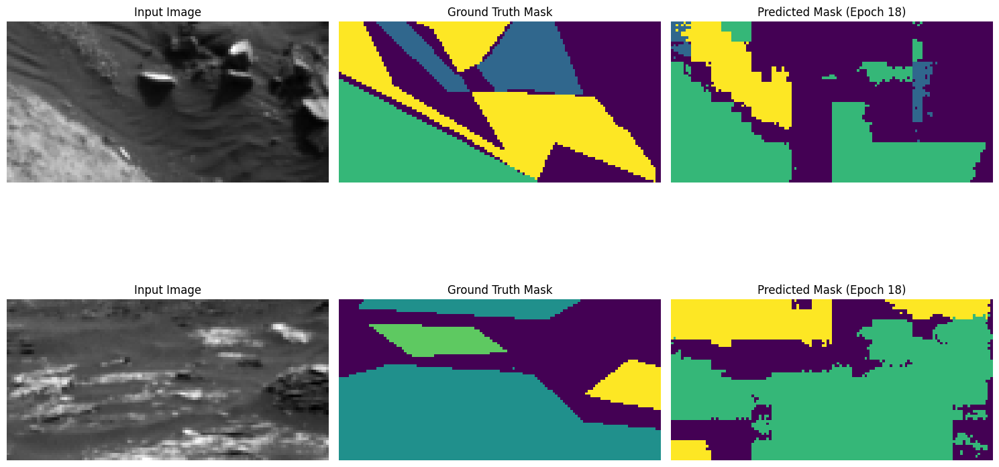

314/314 [==============================] - 48s 152ms/step - loss: 0.6940 - accuracy: 0.7289 - mean_io_u: 0.4249 - custom_mean_iou: 0.3721 - val_loss: 0.7455 - val_accuracy: 0.7105 - val_mean_io_u: 0.4142 - val_custom_mean_iou: 0.3589 - lr: 1.0000e-04
Epoch 19/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6822 - accuracy: 0.7320 - mean_io_u: 0.4271 - custom_mean_iou: 0.3738Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 19: val_loss improved from 0.74555 to 0.74336, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


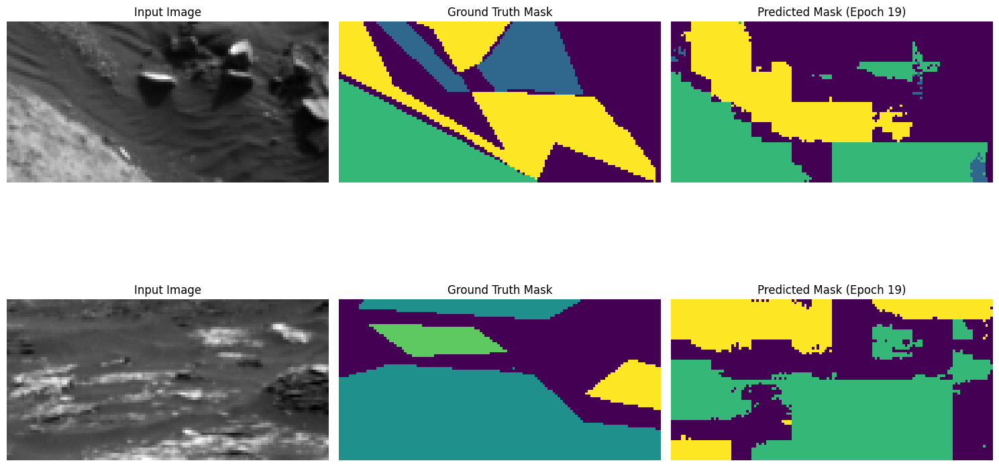

314/314 [==============================] - 47s 150ms/step - loss: 0.6823 - accuracy: 0.7319 - mean_io_u: 0.4270 - custom_mean_iou: 0.3738 - val_loss: 0.7434 - val_accuracy: 0.7134 - val_mean_io_u: 0.4124 - val_custom_mean_iou: 0.3586 - lr: 1.0000e-04
Epoch 20/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6638 - accuracy: 0.7408 - mean_io_u: 0.4346 - custom_mean_iou: 0.3816Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 20: val_custom_mean_iou improved to 0.3594, saving model.

Epoch 20: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 20ms/step


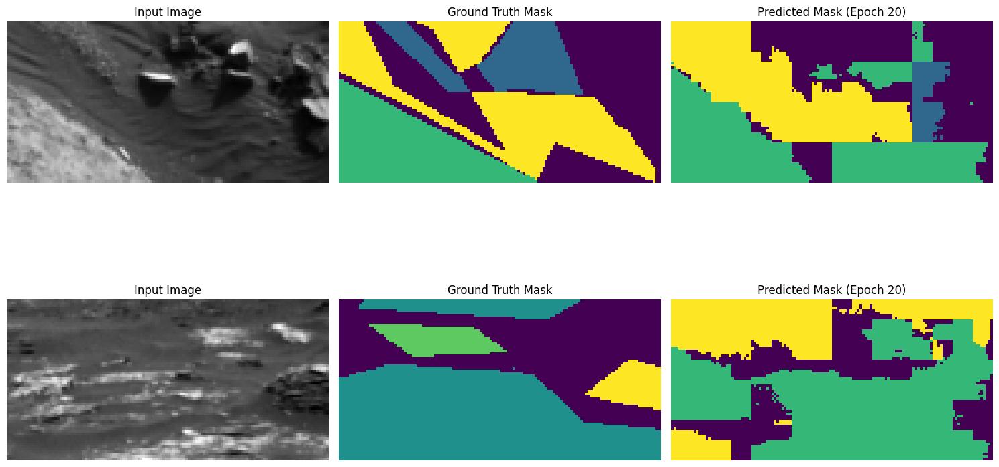

314/314 [==============================] - 47s 149ms/step - loss: 0.6637 - accuracy: 0.7409 - mean_io_u: 0.4346 - custom_mean_iou: 0.3816 - val_loss: 0.7877 - val_accuracy: 0.7083 - val_mean_io_u: 0.4229 - val_custom_mean_iou: 0.3594 - lr: 1.0000e-04
Epoch 21/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6349 - accuracy: 0.7530 - mean_io_u: 0.4485 - custom_mean_iou: 0.3938Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 21: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 19ms/step


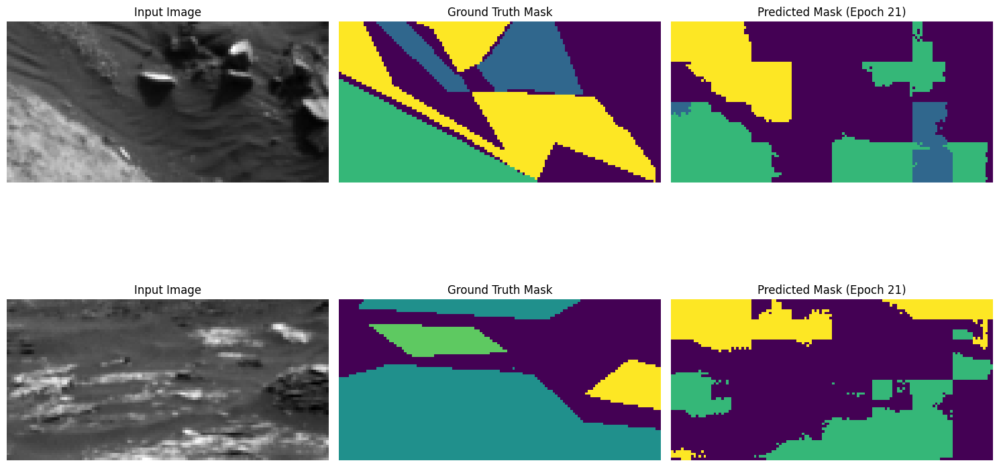

314/314 [==============================] - 46s 147ms/step - loss: 0.6349 - accuracy: 0.7530 - mean_io_u: 0.4485 - custom_mean_iou: 0.3938 - val_loss: 0.8415 - val_accuracy: 0.6945 - val_mean_io_u: 0.3757 - val_custom_mean_iou: 0.3339 - lr: 1.0000e-04
Epoch 22/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6199 - accuracy: 0.7596 - mean_io_u: 0.4605 - custom_mean_iou: 0.4056Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 22: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 22ms/step


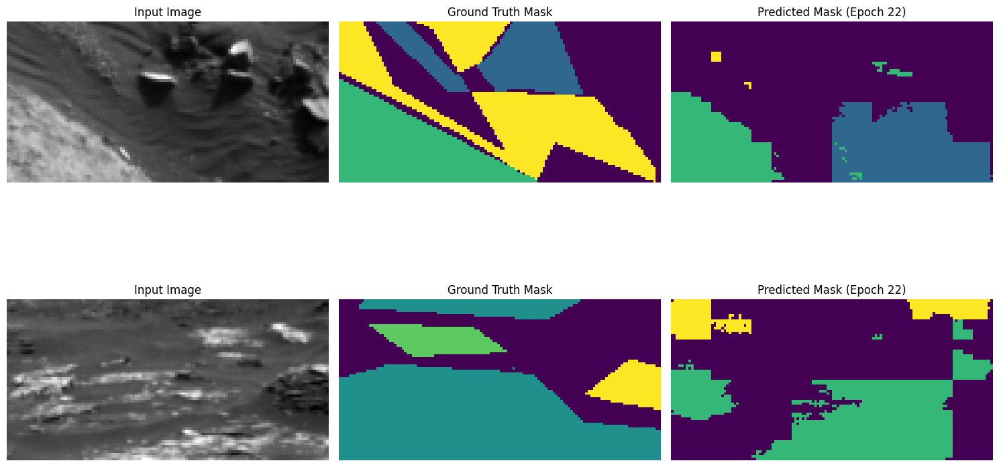

314/314 [==============================] - 46s 147ms/step - loss: 0.6200 - accuracy: 0.7596 - mean_io_u: 0.4605 - custom_mean_iou: 0.4056 - val_loss: 0.7844 - val_accuracy: 0.7134 - val_mean_io_u: 0.3969 - val_custom_mean_iou: 0.3538 - lr: 1.0000e-04
Epoch 23/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6100 - accuracy: 0.7638 - mean_io_u: 0.4607 - custom_mean_iou: 0.4060Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 23: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 18ms/step


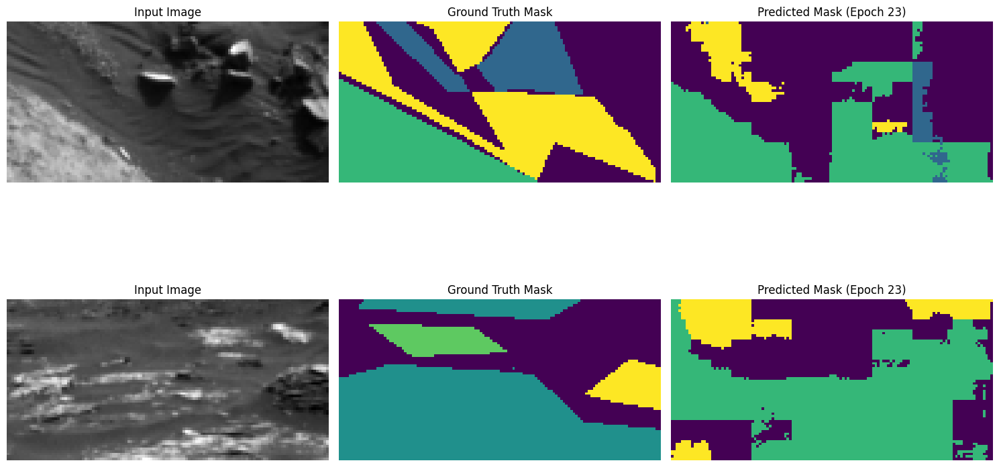

314/314 [==============================] - 46s 147ms/step - loss: 0.6100 - accuracy: 0.7638 - mean_io_u: 0.4607 - custom_mean_iou: 0.4060 - val_loss: 0.7648 - val_accuracy: 0.7125 - val_mean_io_u: 0.4087 - val_custom_mean_iou: 0.3563 - lr: 1.0000e-04
Epoch 24/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5865 - accuracy: 0.7730 - mean_io_u: 0.4692 - custom_mean_iou: 0.4140Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 24: val_custom_mean_iou improved to 0.3662, saving model.

Epoch 24: val_loss did not improve from 0.74336

Epoch 24: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
1/1 [==============================] - 0s 19ms/step


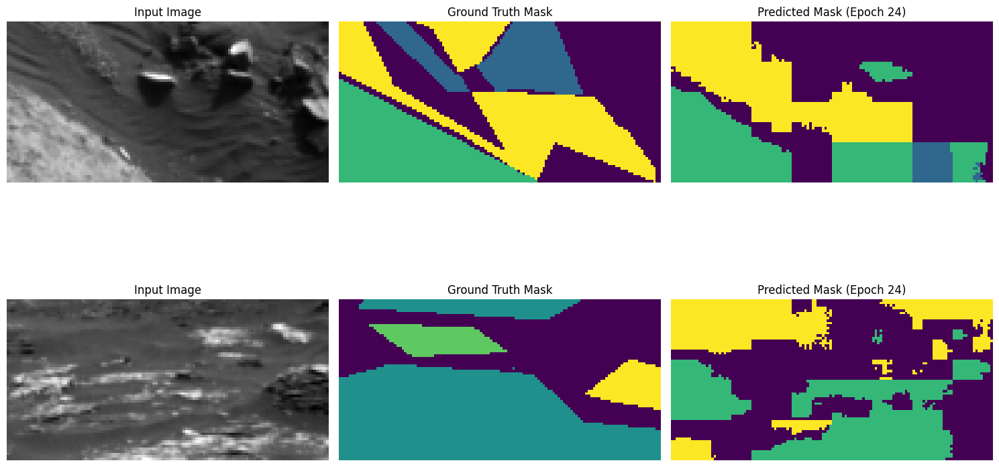

314/314 [==============================] - 47s 149ms/step - loss: 0.5865 - accuracy: 0.7730 - mean_io_u: 0.4693 - custom_mean_iou: 0.4141 - val_loss: 0.7571 - val_accuracy: 0.7218 - val_mean_io_u: 0.4172 - val_custom_mean_iou: 0.3662 - lr: 1.0000e-04
Epoch 25/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5194 - accuracy: 0.8006 - mean_io_u: 0.5033 - custom_mean_iou: 0.4484Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 25: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 18ms/step


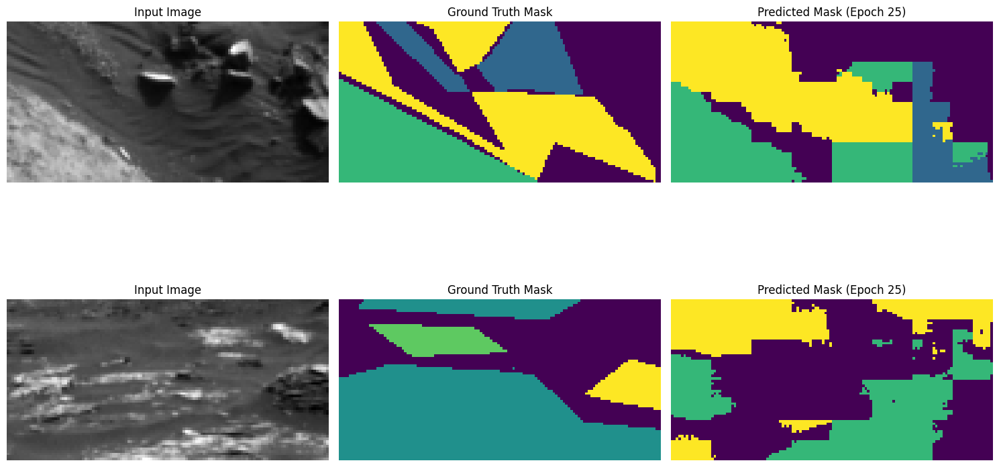

314/314 [==============================] - 46s 148ms/step - loss: 0.5194 - accuracy: 0.8006 - mean_io_u: 0.5032 - custom_mean_iou: 0.4484 - val_loss: 0.8006 - val_accuracy: 0.7098 - val_mean_io_u: 0.4090 - val_custom_mean_iou: 0.3579 - lr: 5.0000e-05
Epoch 26/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5006 - accuracy: 0.8090 - mean_io_u: 0.5116 - custom_mean_iou: 0.4570Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 26: val_custom_mean_iou improved to 0.3716, saving model.

Epoch 26: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 19ms/step


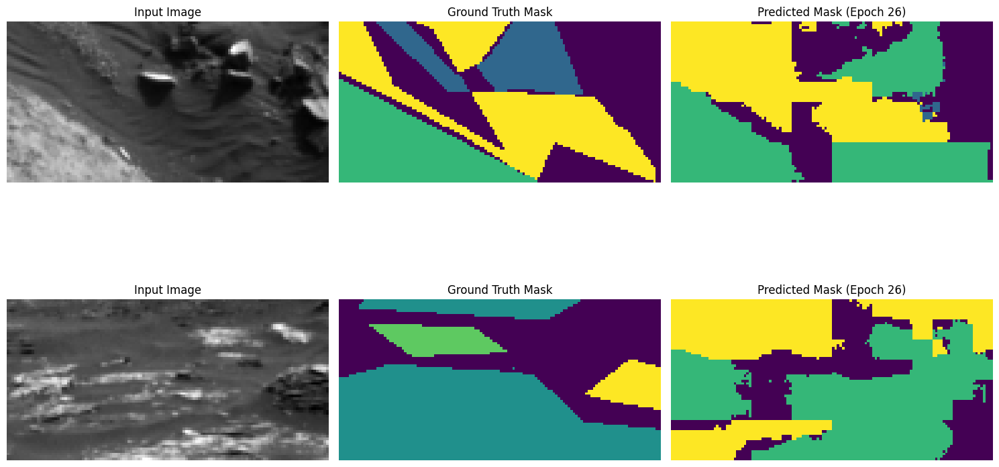

314/314 [==============================] - 47s 149ms/step - loss: 0.5006 - accuracy: 0.8090 - mean_io_u: 0.5116 - custom_mean_iou: 0.4571 - val_loss: 0.7852 - val_accuracy: 0.7228 - val_mean_io_u: 0.4261 - val_custom_mean_iou: 0.3716 - lr: 5.0000e-05
Epoch 27/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4844 - accuracy: 0.8151 - mean_io_u: 0.5168 - custom_mean_iou: 0.4630Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 27: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 19ms/step


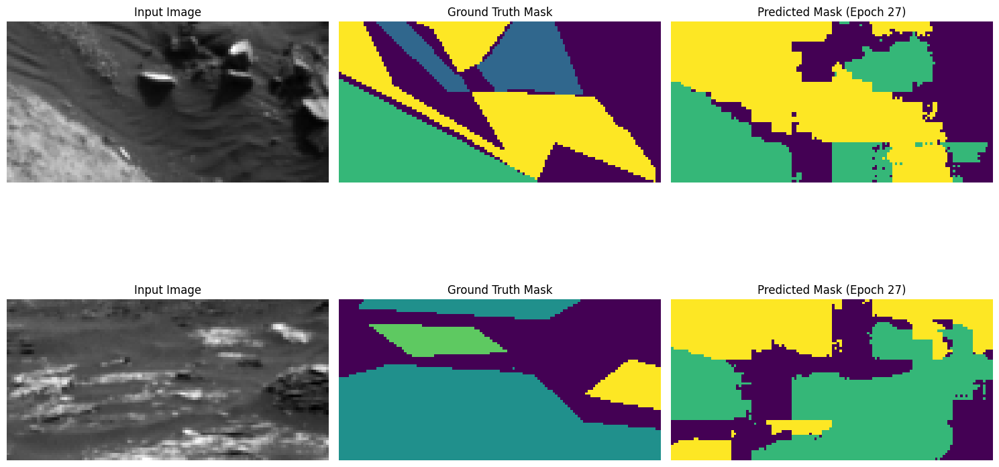

314/314 [==============================] - 46s 147ms/step - loss: 0.4845 - accuracy: 0.8150 - mean_io_u: 0.5168 - custom_mean_iou: 0.4629 - val_loss: 0.8095 - val_accuracy: 0.7121 - val_mean_io_u: 0.4225 - val_custom_mean_iou: 0.3689 - lr: 5.0000e-05
Epoch 28/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4719 - accuracy: 0.8199 - mean_io_u: 0.5243 - custom_mean_iou: 0.4705Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 28: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 21ms/step


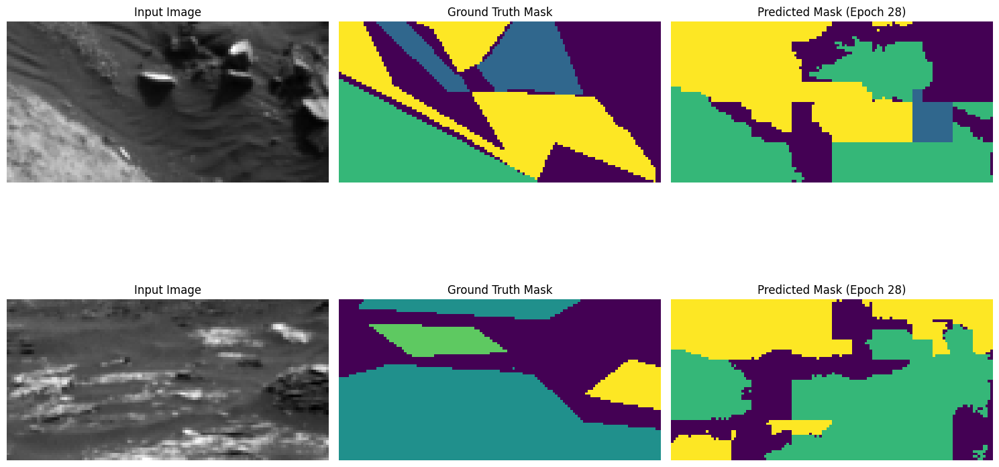

314/314 [==============================] - 46s 147ms/step - loss: 0.4718 - accuracy: 0.8199 - mean_io_u: 0.5243 - custom_mean_iou: 0.4706 - val_loss: 0.8444 - val_accuracy: 0.7176 - val_mean_io_u: 0.4285 - val_custom_mean_iou: 0.3702 - lr: 5.0000e-05
Epoch 29/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4559 - accuracy: 0.8267 - mean_io_u: 0.5291 - custom_mean_iou: 0.4769Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 29: val_loss did not improve from 0.74336

Epoch 29: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
1/1 [==============================] - 0s 18ms/step


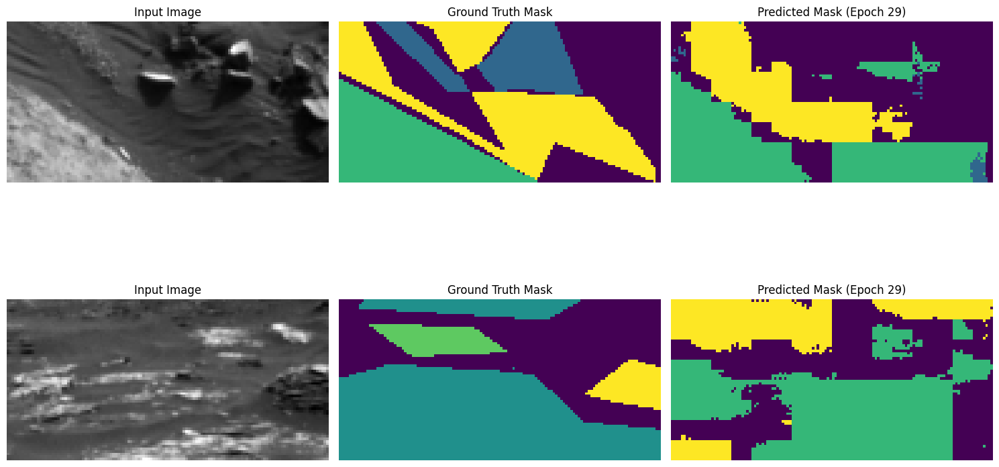

314/314 [==============================] - 46s 147ms/step - loss: 0.4559 - accuracy: 0.8267 - mean_io_u: 0.5291 - custom_mean_iou: 0.4769 - val_loss: 0.8261 - val_accuracy: 0.7071 - val_mean_io_u: 0.4144 - val_custom_mean_iou: 0.3646 - lr: 5.0000e-05


In [23]:
import tensorflow as tf
from tensorflow.keras import layers as tfkl

# Residual Block
def residual_block_FG(x, filters):
    shortcut = x
    x = tfkl.Conv2D(filters, (2, 2), activation='relu', padding='same')(x)
    x = tfkl.Conv2D(filters, (2, 2), activation='relu', padding='same')(x)
    shortcut = tfkl.Conv2D(filters, (1, 1), padding='same')(shortcut)
    return tfkl.add([x, shortcut])

def residual_block_CG(x, filters, dilation_rate=1):
    shortcut = x
    x = tfkl.Conv2D(filters, (3, 3), padding='same', dilation_rate=dilation_rate)(x)
    x = tfkl.Activation('relu')(x)
    x = tfkl.Conv2D(filters, (3, 3), padding='same', dilation_rate=dilation_rate)(x)
    if shortcut.shape[-1] != filters:
        shortcut = tfkl.Conv2D(filters, (1, 1), padding='same')(shortcut)
    x = tfkl.Add()([x, shortcut])
    x = tfkl.Activation('relu')(x)
    return x

# Dice Loss
def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred, axis=(1, 2, 3))
    denominator = tf.reduce_sum(y_true + y_pred, axis=(1, 2, 3))
    return tf.reduce_mean(1 - numerator / (denominator + tf.keras.backend.epsilon()))

# Hybrid Loss Function
def combined_loss(weights):
    ce_loss = weighted_categorical_crossentropy(weights)
    def loss(y_true, y_pred):
        return ce_loss(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

# U-Net with Residual Connections
def fine_grained_unet(input_shape, num_classes):
    inputs = tfkl.Input(input_shape)

    # Encoder
    c1 = residual_block_FG(inputs, 64)
    p1 = tfkl.MaxPooling2D((2, 2))(c1)

    c2 = residual_block_FG(p1, 128)
    p2 = tfkl.MaxPooling2D((2, 2))(c2)

    c3 = residual_block_FG(p2, 256)
    p3 = tfkl.MaxPooling2D((2, 2))(c3)

    c4 = residual_block_FG(p3, 512)
    p4 = tfkl.MaxPooling2D((2, 2))(c4)

    c5 = residual_block_FG(p4, 1024)

    # Decoder
    u1 = tfkl.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = tfkl.concatenate([u1, c4])
    d1 = residual_block_FG(u1, 512)

    u2 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(d1)
    u2 = tfkl.concatenate([u2, c3])
    d2 = residual_block_FG(u2, 256)

    u3 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(d2)
    u3 = tfkl.concatenate([u3, c2])
    d3 = residual_block_FG(u3, 128)

    u4 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(d3)
    u4 = tfkl.concatenate([u4, c1])
    d4 = residual_block_FG(u4, 64)

    outputs = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(d4)

    return tf.keras.Model(inputs, outputs)

def coarse_grained_unet(input_shape, num_classes):
    inputs = tfkl.Input(shape=input_shape)

    c1 = residual_block_CG(inputs, 64)
    p1 = tfkl.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(c1)
    
    c2 = residual_block_CG(p1, 128)
    p2 = tfkl.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(c2)
    
    b = residual_block_CG(p2, 256, dilation_rate=2)
    
    u1 = tfkl.Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same')(b)

    u1 = tfkl.concatenate([u1, c2], axis=-1)
    d1 = residual_block_CG(u1, 128)
    
    u2 = tfkl.Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(d1)
    u2 = tfkl.concatenate([u2, c1], axis=-1)
    d2 = residual_block_CG(u2, 64)

    outputs = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(d2)

    return tf.keras.Model(inputs, outputs)
    

# Initialize the model
input_shape = X_train.shape[1:]
num_classes = 5  # Replace with your number of classes
ignore_class = 0  # Class to ignore

custom_mean_iou = CustomMeanIoU(num_classes=num_classes, ignore_class=0)

fine_unet = fine_grained_unet(input_shape, num_classes)

# Define the optimizer with a specific learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
mean_iou = tfk.metrics.MeanIoU(num_classes=num_classes, ignore_class=0, sparse_y_pred=False)
# Compile the model
fine_unet.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy", mean_iou, custom_mean_iou])


#from tensorflow.keras.utils import plot_model
#plot_model(model, to_file="model.png", show_shapes=True, show_layer_names=True)

#fine_unet.summary()
# Define callbacks
save_best_miou = SaveBestMeanIoU(filepath="best_fg_mean_iou.h5", monitor="val_custom_mean_iou", mode="max", verbose=1)


# Training the model
fine_unet.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),  # Add validation data
    #batch_size=32,
    epochs=1000,
    callbacks=[save_best_miou, early_stopping, model_checkpoint, reduce_lr, visualize_callback]
)



Epoch 1/1000
314/314 [==============================] - ETA: 0s - loss: 1.3585 - accuracy: 0.3523 - mean_io_u: 0.1058 - custom_mean_iou: 0.0892Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 1: val_custom_mean_iou improved to 0.0696, saving model.

Epoch 1: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 19ms/step


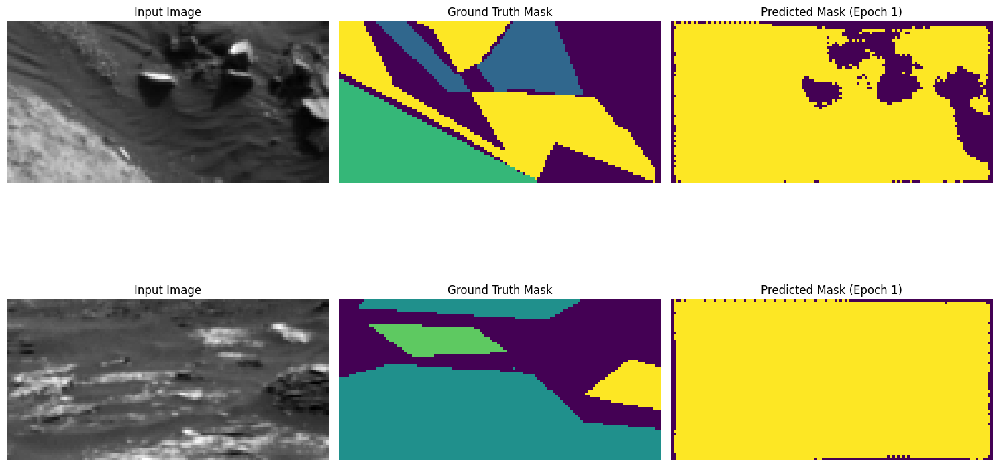

314/314 [==============================] - 41s 102ms/step - loss: 1.3585 - accuracy: 0.3523 - mean_io_u: 0.1058 - custom_mean_iou: 0.0892 - val_loss: 1.2937 - val_accuracy: 0.3678 - val_mean_io_u: 0.0892 - val_custom_mean_iou: 0.0696 - lr: 1.0000e-04
Epoch 2/1000
313/314 [============================>.] - ETA: 0s - loss: 1.1487 - accuracy: 0.4666 - mean_io_u: 0.2062 - custom_mean_iou: 0.1799Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 2: val_custom_mean_iou improved to 0.1934, saving model.

Epoch 2: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 18ms/step


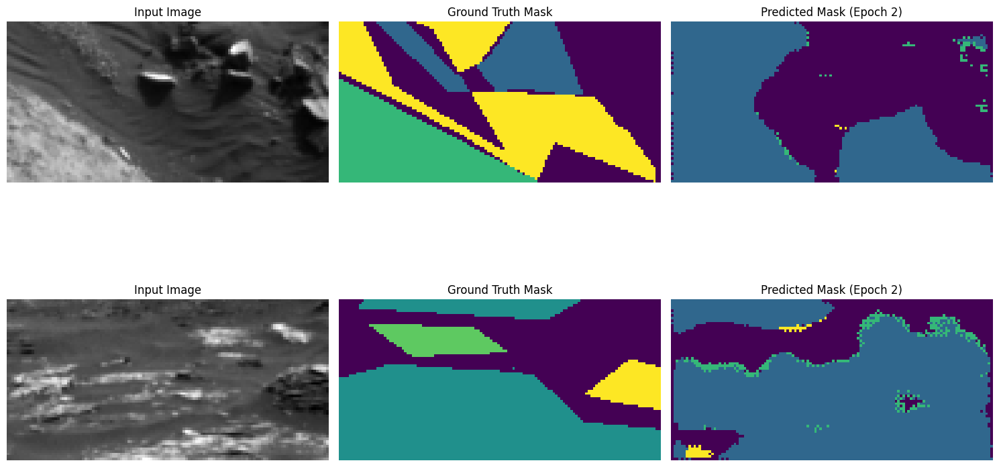

314/314 [==============================] - 29s 93ms/step - loss: 1.1487 - accuracy: 0.4666 - mean_io_u: 0.2062 - custom_mean_iou: 0.1799 - val_loss: 1.0967 - val_accuracy: 0.5169 - val_mean_io_u: 0.2278 - val_custom_mean_iou: 0.1934 - lr: 1.0000e-04
Epoch 3/1000
313/314 [============================>.] - ETA: 0s - loss: 1.0372 - accuracy: 0.5317 - mean_io_u: 0.2546 - custom_mean_iou: 0.2219Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 3: val_custom_mean_iou improved to 0.2245, saving model.

Epoch 3: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 19ms/step


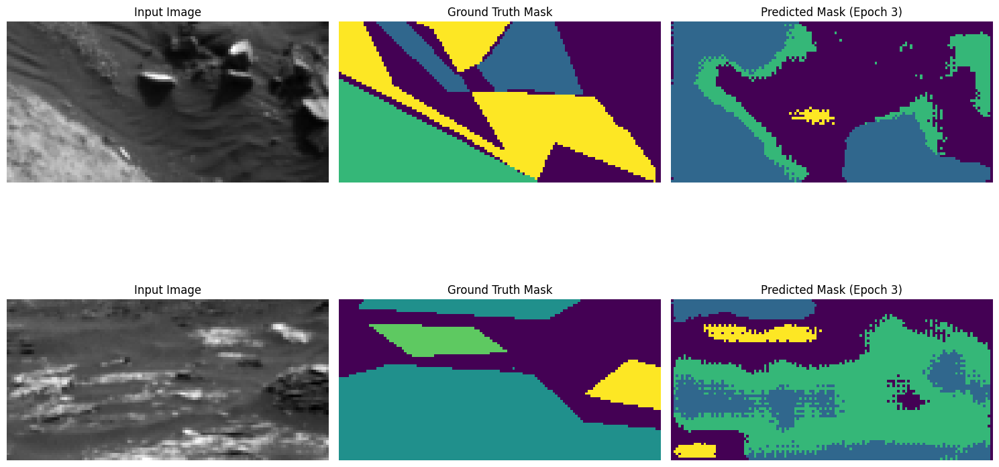

314/314 [==============================] - 30s 94ms/step - loss: 1.0373 - accuracy: 0.5317 - mean_io_u: 0.2546 - custom_mean_iou: 0.2218 - val_loss: 1.0253 - val_accuracy: 0.5495 - val_mean_io_u: 0.2626 - val_custom_mean_iou: 0.2245 - lr: 1.0000e-04
Epoch 4/1000
313/314 [============================>.] - ETA: 0s - loss: 0.9945 - accuracy: 0.5674 - mean_io_u: 0.2835 - custom_mean_iou: 0.2472Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 4: val_custom_mean_iou improved to 0.2827, saving model.

Epoch 4: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 19ms/step


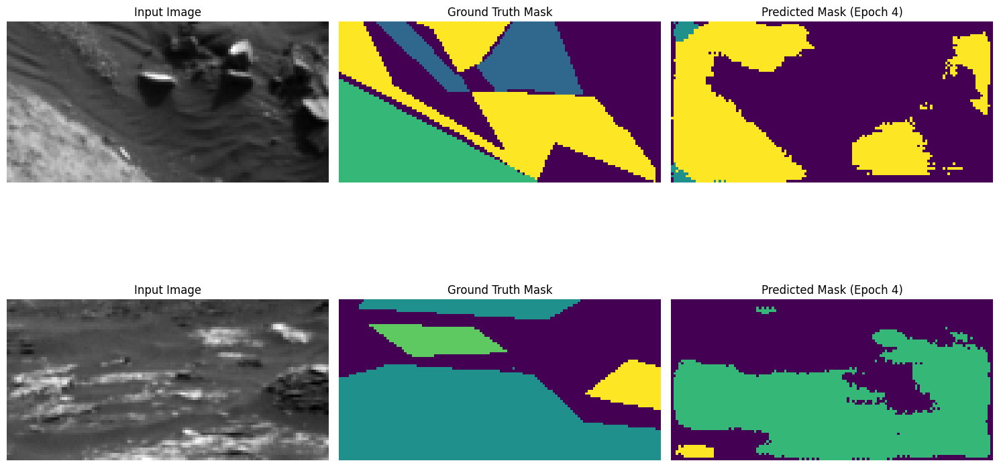

314/314 [==============================] - 29s 93ms/step - loss: 0.9945 - accuracy: 0.5674 - mean_io_u: 0.2835 - custom_mean_iou: 0.2472 - val_loss: 0.9759 - val_accuracy: 0.5939 - val_mean_io_u: 0.3225 - val_custom_mean_iou: 0.2827 - lr: 1.0000e-04
Epoch 5/1000
313/314 [============================>.] - ETA: 0s - loss: 0.9265 - accuracy: 0.6127 - mean_io_u: 0.3314 - custom_mean_iou: 0.2864Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 5: val_custom_mean_iou improved to 0.3212, saving model.

Epoch 5: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 18ms/step


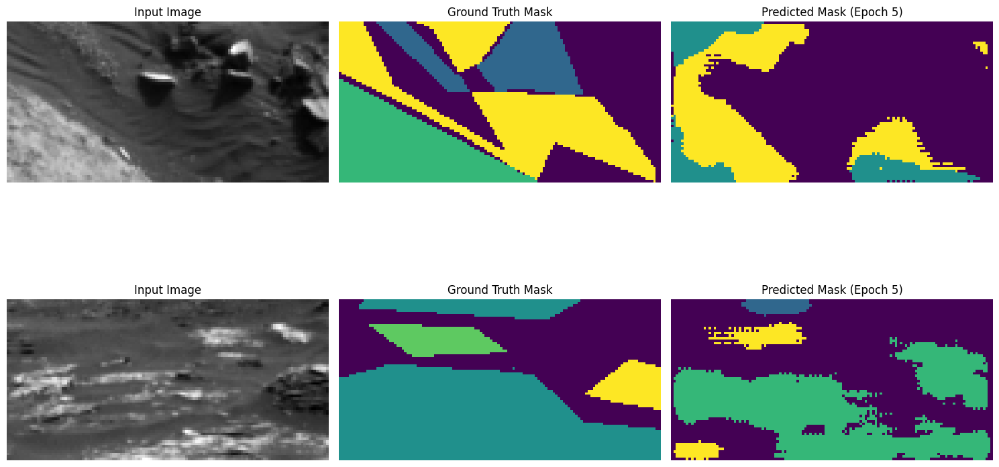

314/314 [==============================] - 29s 93ms/step - loss: 0.9265 - accuracy: 0.6127 - mean_io_u: 0.3314 - custom_mean_iou: 0.2864 - val_loss: 0.8604 - val_accuracy: 0.6601 - val_mean_io_u: 0.3714 - val_custom_mean_iou: 0.3212 - lr: 1.0000e-04
Epoch 6/1000
313/314 [============================>.] - ETA: 0s - loss: 0.8778 - accuracy: 0.6424 - mean_io_u: 0.3562 - custom_mean_iou: 0.3076Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 6: val_custom_mean_iou improved to 0.3264, saving model.

Epoch 6: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 18ms/step


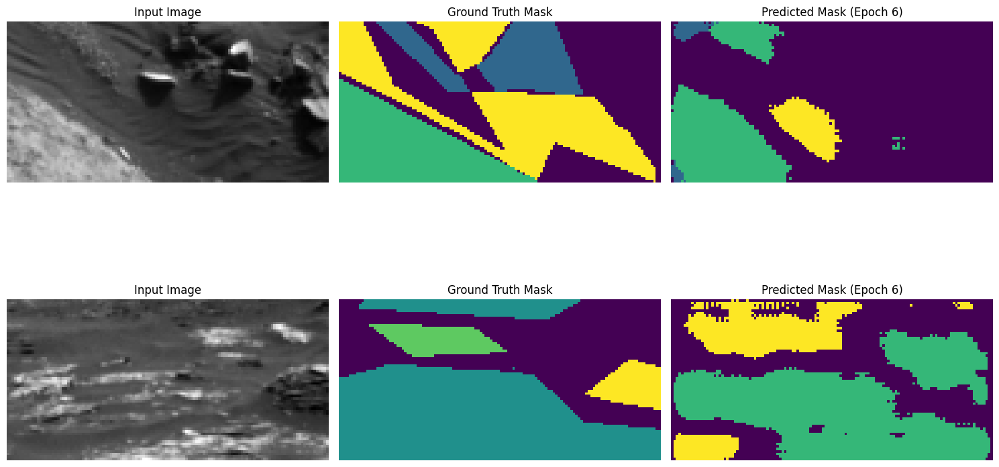

314/314 [==============================] - 29s 93ms/step - loss: 0.8779 - accuracy: 0.6424 - mean_io_u: 0.3562 - custom_mean_iou: 0.3076 - val_loss: 0.8603 - val_accuracy: 0.6616 - val_mean_io_u: 0.3784 - val_custom_mean_iou: 0.3264 - lr: 1.0000e-04
Epoch 7/1000
313/314 [============================>.] - ETA: 0s - loss: 0.8609 - accuracy: 0.6537 - mean_io_u: 0.3644 - custom_mean_iou: 0.3149Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 7: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 19ms/step


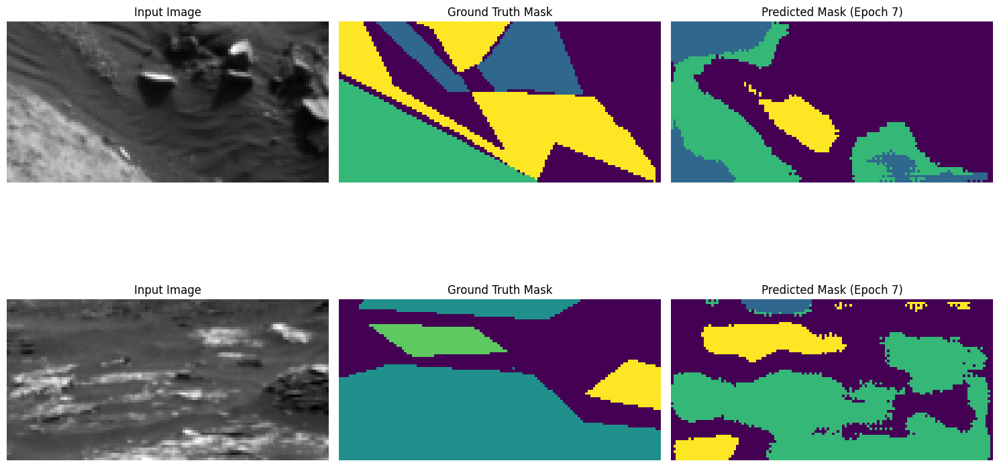

314/314 [==============================] - 29s 93ms/step - loss: 0.8609 - accuracy: 0.6536 - mean_io_u: 0.3643 - custom_mean_iou: 0.3148 - val_loss: 0.8440 - val_accuracy: 0.6674 - val_mean_io_u: 0.3692 - val_custom_mean_iou: 0.3194 - lr: 1.0000e-04
Epoch 8/1000
313/314 [============================>.] - ETA: 0s - loss: 0.8403 - accuracy: 0.6639 - mean_io_u: 0.3715 - custom_mean_iou: 0.3217Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 8: val_custom_mean_iou improved to 0.3494, saving model.

Epoch 8: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 18ms/step


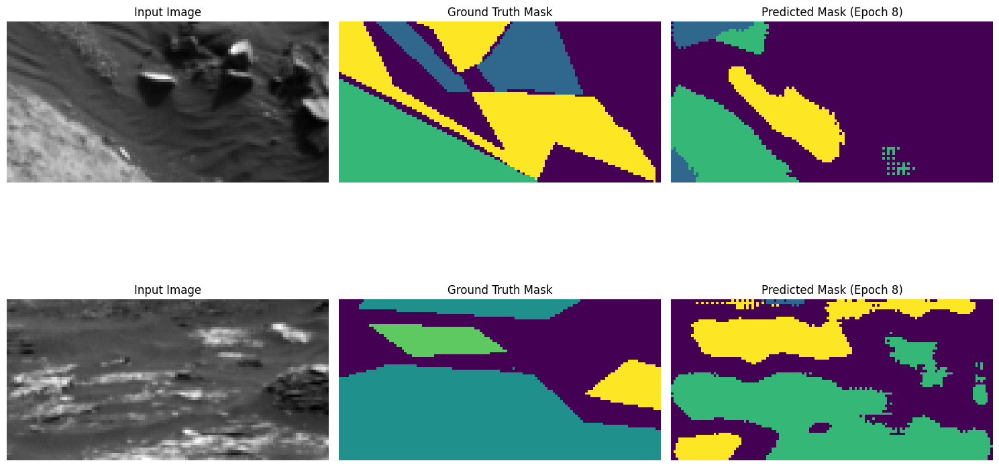

314/314 [==============================] - 29s 94ms/step - loss: 0.8402 - accuracy: 0.6639 - mean_io_u: 0.3715 - custom_mean_iou: 0.3217 - val_loss: 0.7916 - val_accuracy: 0.6988 - val_mean_io_u: 0.4043 - val_custom_mean_iou: 0.3494 - lr: 1.0000e-04
Epoch 9/1000
313/314 [============================>.] - ETA: 0s - loss: 0.8056 - accuracy: 0.6808 - mean_io_u: 0.3856 - custom_mean_iou: 0.3346Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 9: val_custom_mean_iou improved to 0.3514, saving model.

Epoch 9: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 19ms/step


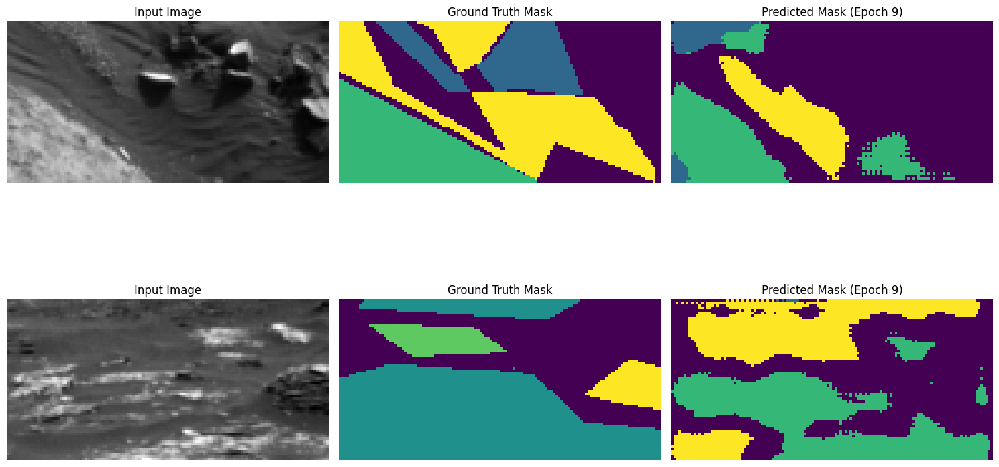

314/314 [==============================] - 29s 93ms/step - loss: 0.8056 - accuracy: 0.6809 - mean_io_u: 0.3856 - custom_mean_iou: 0.3346 - val_loss: 0.7795 - val_accuracy: 0.7034 - val_mean_io_u: 0.4082 - val_custom_mean_iou: 0.3514 - lr: 1.0000e-04
Epoch 10/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7918 - accuracy: 0.6868 - mean_io_u: 0.3903 - custom_mean_iou: 0.3391Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 10: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 18ms/step


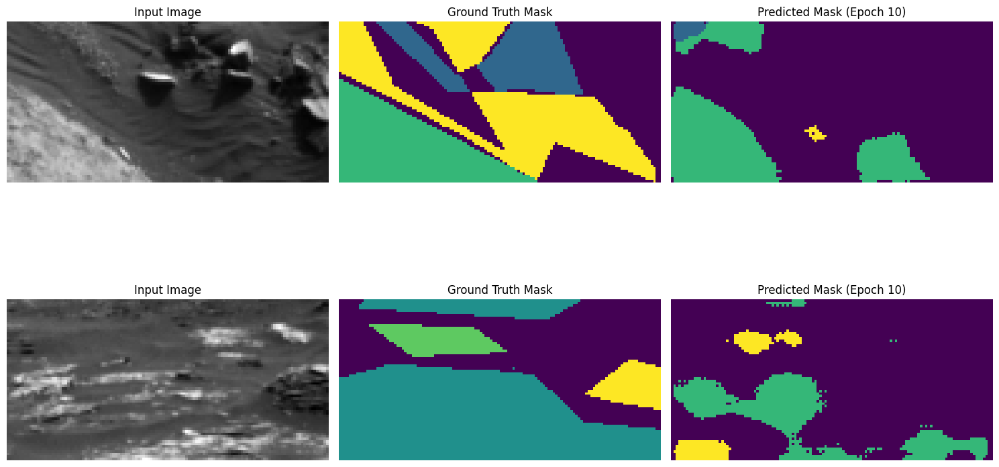

314/314 [==============================] - 29s 93ms/step - loss: 0.7921 - accuracy: 0.6867 - mean_io_u: 0.3901 - custom_mean_iou: 0.3389 - val_loss: 0.8252 - val_accuracy: 0.6908 - val_mean_io_u: 0.3806 - val_custom_mean_iou: 0.3412 - lr: 1.0000e-04
Epoch 11/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7724 - accuracy: 0.6957 - mean_io_u: 0.3985 - custom_mean_iou: 0.3460Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 11: val_custom_mean_iou improved to 0.3722, saving model.

Epoch 11: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 21ms/step


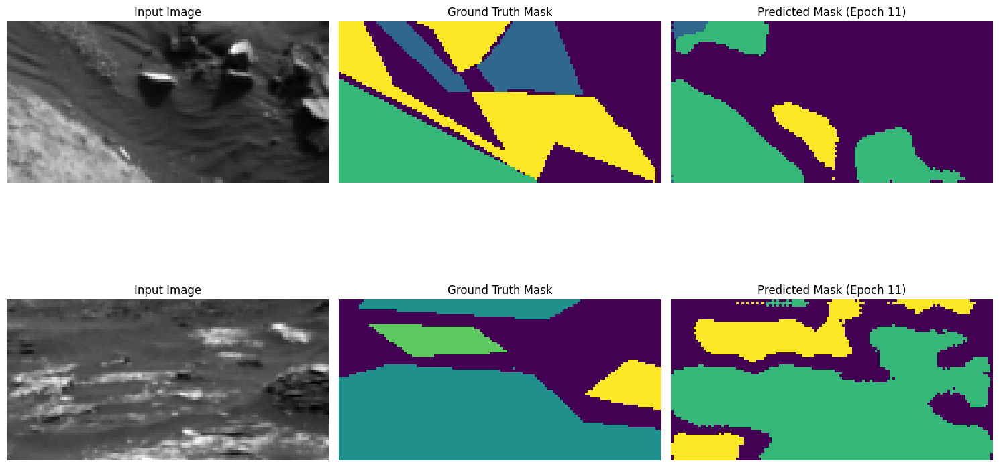

314/314 [==============================] - 29s 93ms/step - loss: 0.7723 - accuracy: 0.6958 - mean_io_u: 0.3986 - custom_mean_iou: 0.3461 - val_loss: 0.7464 - val_accuracy: 0.7236 - val_mean_io_u: 0.4319 - val_custom_mean_iou: 0.3722 - lr: 1.0000e-04
Epoch 12/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7644 - accuracy: 0.6989 - mean_io_u: 0.4001 - custom_mean_iou: 0.3480Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 12: val_custom_mean_iou improved to 0.3736, saving model.

Epoch 12: val_loss did not improve from 0.74336
1/1 [==============================] - 0s 18ms/step


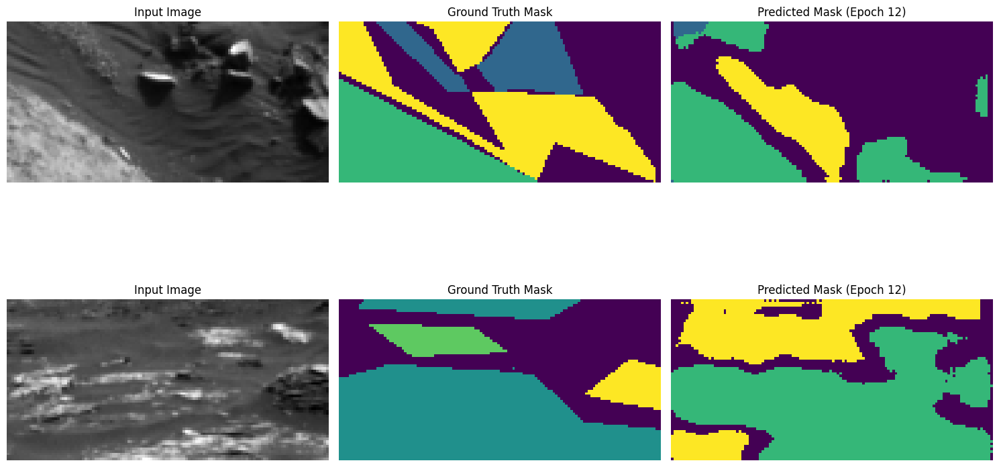

314/314 [==============================] - 29s 93ms/step - loss: 0.7644 - accuracy: 0.6989 - mean_io_u: 0.4001 - custom_mean_iou: 0.3480 - val_loss: 0.7468 - val_accuracy: 0.7223 - val_mean_io_u: 0.4386 - val_custom_mean_iou: 0.3736 - lr: 1.0000e-04
Epoch 13/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7422 - accuracy: 0.7092 - mean_io_u: 0.4115 - custom_mean_iou: 0.3576Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 13: val_custom_mean_iou improved to 0.3786, saving model.

Epoch 13: val_loss improved from 0.74336 to 0.71662, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


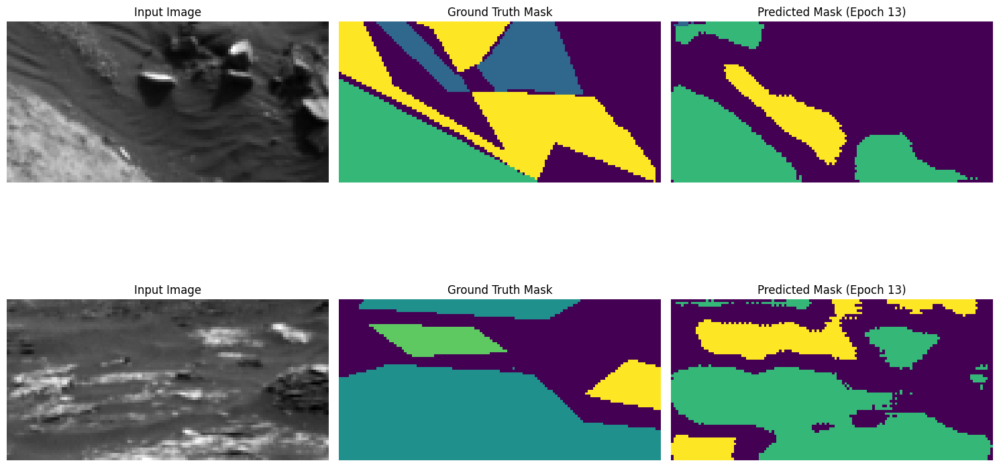

314/314 [==============================] - 29s 94ms/step - loss: 0.7422 - accuracy: 0.7092 - mean_io_u: 0.4115 - custom_mean_iou: 0.3576 - val_loss: 0.7166 - val_accuracy: 0.7338 - val_mean_io_u: 0.4364 - val_custom_mean_iou: 0.3786 - lr: 1.0000e-04
Epoch 14/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7218 - accuracy: 0.7170 - mean_io_u: 0.4173 - custom_mean_iou: 0.3636Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 14: val_loss did not improve from 0.71662
1/1 [==============================] - 0s 18ms/step


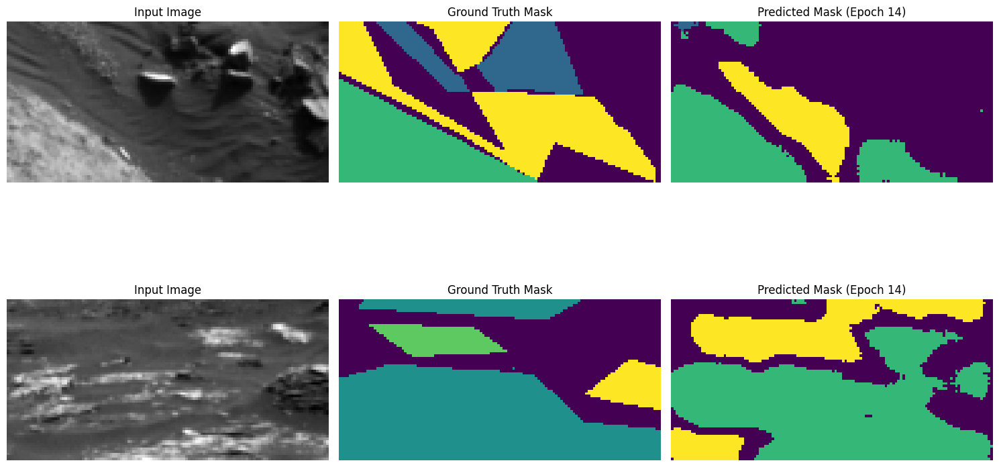

314/314 [==============================] - 30s 94ms/step - loss: 0.7219 - accuracy: 0.7169 - mean_io_u: 0.4173 - custom_mean_iou: 0.3636 - val_loss: 0.7398 - val_accuracy: 0.7207 - val_mean_io_u: 0.4285 - val_custom_mean_iou: 0.3706 - lr: 1.0000e-04
Epoch 15/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7171 - accuracy: 0.7193 - mean_io_u: 0.4196 - custom_mean_iou: 0.3653Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 15: val_custom_mean_iou improved to 0.3800, saving model.

Epoch 15: val_loss improved from 0.71662 to 0.70594, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


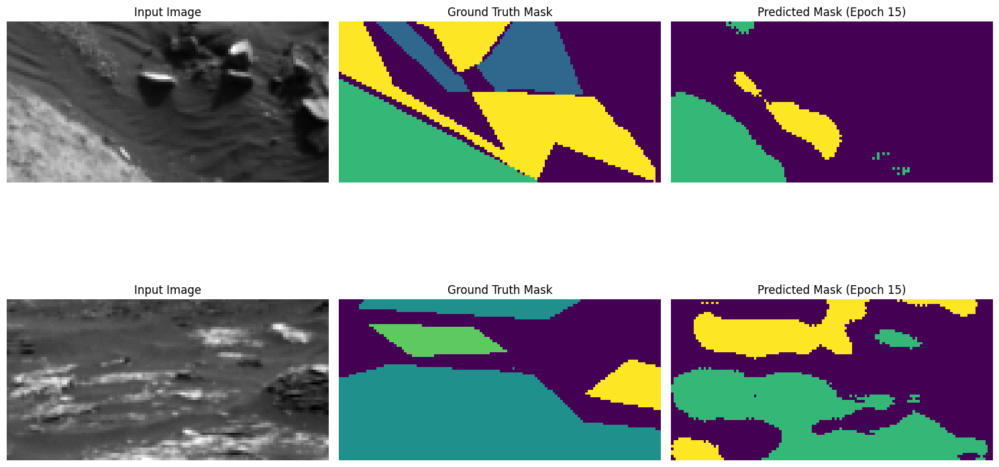

314/314 [==============================] - 29s 94ms/step - loss: 0.7170 - accuracy: 0.7193 - mean_io_u: 0.4197 - custom_mean_iou: 0.3654 - val_loss: 0.7059 - val_accuracy: 0.7364 - val_mean_io_u: 0.4293 - val_custom_mean_iou: 0.3800 - lr: 1.0000e-04
Epoch 16/1000
313/314 [============================>.] - ETA: 0s - loss: 0.7099 - accuracy: 0.7208 - mean_io_u: 0.4207 - custom_mean_iou: 0.3666Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 16: val_custom_mean_iou improved to 0.3816, saving model.

Epoch 16: val_loss improved from 0.70594 to 0.69302, saving model to best_model.keras
1/1 [==============================] - 0s 24ms/step


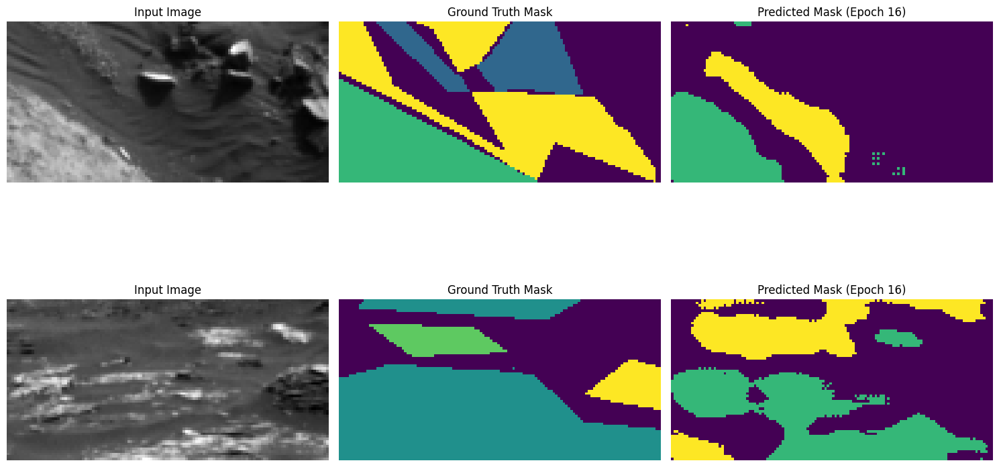

314/314 [==============================] - 30s 94ms/step - loss: 0.7098 - accuracy: 0.7209 - mean_io_u: 0.4207 - custom_mean_iou: 0.3666 - val_loss: 0.6930 - val_accuracy: 0.7388 - val_mean_io_u: 0.4330 - val_custom_mean_iou: 0.3816 - lr: 1.0000e-04
Epoch 17/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6963 - accuracy: 0.7274 - mean_io_u: 0.4264 - custom_mean_iou: 0.3721Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 17: val_custom_mean_iou improved to 0.3827, saving model.

Epoch 17: val_loss did not improve from 0.69302
1/1 [==============================] - 0s 19ms/step


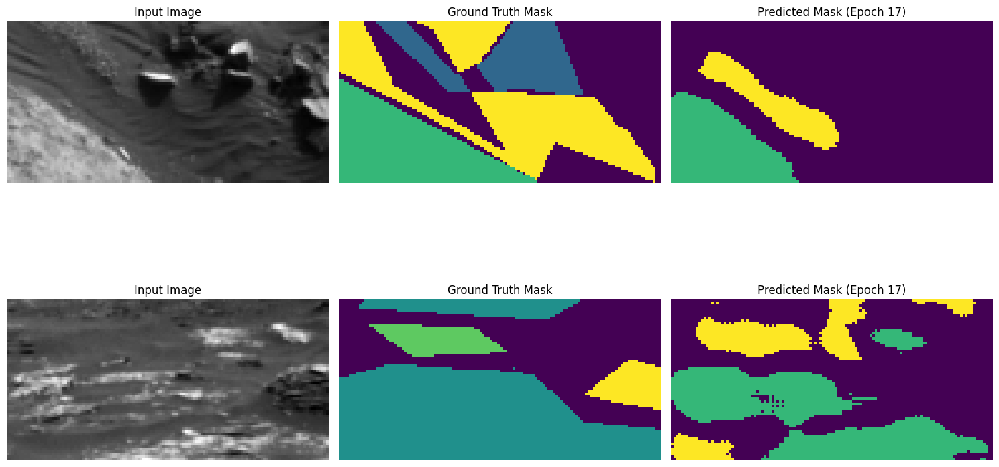

314/314 [==============================] - 29s 93ms/step - loss: 0.6963 - accuracy: 0.7274 - mean_io_u: 0.4264 - custom_mean_iou: 0.3721 - val_loss: 0.7035 - val_accuracy: 0.7387 - val_mean_io_u: 0.4296 - val_custom_mean_iou: 0.3827 - lr: 1.0000e-04
Epoch 18/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6872 - accuracy: 0.7308 - mean_io_u: 0.4297 - custom_mean_iou: 0.3750Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 18: val_custom_mean_iou improved to 0.3888, saving model.

Epoch 18: val_loss improved from 0.69302 to 0.67596, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


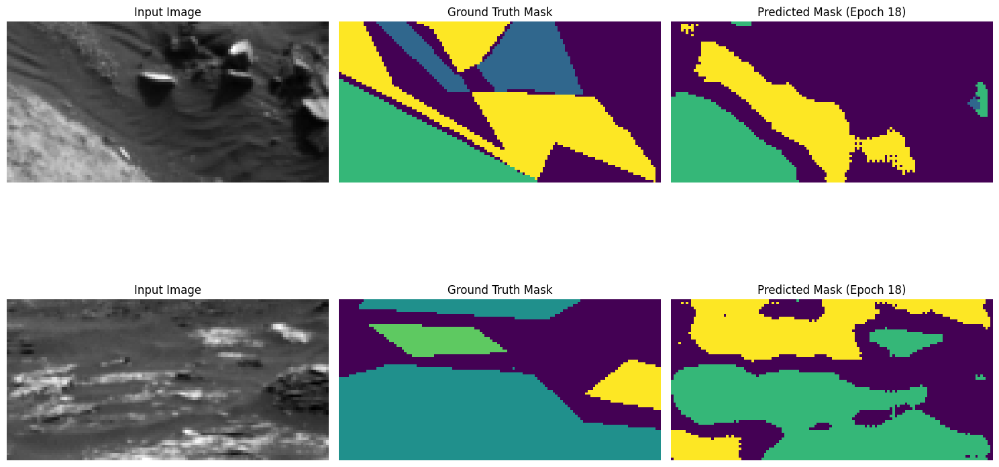

314/314 [==============================] - 29s 94ms/step - loss: 0.6870 - accuracy: 0.7308 - mean_io_u: 0.4298 - custom_mean_iou: 0.3751 - val_loss: 0.6760 - val_accuracy: 0.7443 - val_mean_io_u: 0.4499 - val_custom_mean_iou: 0.3888 - lr: 1.0000e-04
Epoch 19/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6777 - accuracy: 0.7342 - mean_io_u: 0.4333 - custom_mean_iou: 0.3782Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 19: val_custom_mean_iou improved to 0.3921, saving model.

Epoch 19: val_loss improved from 0.67596 to 0.66566, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


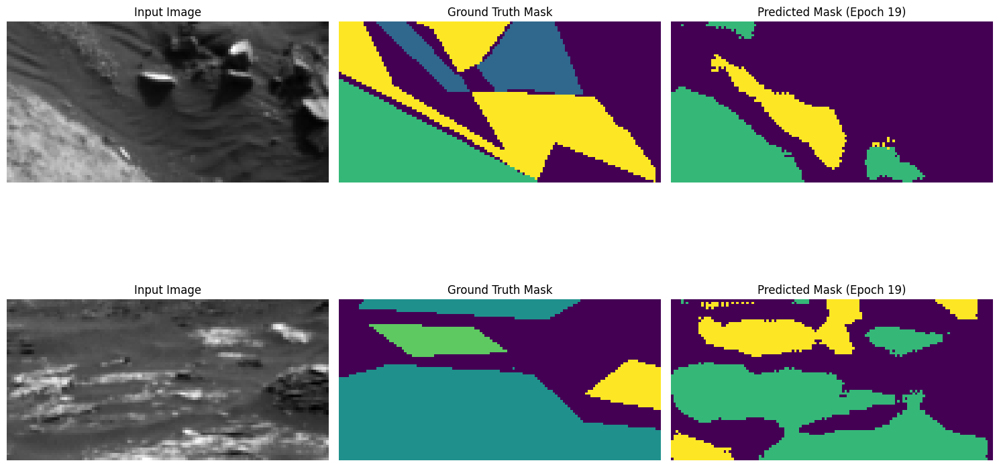

314/314 [==============================] - 29s 93ms/step - loss: 0.6778 - accuracy: 0.7342 - mean_io_u: 0.4333 - custom_mean_iou: 0.3782 - val_loss: 0.6657 - val_accuracy: 0.7496 - val_mean_io_u: 0.4499 - val_custom_mean_iou: 0.3921 - lr: 1.0000e-04
Epoch 20/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6666 - accuracy: 0.7390 - mean_io_u: 0.4366 - custom_mean_iou: 0.3818Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 20: val_loss did not improve from 0.66566
1/1 [==============================] - 0s 19ms/step


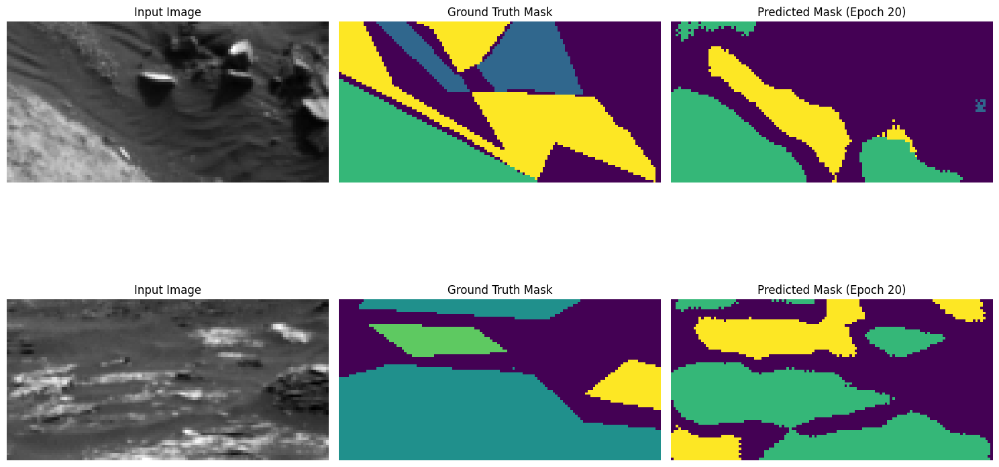

314/314 [==============================] - 29s 93ms/step - loss: 0.6666 - accuracy: 0.7390 - mean_io_u: 0.4367 - custom_mean_iou: 0.3819 - val_loss: 0.6831 - val_accuracy: 0.7450 - val_mean_io_u: 0.4510 - val_custom_mean_iou: 0.3888 - lr: 1.0000e-04
Epoch 21/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6564 - accuracy: 0.7429 - mean_io_u: 0.4423 - custom_mean_iou: 0.3862Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 21: val_loss did not improve from 0.66566
1/1 [==============================] - 0s 19ms/step


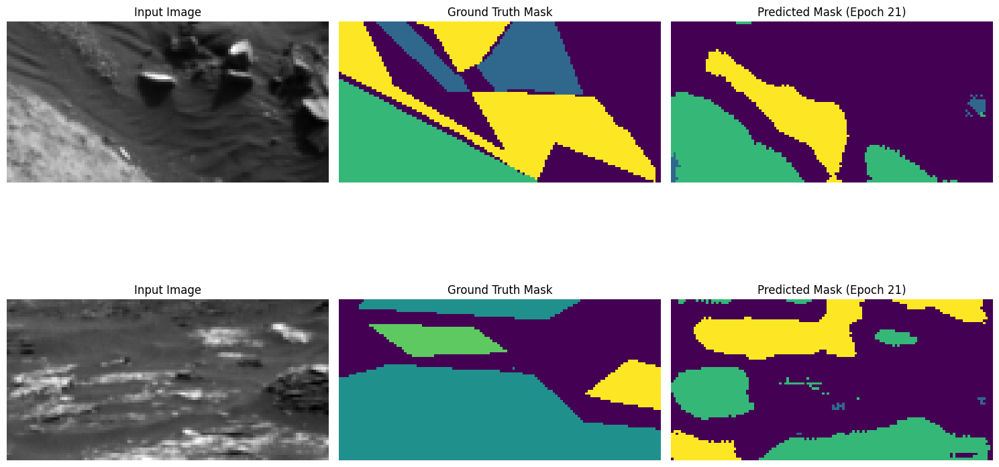

314/314 [==============================] - 29s 93ms/step - loss: 0.6563 - accuracy: 0.7429 - mean_io_u: 0.4423 - custom_mean_iou: 0.3862 - val_loss: 0.6913 - val_accuracy: 0.7364 - val_mean_io_u: 0.4296 - val_custom_mean_iou: 0.3770 - lr: 1.0000e-04
Epoch 22/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6463 - accuracy: 0.7470 - mean_io_u: 0.4449 - custom_mean_iou: 0.3894Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 22: val_loss improved from 0.66566 to 0.65502, saving model to best_model.keras
1/1 [==============================] - 0s 17ms/step


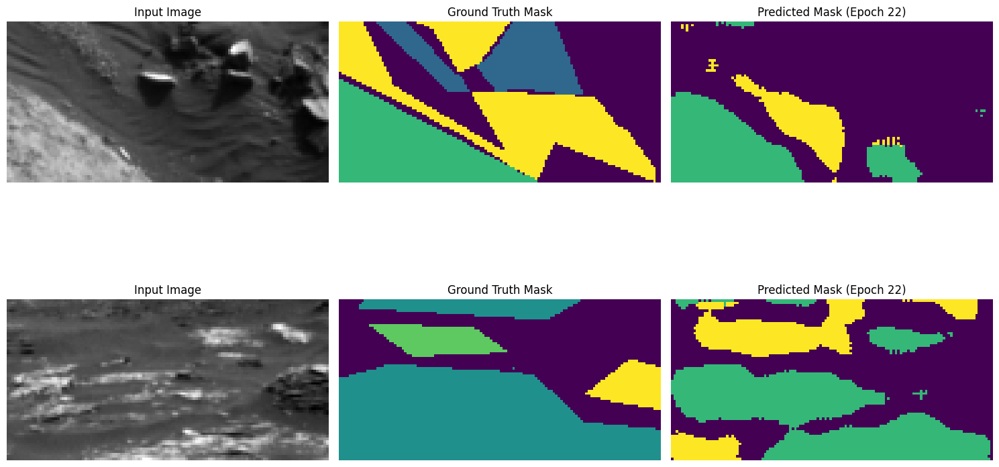

314/314 [==============================] - 29s 93ms/step - loss: 0.6463 - accuracy: 0.7470 - mean_io_u: 0.4449 - custom_mean_iou: 0.3894 - val_loss: 0.6550 - val_accuracy: 0.7485 - val_mean_io_u: 0.4461 - val_custom_mean_iou: 0.3894 - lr: 1.0000e-04
Epoch 23/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6390 - accuracy: 0.7493 - mean_io_u: 0.4465 - custom_mean_iou: 0.3910Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 23: val_loss did not improve from 0.65502
1/1 [==============================] - 0s 17ms/step


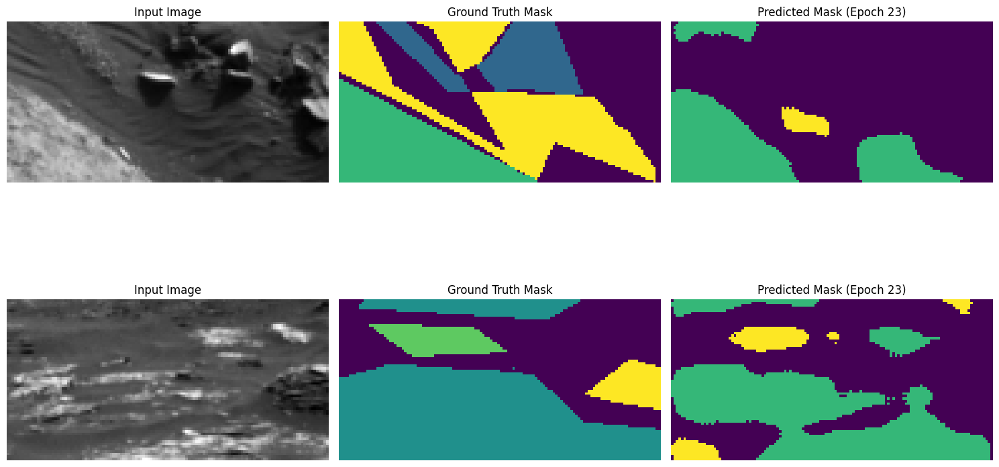

314/314 [==============================] - 29s 92ms/step - loss: 0.6389 - accuracy: 0.7493 - mean_io_u: 0.4465 - custom_mean_iou: 0.3910 - val_loss: 0.6647 - val_accuracy: 0.7501 - val_mean_io_u: 0.4398 - val_custom_mean_iou: 0.3890 - lr: 1.0000e-04
Epoch 24/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6363 - accuracy: 0.7502 - mean_io_u: 0.4487 - custom_mean_iou: 0.3922Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 24: val_loss did not improve from 0.65502
1/1 [==============================] - 0s 19ms/step


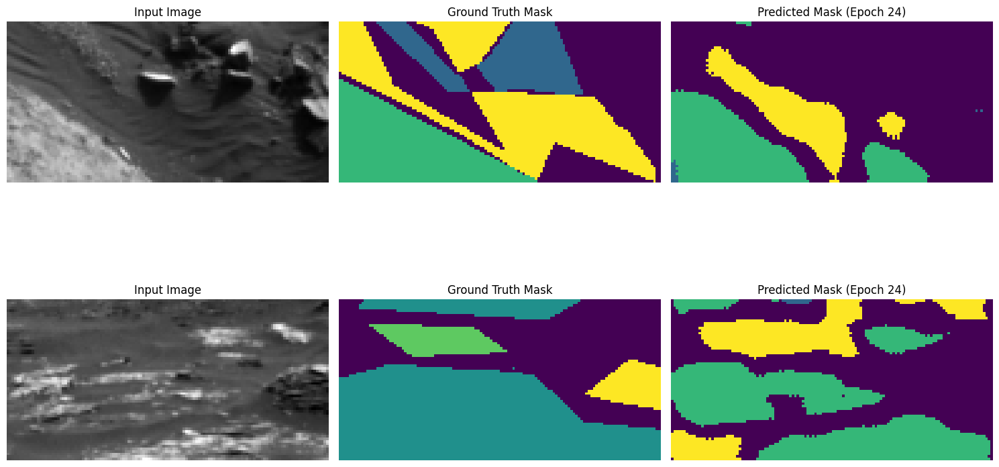

314/314 [==============================] - 30s 94ms/step - loss: 0.6362 - accuracy: 0.7502 - mean_io_u: 0.4487 - custom_mean_iou: 0.3923 - val_loss: 0.6850 - val_accuracy: 0.7414 - val_mean_io_u: 0.4368 - val_custom_mean_iou: 0.3819 - lr: 1.0000e-04
Epoch 25/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6256 - accuracy: 0.7538 - mean_io_u: 0.4517 - custom_mean_iou: 0.3955Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 25: val_loss did not improve from 0.65502
1/1 [==============================] - 0s 18ms/step


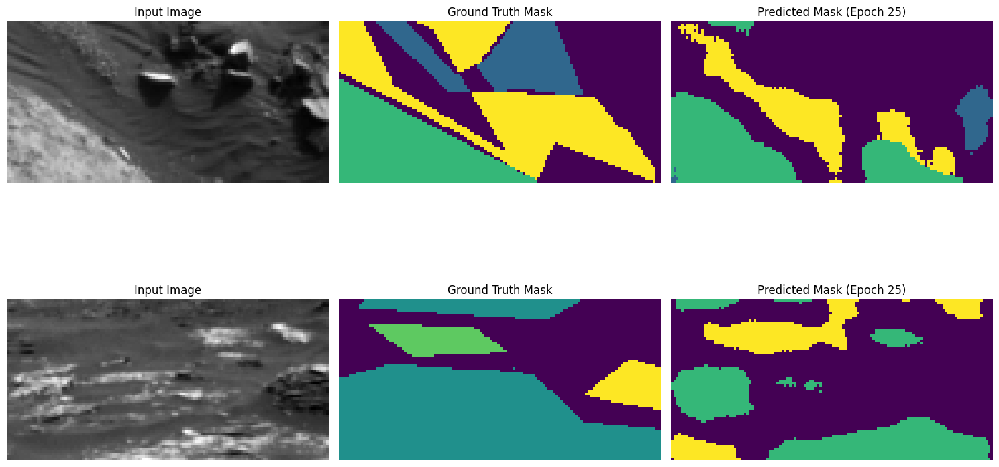

314/314 [==============================] - 29s 93ms/step - loss: 0.6255 - accuracy: 0.7538 - mean_io_u: 0.4517 - custom_mean_iou: 0.3955 - val_loss: 0.6941 - val_accuracy: 0.7422 - val_mean_io_u: 0.4355 - val_custom_mean_iou: 0.3826 - lr: 1.0000e-04
Epoch 26/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6244 - accuracy: 0.7552 - mean_io_u: 0.4524 - custom_mean_iou: 0.3961Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 26: val_custom_mean_iou improved to 0.4042, saving model.

Epoch 26: val_loss improved from 0.65502 to 0.61889, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


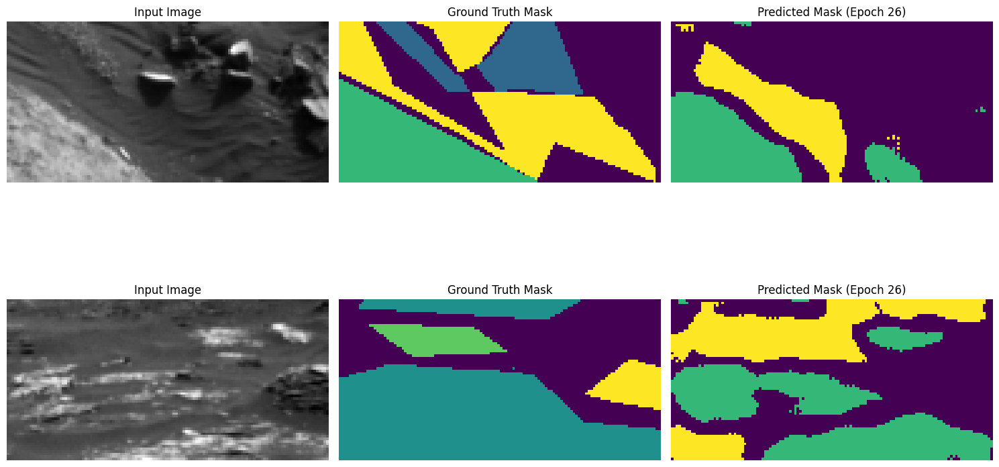

314/314 [==============================] - 29s 94ms/step - loss: 0.6244 - accuracy: 0.7552 - mean_io_u: 0.4524 - custom_mean_iou: 0.3961 - val_loss: 0.6189 - val_accuracy: 0.7628 - val_mean_io_u: 0.4606 - val_custom_mean_iou: 0.4042 - lr: 1.0000e-04
Epoch 27/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6124 - accuracy: 0.7603 - mean_io_u: 0.4567 - custom_mean_iou: 0.4005Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 27: val_loss did not improve from 0.61889
1/1 [==============================] - 0s 18ms/step


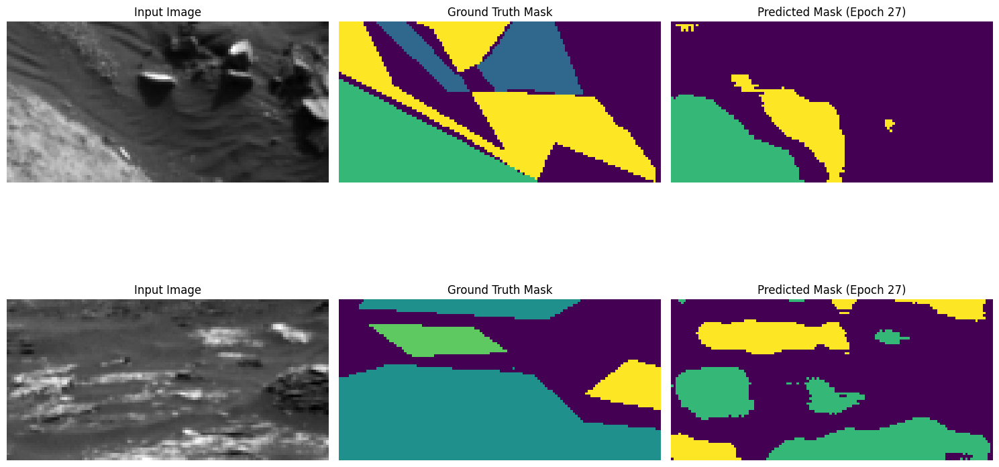

314/314 [==============================] - 29s 93ms/step - loss: 0.6125 - accuracy: 0.7602 - mean_io_u: 0.4566 - custom_mean_iou: 0.4005 - val_loss: 0.6369 - val_accuracy: 0.7533 - val_mean_io_u: 0.4447 - val_custom_mean_iou: 0.3950 - lr: 1.0000e-04
Epoch 28/1000
313/314 [============================>.] - ETA: 0s - loss: 0.6035 - accuracy: 0.7637 - mean_io_u: 0.4588 - custom_mean_iou: 0.4029Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 28: val_custom_mean_iou improved to 0.4051, saving model.

Epoch 28: val_loss did not improve from 0.61889
1/1 [==============================] - 0s 18ms/step


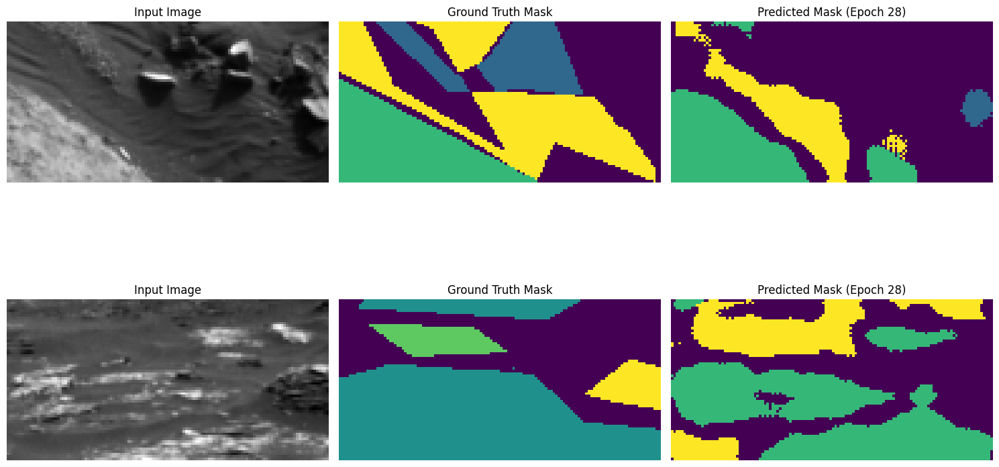

314/314 [==============================] - 29s 93ms/step - loss: 0.6035 - accuracy: 0.7637 - mean_io_u: 0.4588 - custom_mean_iou: 0.4029 - val_loss: 0.6276 - val_accuracy: 0.7629 - val_mean_io_u: 0.4662 - val_custom_mean_iou: 0.4051 - lr: 1.0000e-04
Epoch 29/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5987 - accuracy: 0.7648 - mean_io_u: 0.4607 - custom_mean_iou: 0.4044Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 29: val_custom_mean_iou improved to 0.4063, saving model.

Epoch 29: val_loss improved from 0.61889 to 0.61555, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


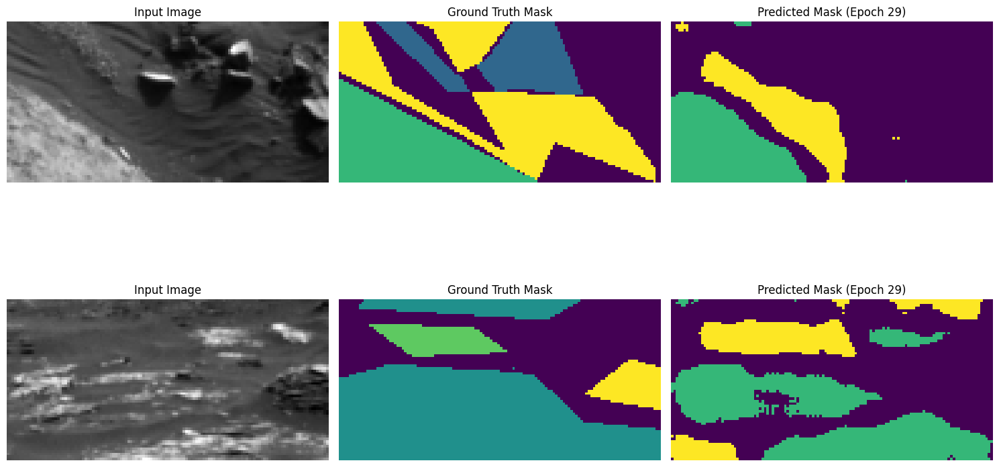

314/314 [==============================] - 30s 94ms/step - loss: 0.5987 - accuracy: 0.7648 - mean_io_u: 0.4607 - custom_mean_iou: 0.4044 - val_loss: 0.6155 - val_accuracy: 0.7654 - val_mean_io_u: 0.4554 - val_custom_mean_iou: 0.4063 - lr: 1.0000e-04
Epoch 30/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5946 - accuracy: 0.7666 - mean_io_u: 0.4610 - custom_mean_iou: 0.4053Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 30: val_loss did not improve from 0.61555
1/1 [==============================] - 0s 18ms/step


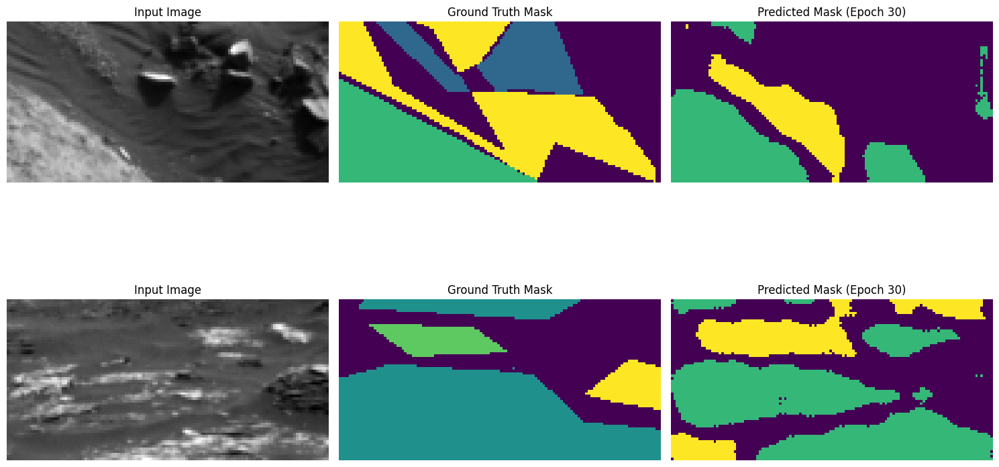

314/314 [==============================] - 29s 93ms/step - loss: 0.5947 - accuracy: 0.7665 - mean_io_u: 0.4609 - custom_mean_iou: 0.4052 - val_loss: 0.6435 - val_accuracy: 0.7593 - val_mean_io_u: 0.4585 - val_custom_mean_iou: 0.4025 - lr: 1.0000e-04
Epoch 31/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5906 - accuracy: 0.7682 - mean_io_u: 0.4628 - custom_mean_iou: 0.4068Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 31: val_loss did not improve from 0.61555
1/1 [==============================] - 0s 18ms/step


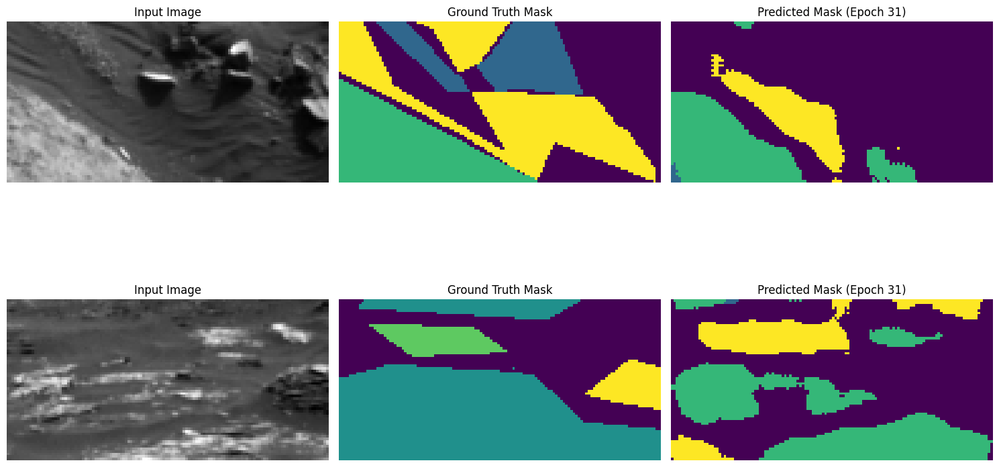

314/314 [==============================] - 29s 93ms/step - loss: 0.5907 - accuracy: 0.7682 - mean_io_u: 0.4628 - custom_mean_iou: 0.4068 - val_loss: 0.6389 - val_accuracy: 0.7542 - val_mean_io_u: 0.4415 - val_custom_mean_iou: 0.3929 - lr: 1.0000e-04
Epoch 32/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5816 - accuracy: 0.7711 - mean_io_u: 0.4660 - custom_mean_iou: 0.4098Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 32: val_loss did not improve from 0.61555
1/1 [==============================] - 0s 19ms/step


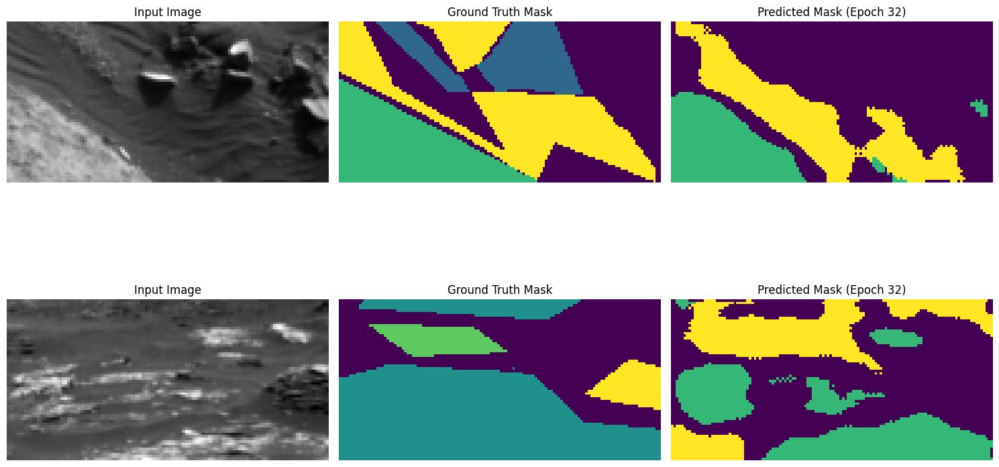

314/314 [==============================] - 29s 93ms/step - loss: 0.5815 - accuracy: 0.7711 - mean_io_u: 0.4660 - custom_mean_iou: 0.4098 - val_loss: 0.6271 - val_accuracy: 0.7594 - val_mean_io_u: 0.4602 - val_custom_mean_iou: 0.4034 - lr: 1.0000e-04
Epoch 33/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5700 - accuracy: 0.7768 - mean_io_u: 0.4717 - custom_mean_iou: 0.4150Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 33: val_custom_mean_iou improved to 0.4085, saving model.

Epoch 33: val_loss improved from 0.61555 to 0.60883, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


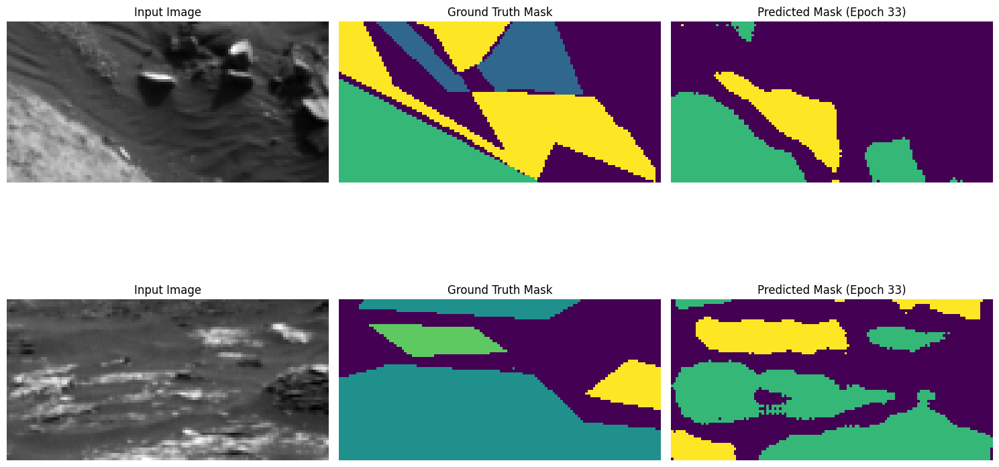

314/314 [==============================] - 30s 94ms/step - loss: 0.5699 - accuracy: 0.7768 - mean_io_u: 0.4717 - custom_mean_iou: 0.4150 - val_loss: 0.6088 - val_accuracy: 0.7686 - val_mean_io_u: 0.4597 - val_custom_mean_iou: 0.4085 - lr: 1.0000e-04
Epoch 34/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5633 - accuracy: 0.7786 - mean_io_u: 0.4727 - custom_mean_iou: 0.4161Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 34: val_loss did not improve from 0.60883
1/1 [==============================] - 0s 18ms/step


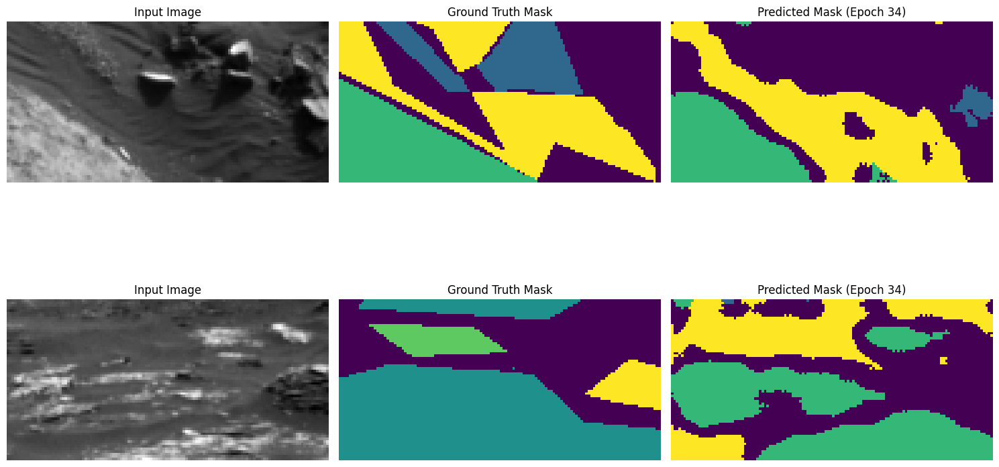

314/314 [==============================] - 30s 94ms/step - loss: 0.5634 - accuracy: 0.7785 - mean_io_u: 0.4726 - custom_mean_iou: 0.4160 - val_loss: 0.6329 - val_accuracy: 0.7652 - val_mean_io_u: 0.4709 - val_custom_mean_iou: 0.4072 - lr: 1.0000e-04
Epoch 35/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5608 - accuracy: 0.7803 - mean_io_u: 0.4745 - custom_mean_iou: 0.4182Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 35: val_loss did not improve from 0.60883
1/1 [==============================] - 0s 19ms/step


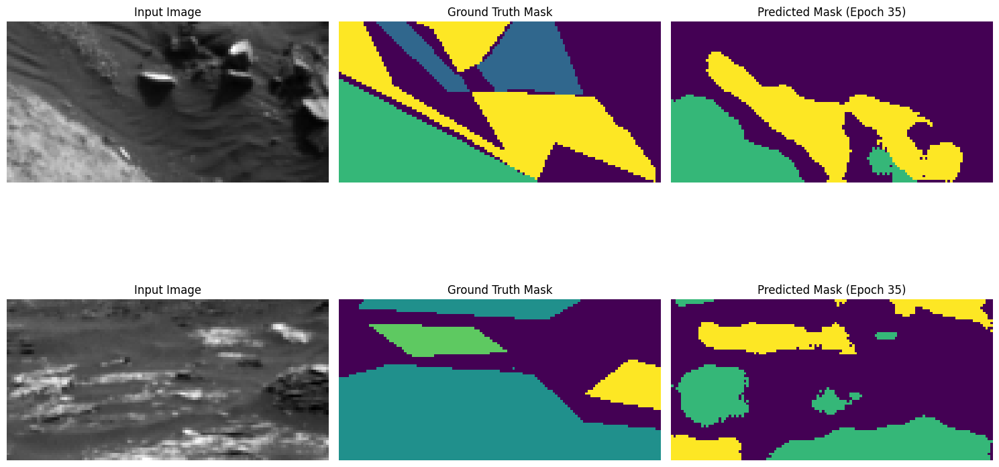

314/314 [==============================] - 29s 93ms/step - loss: 0.5610 - accuracy: 0.7802 - mean_io_u: 0.4745 - custom_mean_iou: 0.4181 - val_loss: 0.6488 - val_accuracy: 0.7438 - val_mean_io_u: 0.4329 - val_custom_mean_iou: 0.3857 - lr: 1.0000e-04
Epoch 36/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5612 - accuracy: 0.7805 - mean_io_u: 0.4742 - custom_mean_iou: 0.4179Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 36: val_custom_mean_iou improved to 0.4101, saving model.

Epoch 36: val_loss did not improve from 0.60883
1/1 [==============================] - 0s 19ms/step


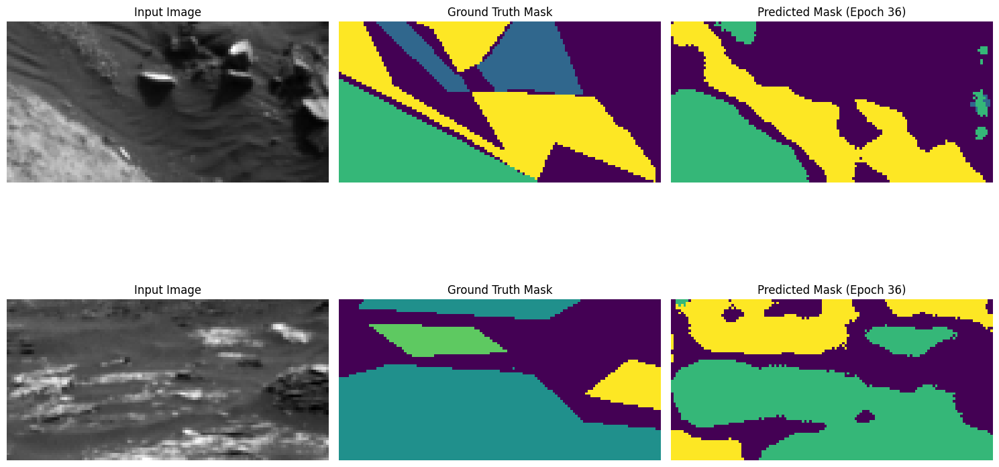

314/314 [==============================] - 29s 93ms/step - loss: 0.5611 - accuracy: 0.7805 - mean_io_u: 0.4743 - custom_mean_iou: 0.4180 - val_loss: 0.6227 - val_accuracy: 0.7688 - val_mean_io_u: 0.4744 - val_custom_mean_iou: 0.4101 - lr: 1.0000e-04
Epoch 37/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5510 - accuracy: 0.7832 - mean_io_u: 0.4770 - custom_mean_iou: 0.4206Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 37: val_custom_mean_iou improved to 0.4135, saving model.

Epoch 37: val_loss improved from 0.60883 to 0.60600, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


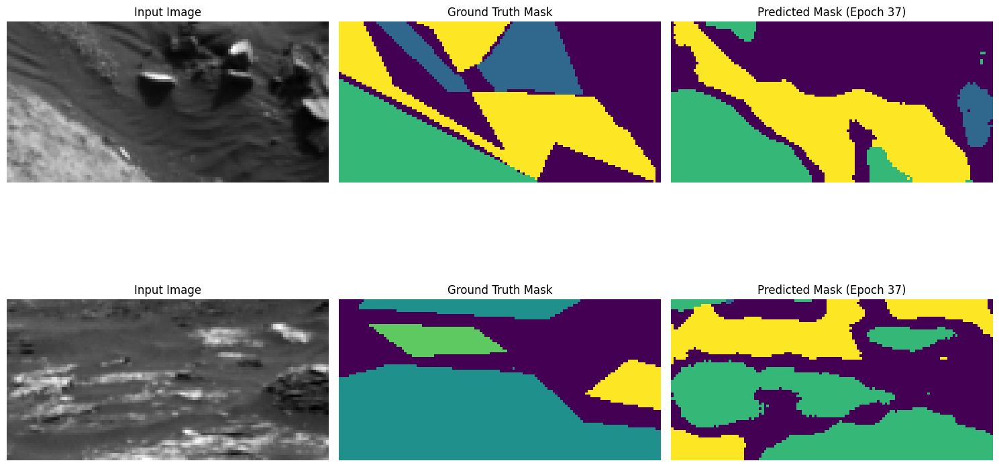

314/314 [==============================] - 30s 94ms/step - loss: 0.5508 - accuracy: 0.7833 - mean_io_u: 0.4770 - custom_mean_iou: 0.4207 - val_loss: 0.6060 - val_accuracy: 0.7729 - val_mean_io_u: 0.4747 - val_custom_mean_iou: 0.4135 - lr: 1.0000e-04
Epoch 38/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5487 - accuracy: 0.7852 - mean_io_u: 0.4804 - custom_mean_iou: 0.4234Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 38: val_loss did not improve from 0.60600
1/1 [==============================] - 0s 17ms/step


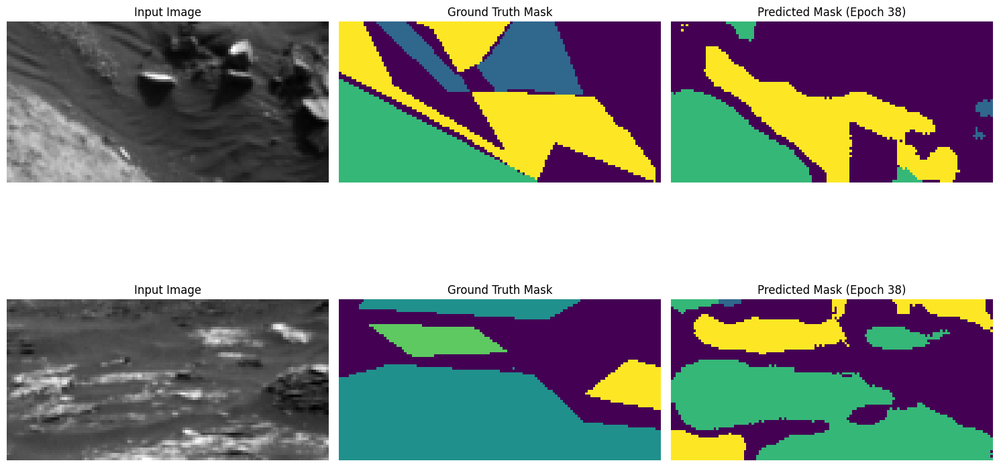

314/314 [==============================] - 29s 93ms/step - loss: 0.5487 - accuracy: 0.7852 - mean_io_u: 0.4804 - custom_mean_iou: 0.4234 - val_loss: 0.6385 - val_accuracy: 0.7636 - val_mean_io_u: 0.4619 - val_custom_mean_iou: 0.4049 - lr: 1.0000e-04
Epoch 39/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5410 - accuracy: 0.7875 - mean_io_u: 0.4817 - custom_mean_iou: 0.4251Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 39: val_loss did not improve from 0.60600
1/1 [==============================] - 0s 18ms/step


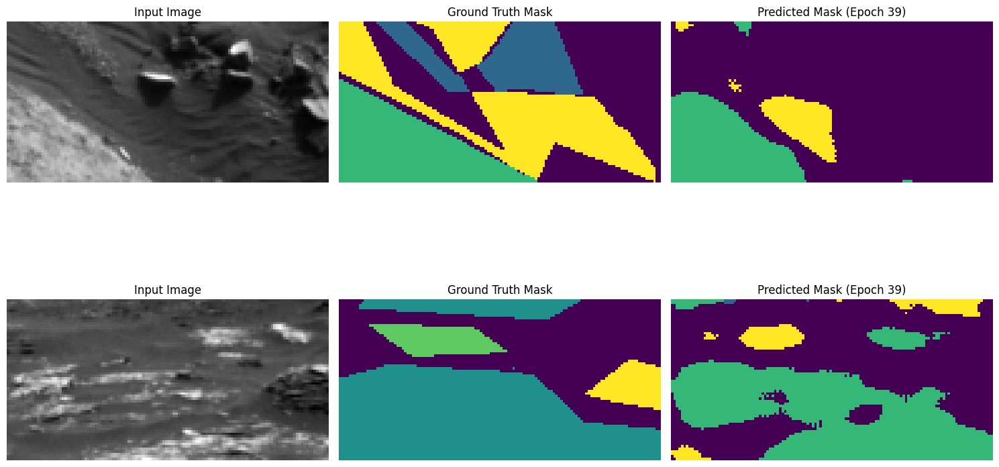

314/314 [==============================] - 29s 93ms/step - loss: 0.5410 - accuracy: 0.7875 - mean_io_u: 0.4817 - custom_mean_iou: 0.4250 - val_loss: 0.6249 - val_accuracy: 0.7680 - val_mean_io_u: 0.4604 - val_custom_mean_iou: 0.4086 - lr: 1.0000e-04
Epoch 40/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5293 - accuracy: 0.7918 - mean_io_u: 0.4851 - custom_mean_iou: 0.4289Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 40: val_loss improved from 0.60600 to 0.60203, saving model to best_model.keras
1/1 [==============================] - 0s 18ms/step


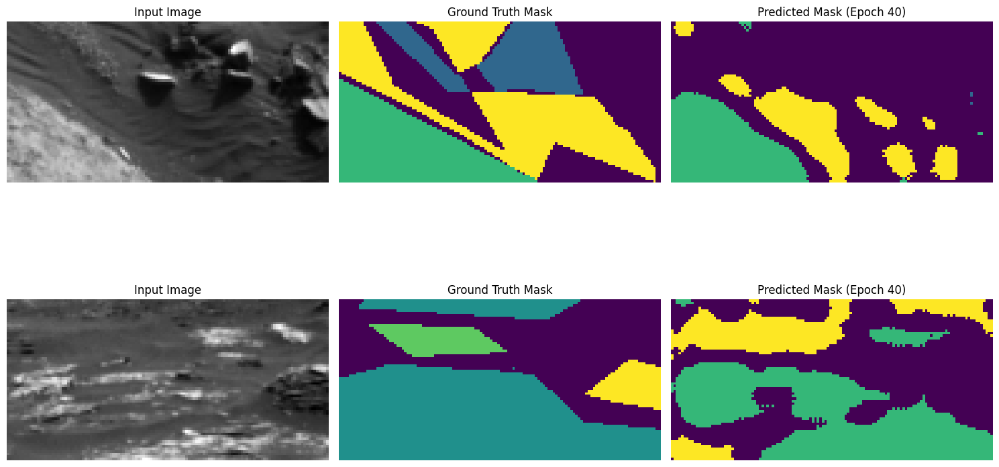

314/314 [==============================] - 29s 93ms/step - loss: 0.5293 - accuracy: 0.7919 - mean_io_u: 0.4851 - custom_mean_iou: 0.4289 - val_loss: 0.6020 - val_accuracy: 0.7722 - val_mean_io_u: 0.4661 - val_custom_mean_iou: 0.4125 - lr: 1.0000e-04
Epoch 41/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5226 - accuracy: 0.7945 - mean_io_u: 0.4906 - custom_mean_iou: 0.4342Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 41: val_loss did not improve from 0.60203
1/1 [==============================] - 0s 18ms/step


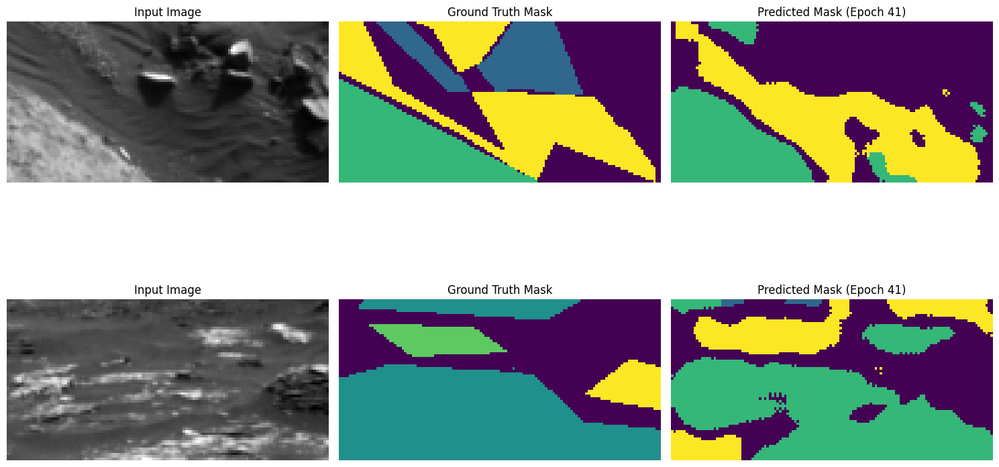

314/314 [==============================] - 29s 93ms/step - loss: 0.5225 - accuracy: 0.7946 - mean_io_u: 0.4907 - custom_mean_iou: 0.4343 - val_loss: 0.6214 - val_accuracy: 0.7725 - val_mean_io_u: 0.4723 - val_custom_mean_iou: 0.4121 - lr: 1.0000e-04
Epoch 42/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5193 - accuracy: 0.7955 - mean_io_u: 0.4916 - custom_mean_iou: 0.4357Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 42: val_loss did not improve from 0.60203
1/1 [==============================] - 0s 19ms/step


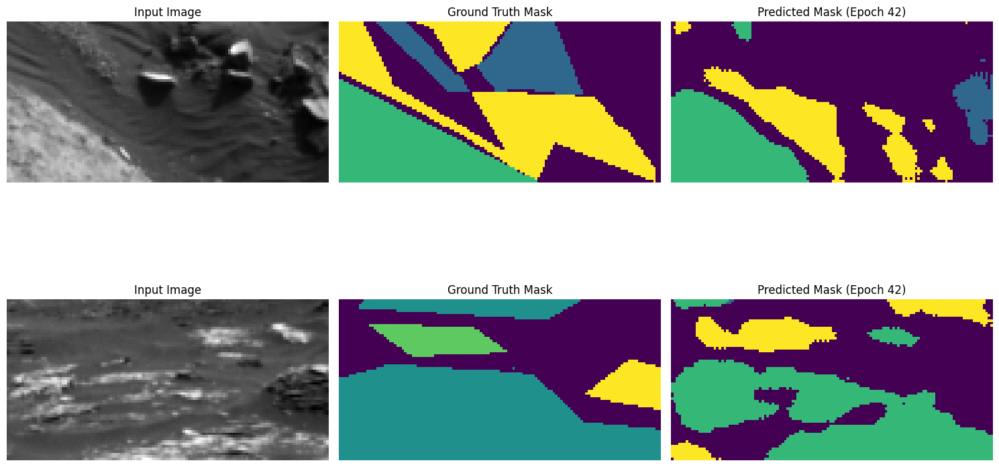

314/314 [==============================] - 29s 93ms/step - loss: 0.5192 - accuracy: 0.7955 - mean_io_u: 0.4916 - custom_mean_iou: 0.4357 - val_loss: 0.6127 - val_accuracy: 0.7735 - val_mean_io_u: 0.4655 - val_custom_mean_iou: 0.4124 - lr: 1.0000e-04
Epoch 43/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5144 - accuracy: 0.7980 - mean_io_u: 0.4951 - custom_mean_iou: 0.4385Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 43: val_loss did not improve from 0.60203
1/1 [==============================] - 0s 18ms/step


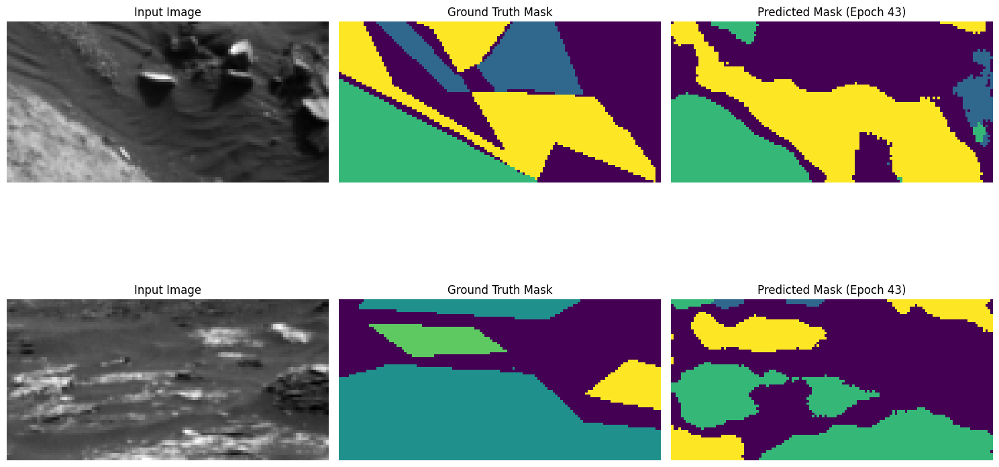

314/314 [==============================] - 29s 93ms/step - loss: 0.5143 - accuracy: 0.7980 - mean_io_u: 0.4951 - custom_mean_iou: 0.4385 - val_loss: 0.6422 - val_accuracy: 0.7549 - val_mean_io_u: 0.4565 - val_custom_mean_iou: 0.3962 - lr: 1.0000e-04
Epoch 44/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5060 - accuracy: 0.8010 - mean_io_u: 0.4992 - custom_mean_iou: 0.4428Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 44: val_loss did not improve from 0.60203
1/1 [==============================] - 0s 18ms/step


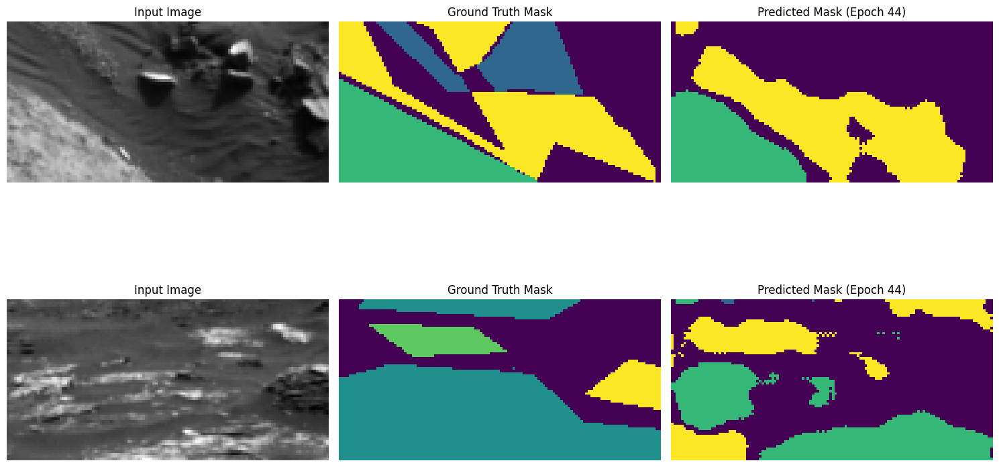

314/314 [==============================] - 29s 93ms/step - loss: 0.5059 - accuracy: 0.8011 - mean_io_u: 0.4992 - custom_mean_iou: 0.4429 - val_loss: 0.6384 - val_accuracy: 0.7556 - val_mean_io_u: 0.4468 - val_custom_mean_iou: 0.3948 - lr: 1.0000e-04
Epoch 45/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4995 - accuracy: 0.8035 - mean_io_u: 0.5024 - custom_mean_iou: 0.4467Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 45: val_custom_mean_iou improved to 0.4157, saving model.

Epoch 45: val_loss improved from 0.60203 to 0.59410, saving model to best_model.keras
1/1 [==============================] - 0s 20ms/step


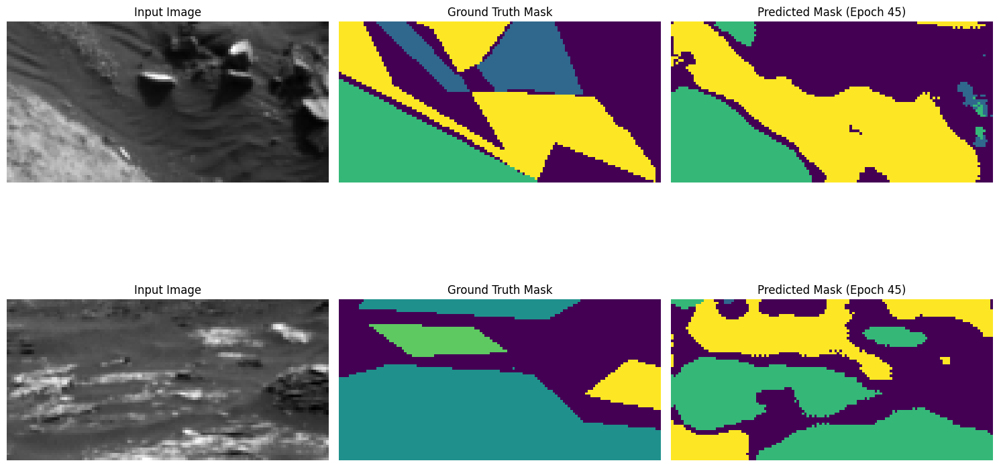

314/314 [==============================] - 30s 95ms/step - loss: 0.4996 - accuracy: 0.8035 - mean_io_u: 0.5023 - custom_mean_iou: 0.4467 - val_loss: 0.5941 - val_accuracy: 0.7739 - val_mean_io_u: 0.4779 - val_custom_mean_iou: 0.4157 - lr: 1.0000e-04
Epoch 46/1000
313/314 [============================>.] - ETA: 0s - loss: 0.5026 - accuracy: 0.8018 - mean_io_u: 0.4978 - custom_mean_iou: 0.4419Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 46: val_loss did not improve from 0.59410
1/1 [==============================] - 0s 19ms/step


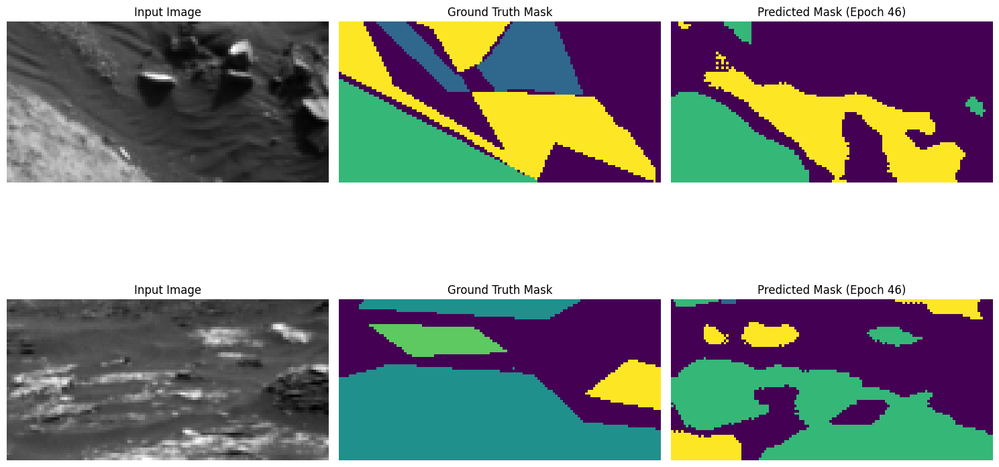

314/314 [==============================] - 29s 93ms/step - loss: 0.5027 - accuracy: 0.8018 - mean_io_u: 0.4978 - custom_mean_iou: 0.4419 - val_loss: 0.6343 - val_accuracy: 0.7675 - val_mean_io_u: 0.4603 - val_custom_mean_iou: 0.4077 - lr: 1.0000e-04
Epoch 47/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4980 - accuracy: 0.8037 - mean_io_u: 0.5024 - custom_mean_iou: 0.4466Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 47: val_loss did not improve from 0.59410
1/1 [==============================] - 0s 18ms/step


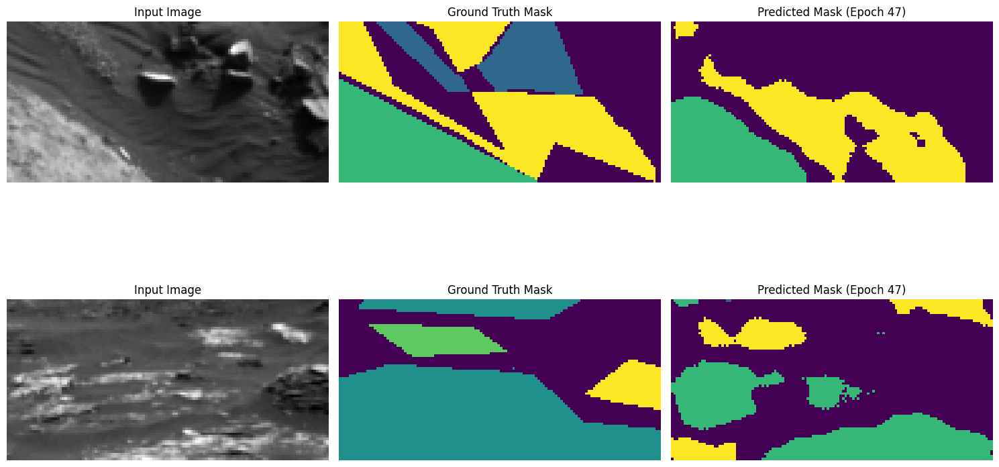

314/314 [==============================] - 29s 93ms/step - loss: 0.4980 - accuracy: 0.8037 - mean_io_u: 0.5023 - custom_mean_iou: 0.4466 - val_loss: 0.6043 - val_accuracy: 0.7684 - val_mean_io_u: 0.4591 - val_custom_mean_iou: 0.4109 - lr: 1.0000e-04
Epoch 48/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4897 - accuracy: 0.8070 - mean_io_u: 0.5056 - custom_mean_iou: 0.4503Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 48: val_custom_mean_iou improved to 0.4195, saving model.

Epoch 48: val_loss improved from 0.59410 to 0.59009, saving model to best_model.keras
1/1 [==============================] - 0s 19ms/step


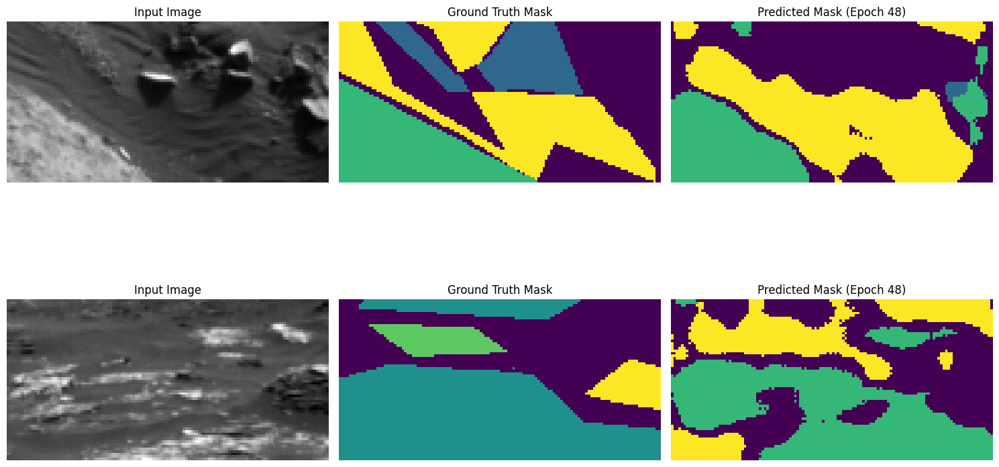

314/314 [==============================] - 30s 94ms/step - loss: 0.4896 - accuracy: 0.8071 - mean_io_u: 0.5056 - custom_mean_iou: 0.4504 - val_loss: 0.5901 - val_accuracy: 0.7768 - val_mean_io_u: 0.4778 - val_custom_mean_iou: 0.4195 - lr: 1.0000e-04
Epoch 49/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4874 - accuracy: 0.8079 - mean_io_u: 0.5068 - custom_mean_iou: 0.4513Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 49: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 19ms/step


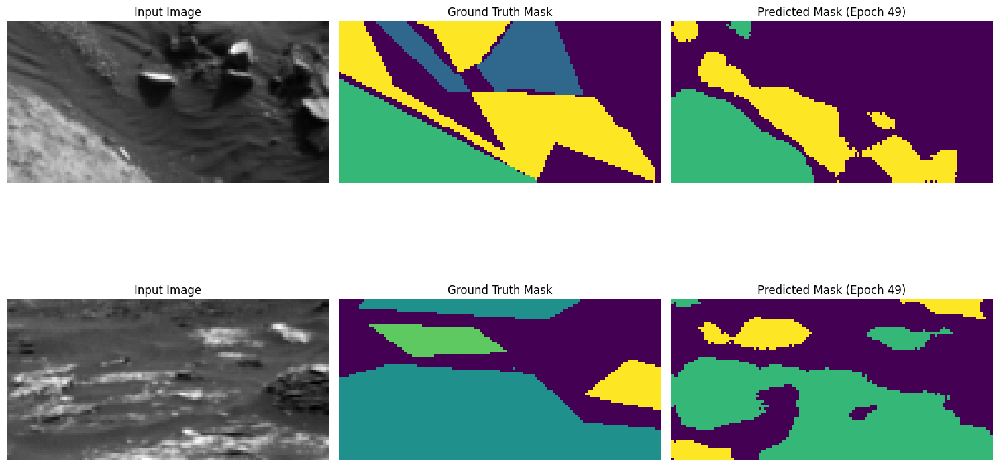

314/314 [==============================] - 29s 93ms/step - loss: 0.4874 - accuracy: 0.8079 - mean_io_u: 0.5069 - custom_mean_iou: 0.4513 - val_loss: 0.6105 - val_accuracy: 0.7738 - val_mean_io_u: 0.4697 - val_custom_mean_iou: 0.4156 - lr: 1.0000e-04
Epoch 50/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4737 - accuracy: 0.8136 - mean_io_u: 0.5153 - custom_mean_iou: 0.4597Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 50: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 19ms/step


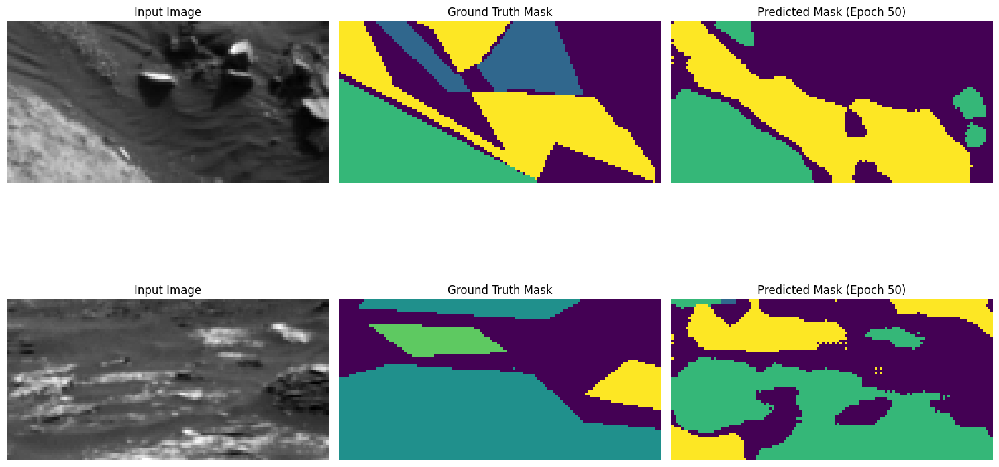

314/314 [==============================] - 29s 93ms/step - loss: 0.4736 - accuracy: 0.8136 - mean_io_u: 0.5153 - custom_mean_iou: 0.4597 - val_loss: 0.6020 - val_accuracy: 0.7752 - val_mean_io_u: 0.4756 - val_custom_mean_iou: 0.4177 - lr: 1.0000e-04
Epoch 51/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4692 - accuracy: 0.8154 - mean_io_u: 0.5152 - custom_mean_iou: 0.4603Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 51: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 18ms/step


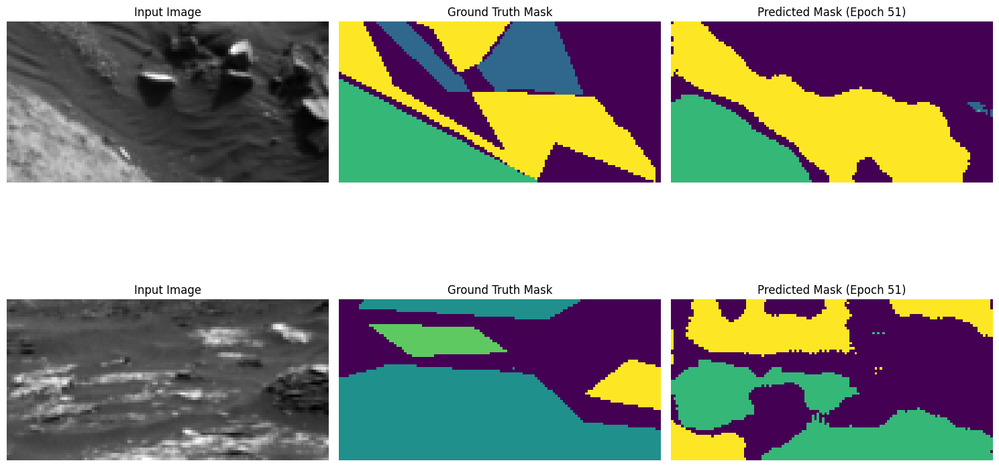

314/314 [==============================] - 29s 93ms/step - loss: 0.4693 - accuracy: 0.8153 - mean_io_u: 0.5151 - custom_mean_iou: 0.4602 - val_loss: 0.6225 - val_accuracy: 0.7682 - val_mean_io_u: 0.4608 - val_custom_mean_iou: 0.4111 - lr: 1.0000e-04
Epoch 52/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4643 - accuracy: 0.8178 - mean_io_u: 0.5212 - custom_mean_iou: 0.4657Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 52: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 19ms/step


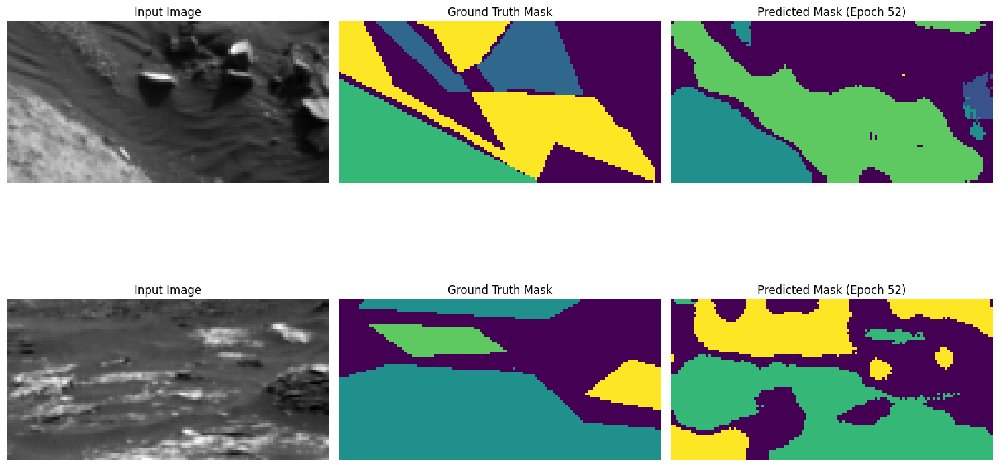

314/314 [==============================] - 29s 93ms/step - loss: 0.4643 - accuracy: 0.8178 - mean_io_u: 0.5212 - custom_mean_iou: 0.4657 - val_loss: 0.6340 - val_accuracy: 0.7688 - val_mean_io_u: 0.4730 - val_custom_mean_iou: 0.4146 - lr: 1.0000e-04
Epoch 53/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4580 - accuracy: 0.8197 - mean_io_u: 0.5177 - custom_mean_iou: 0.4634Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 53: val_loss did not improve from 0.59009

Epoch 53: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
1/1 [==============================] - 0s 19ms/step


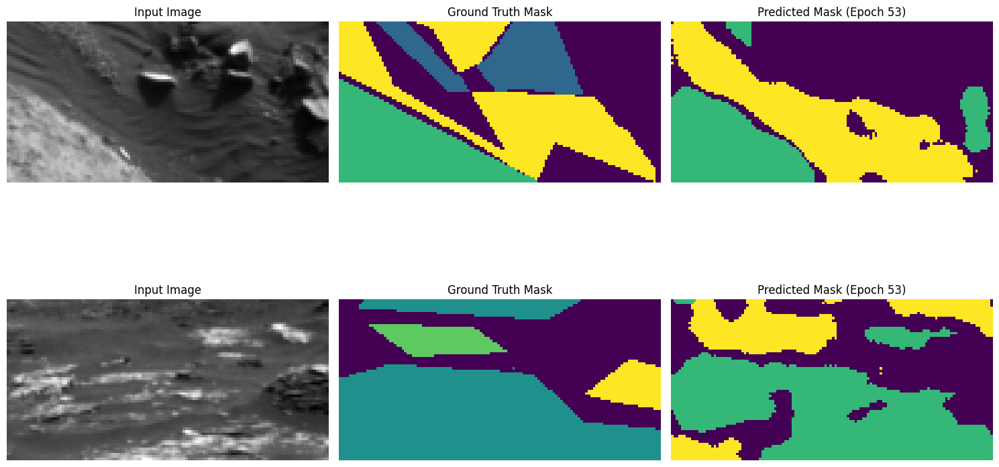

314/314 [==============================] - 29s 93ms/step - loss: 0.4580 - accuracy: 0.8197 - mean_io_u: 0.5177 - custom_mean_iou: 0.4634 - val_loss: 0.6132 - val_accuracy: 0.7774 - val_mean_io_u: 0.4784 - val_custom_mean_iou: 0.4186 - lr: 1.0000e-04
Epoch 54/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4213 - accuracy: 0.8334 - mean_io_u: 0.5381 - custom_mean_iou: 0.4845Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])
Epoch 54: val_custom_mean_iou improved to 0.4216, saving model.

Epoch 54: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 20ms/step


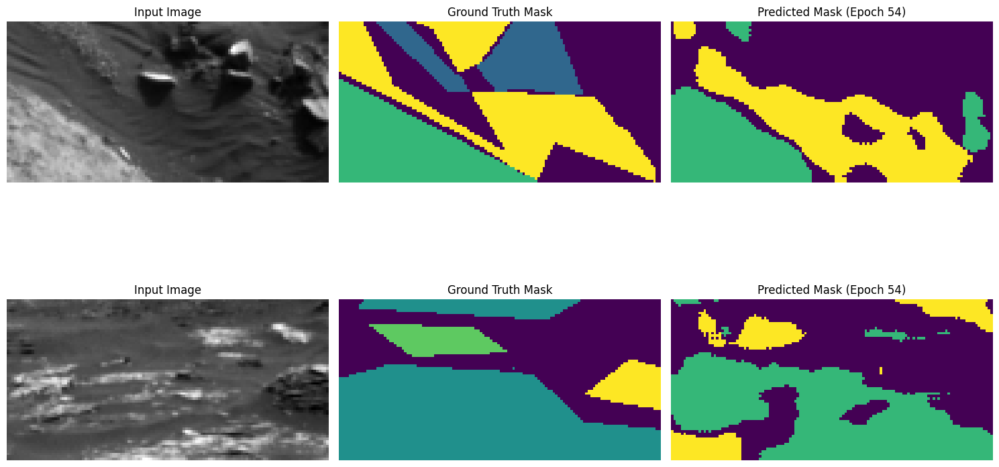

314/314 [==============================] - 29s 93ms/step - loss: 0.4213 - accuracy: 0.8335 - mean_io_u: 0.5381 - custom_mean_iou: 0.4845 - val_loss: 0.6119 - val_accuracy: 0.7801 - val_mean_io_u: 0.4758 - val_custom_mean_iou: 0.4216 - lr: 5.0000e-05
Epoch 55/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4170 - accuracy: 0.8356 - mean_io_u: 0.5394 - custom_mean_iou: 0.4862Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 55: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 20ms/step


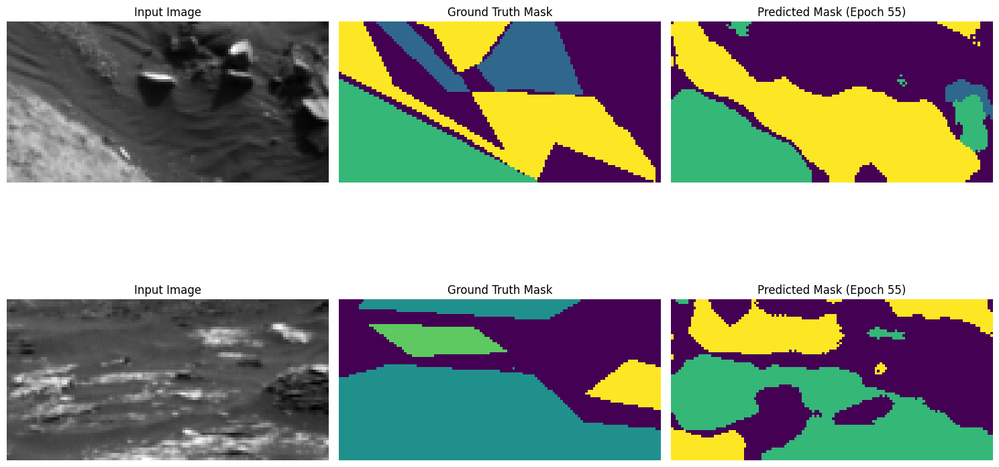

314/314 [==============================] - 30s 94ms/step - loss: 0.4171 - accuracy: 0.8356 - mean_io_u: 0.5394 - custom_mean_iou: 0.4862 - val_loss: 0.6002 - val_accuracy: 0.7761 - val_mean_io_u: 0.4759 - val_custom_mean_iou: 0.4204 - lr: 5.0000e-05
Epoch 56/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4132 - accuracy: 0.8371 - mean_io_u: 0.5425 - custom_mean_iou: 0.4892Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 56: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 18ms/step


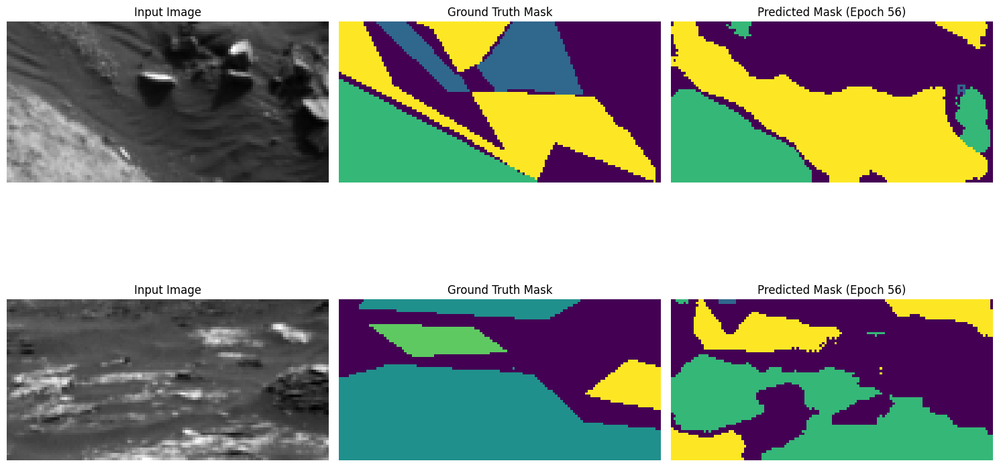

314/314 [==============================] - 29s 93ms/step - loss: 0.4132 - accuracy: 0.8371 - mean_io_u: 0.5425 - custom_mean_iou: 0.4892 - val_loss: 0.6205 - val_accuracy: 0.7756 - val_mean_io_u: 0.4755 - val_custom_mean_iou: 0.4176 - lr: 5.0000e-05
Epoch 57/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4068 - accuracy: 0.8394 - mean_io_u: 0.5435 - custom_mean_iou: 0.4908Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 57: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 19ms/step


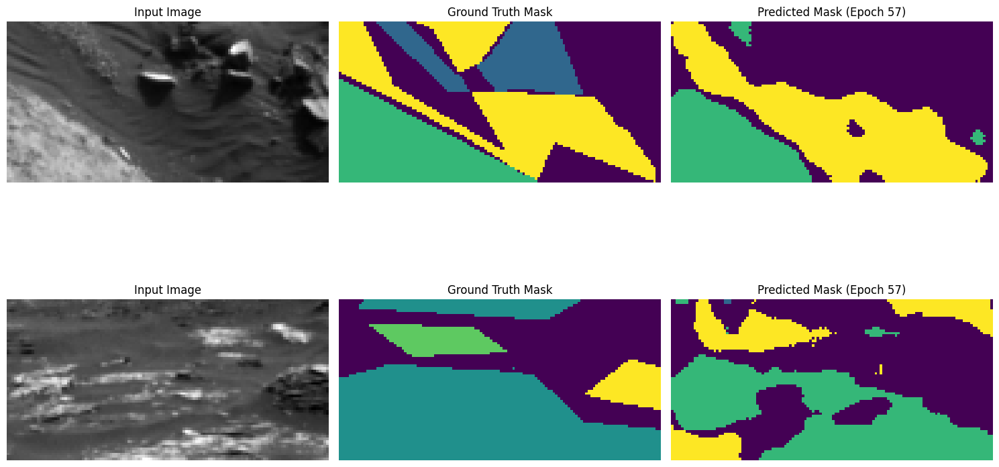

314/314 [==============================] - 29s 93ms/step - loss: 0.4067 - accuracy: 0.8394 - mean_io_u: 0.5436 - custom_mean_iou: 0.4908 - val_loss: 0.6305 - val_accuracy: 0.7742 - val_mean_io_u: 0.4719 - val_custom_mean_iou: 0.4181 - lr: 5.0000e-05
Epoch 58/1000
313/314 [============================>.] - ETA: 0s - loss: 0.4064 - accuracy: 0.8397 - mean_io_u: 0.5439 - custom_mean_iou: 0.4913Available log keys: dict_keys(['loss', 'accuracy', 'mean_io_u', 'custom_mean_iou', 'val_loss', 'val_accuracy', 'val_mean_io_u', 'val_custom_mean_iou'])

Epoch 58: val_loss did not improve from 0.59009

Epoch 58: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
1/1 [==============================] - 0s 18ms/step


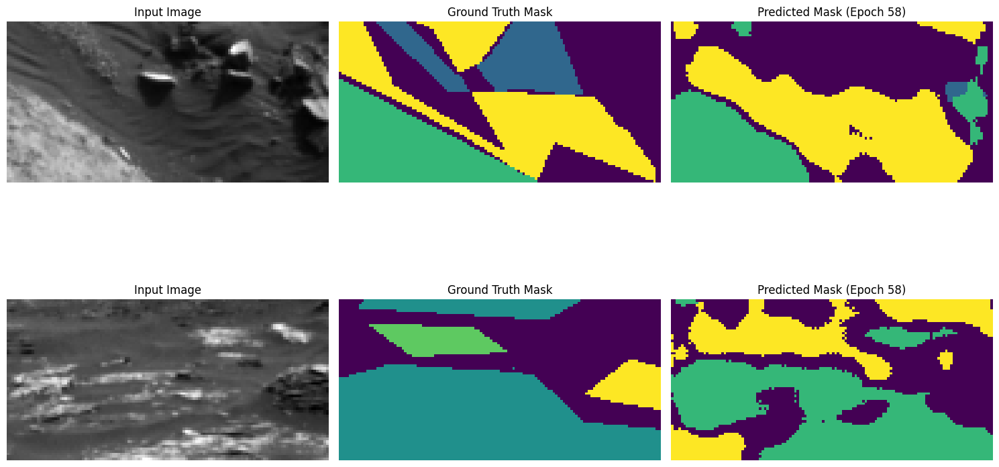

314/314 [==============================] - 29s 93ms/step - loss: 0.4065 - accuracy: 0.8397 - mean_io_u: 0.5439 - custom_mean_iou: 0.4913 - val_loss: 0.6411 - val_accuracy: 0.7706 - val_mean_io_u: 0.4607 - val_custom_mean_iou: 0.4140 - lr: 5.0000e-05


In [24]:
coarse_unet = coarse_grained_unet(input_shape, num_classes)

save_best_miou = SaveBestMeanIoU(filepath="best_cg_mean_iou.h5", monitor="val_custom_mean_iou", mode="max", verbose=1)

coarse_unet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
                    loss="sparse_categorical_crossentropy", 
                    metrics=["accuracy", mean_iou, custom_mean_iou])



coarse_unet.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),  # Add validation data
    #batch_size=32,
    epochs=1000,
    callbacks=[save_best_miou, early_stopping, model_checkpoint, reduce_lr, visualize_callback]
)


In [25]:
#coarse_unet = tf.keras.models.load_model("/kaggle/working/best_cg_mean_iou.h5", custom_objects={"MeanIoU": tf.keras.metrics.MeanIoU})
#fine_unet = tf.keras.models.load_model("/kaggle/working/best_fg_mean_iou.h5", custom_objects={"MeanIoU": tf.keras.metrics.MeanIoU})

coarse_model = coarse_unet
fine_model = fine_unet

coarse_model.save('/kaggle/working/coarse_unet.keras')
fine_model.save('/kaggle/working/fine_unet.keras')

In [29]:
#coarse_model = tf.keras.models.load_model("/kaggle/working/coarse_unet.keras")
#fine_model = tf.keras.models.load_model("/kaggle/working/fine_unet.keras")

coarse_unet.trainable = False
fine_unet.trainable = False

In [ ]:
for i, layer in enumerate(fine_model.layers):
    print(f"Index: {i}, Name: {layer.name}, Output Shape: {layer.output_shape}")

for i, layer in enumerate(coarse_model.layers):
    print(f"Index: {i}, Name: {layer.name}, Output Shape: {layer.output_shape}")

In [30]:
def build_ensembling_network(input_shape, num_classes):
    # Inputs for coarse and fine model outputs
    inputs = tfkl.Input(shape=input_shape)
    # Combine outputs
    cm = coarse_model(inputs, training=False)
    fm = fine_model(inputs, training=False)  
    combined = tfkl.Concatenate()([cm, fm])
    #combined = tfkl.BatchNormalization()(combined)
    #combined = tfkl.Dropout(0.4)(combined)

    x = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(combined)
    #x = tfkl.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    #x = tfkl.Conv2D(num_classes, (1, 1), activation='softmax', padding='same')(x)
    
    outputs = tfkl.Conv2D(num_classes, (1, 1), activation='softmax', padding='same')(x)
    
    # Final output
    #final_output = tfkl.Conv2D(num_classes, (1, 1), activation='softmax', padding='same')(x)
    
    # Build model
    ensembling_model = tfk.Model(inputs, outputs)
    return ensembling_model

In [36]:
def build_ensembling_network_add(input_shape, num_classes):
    # Inputs for coarse and fine model outputs
    inputs = tfkl.Input(shape=input_shape)
    # Combine outputs
    cm = coarse_model(inputs)
    fm = fine_model(inputs)  

    coarse_model.trainable = False
    fine_model.trainable = False

    coarse_conv = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(cm)
    fine_conv = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(fm)
    
    combined_output = tfkl.Add()([coarse_conv, fine_conv])
    
    ensembling_model = tfk.Model(inputs, combined_output)
    return ensembling_model

Epoch 1/1000
313/314 [============================>.] - ETA: 0s - loss: 1.6122 - accuracy: 0.1572
Epoch 1: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 21ms/step


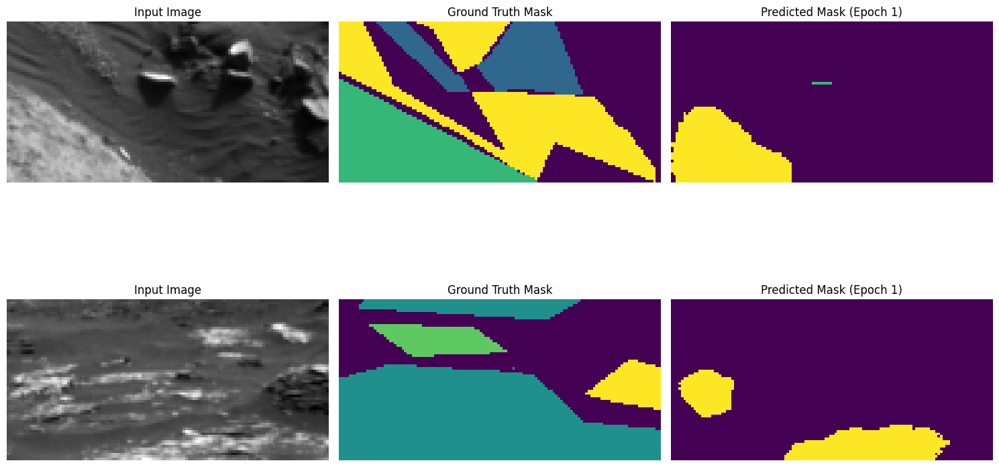

314/314 [==============================] - 29s 86ms/step - loss: 1.6122 - accuracy: 0.1572 - val_loss: 1.5900 - val_accuracy: 0.1624 - lr: 1.0000e-04
Epoch 2/1000
313/314 [============================>.] - ETA: 0s - loss: 1.5740 - accuracy: 0.2129
Epoch 2: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 20ms/step


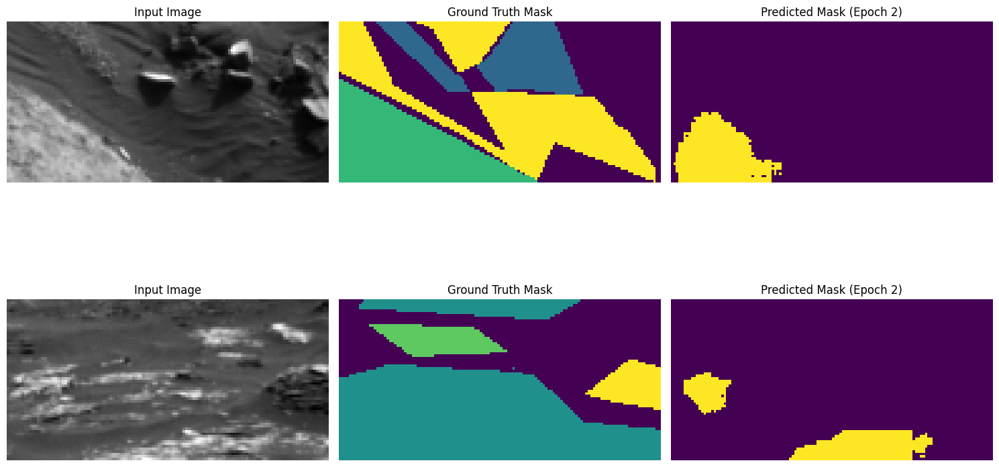

314/314 [==============================] - 26s 83ms/step - loss: 1.5740 - accuracy: 0.2130 - val_loss: 1.5534 - val_accuracy: 0.2114 - lr: 1.0000e-04
Epoch 3/1000
313/314 [============================>.] - ETA: 0s - loss: 1.5372 - accuracy: 0.2451
Epoch 3: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 20ms/step


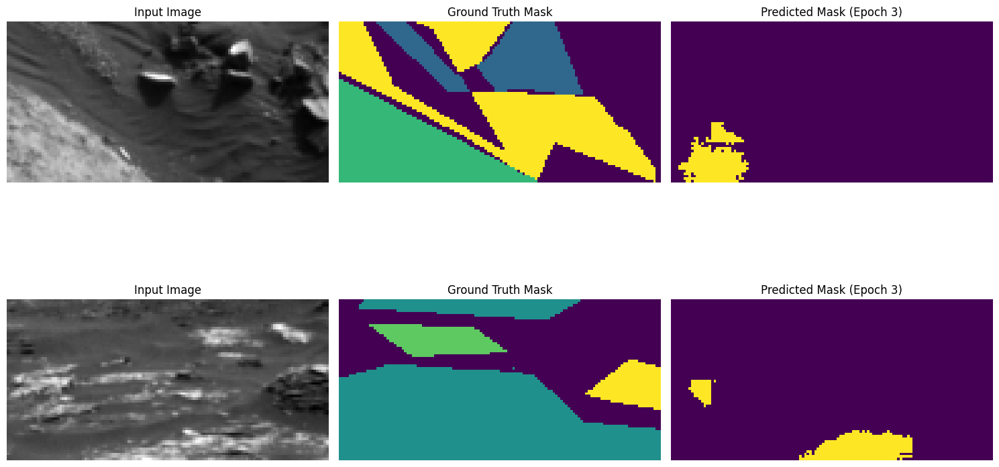

314/314 [==============================] - 26s 83ms/step - loss: 1.5371 - accuracy: 0.2452 - val_loss: 1.5182 - val_accuracy: 0.2275 - lr: 1.0000e-04
Epoch 4/1000
313/314 [============================>.] - ETA: 0s - loss: 1.5017 - accuracy: 0.2761
Epoch 4: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 20ms/step


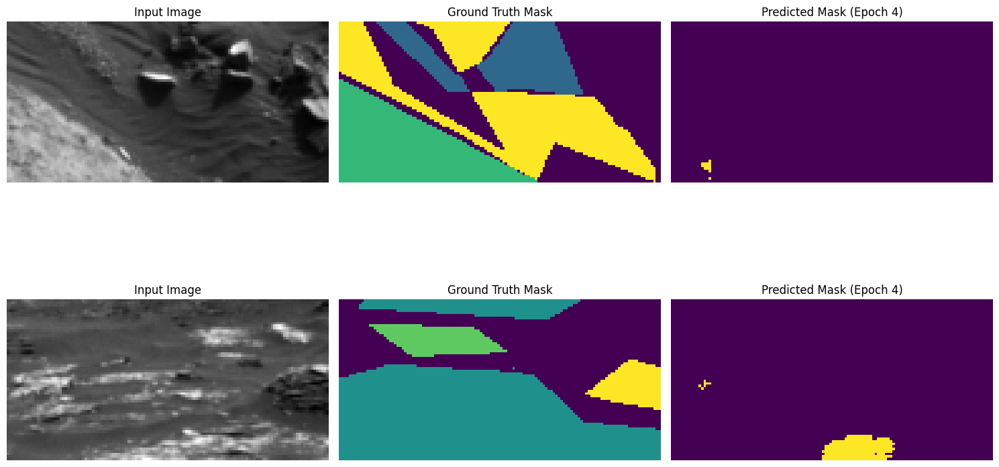

314/314 [==============================] - 26s 83ms/step - loss: 1.5017 - accuracy: 0.2761 - val_loss: 1.4843 - val_accuracy: 0.2945 - lr: 1.0000e-04
Epoch 5/1000
313/314 [============================>.] - ETA: 0s - loss: 1.4674 - accuracy: 0.4735
Epoch 5: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 20ms/step


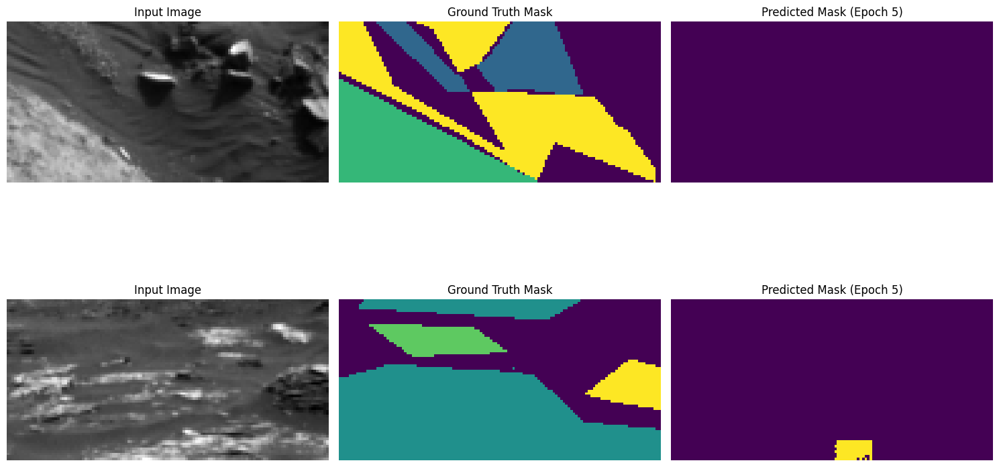

314/314 [==============================] - 27s 85ms/step - loss: 1.4674 - accuracy: 0.4734 - val_loss: 1.4515 - val_accuracy: 0.4839 - lr: 1.0000e-04
Epoch 6/1000
313/314 [============================>.] - ETA: 0s - loss: 1.4342 - accuracy: 0.4987
Epoch 6: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 21ms/step


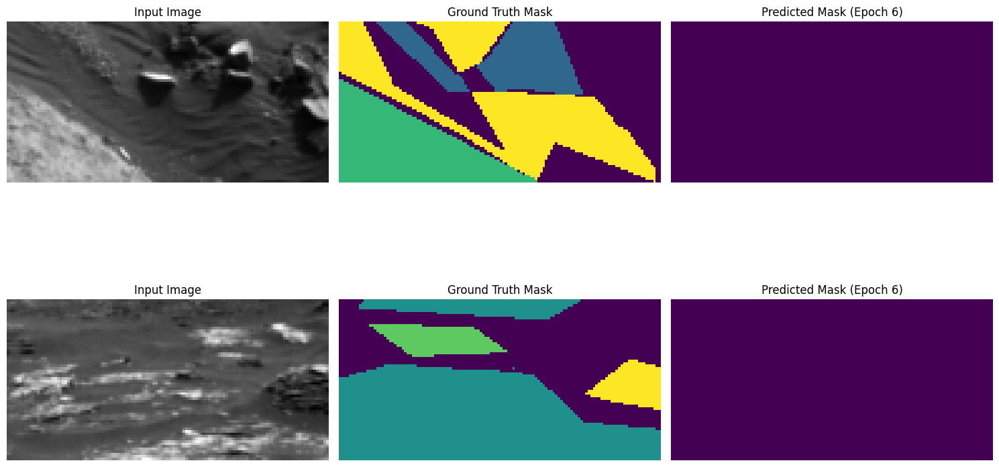

314/314 [==============================] - 26s 83ms/step - loss: 1.4342 - accuracy: 0.4987 - val_loss: 1.4198 - val_accuracy: 0.4915 - lr: 1.0000e-04
Epoch 7/1000
313/314 [============================>.] - ETA: 0s - loss: 1.4021 - accuracy: 0.5050
Epoch 7: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 28ms/step


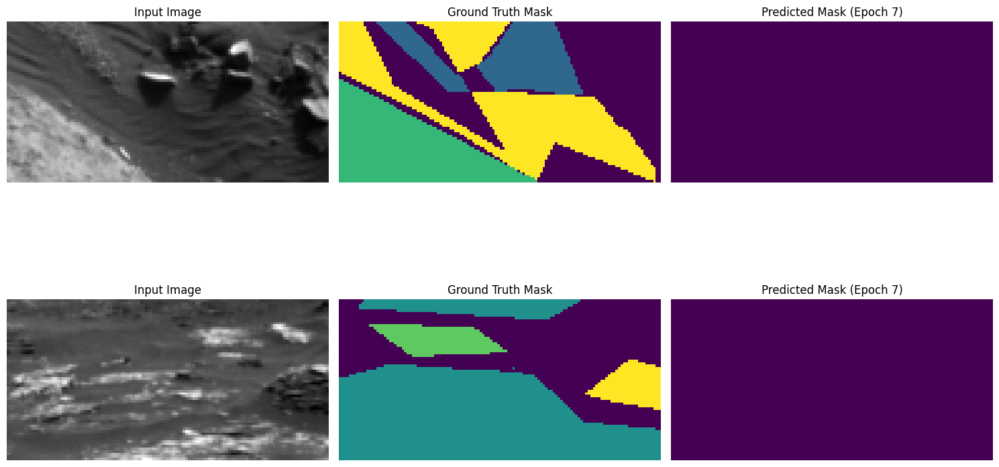

314/314 [==============================] - 26s 83ms/step - loss: 1.4021 - accuracy: 0.5050 - val_loss: 1.3892 - val_accuracy: 0.4966 - lr: 1.0000e-04
Epoch 8/1000
313/314 [============================>.] - ETA: 0s - loss: 1.3710 - accuracy: 0.5093
Epoch 8: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 21ms/step


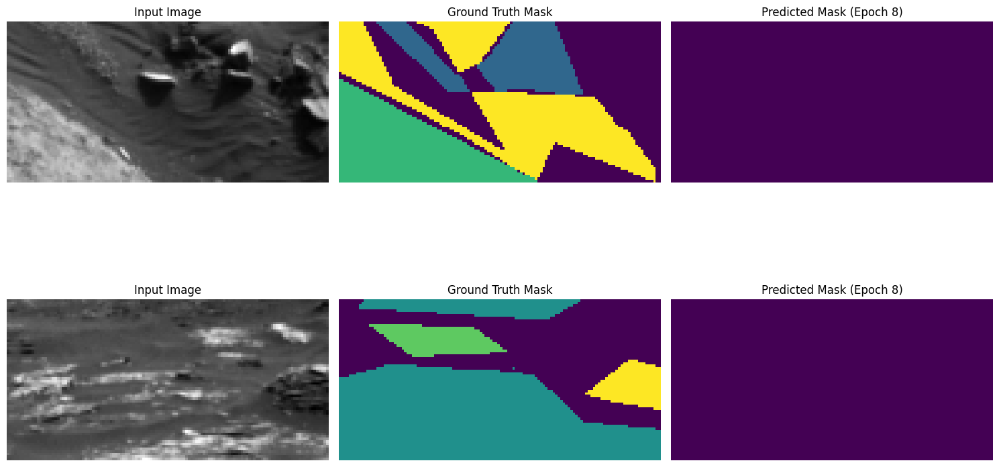

314/314 [==============================] - 26s 83ms/step - loss: 1.3710 - accuracy: 0.5094 - val_loss: 1.3596 - val_accuracy: 0.5003 - lr: 1.0000e-04
Epoch 9/1000
313/314 [============================>.] - ETA: 0s - loss: 1.3409 - accuracy: 0.5154
Epoch 9: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 21ms/step


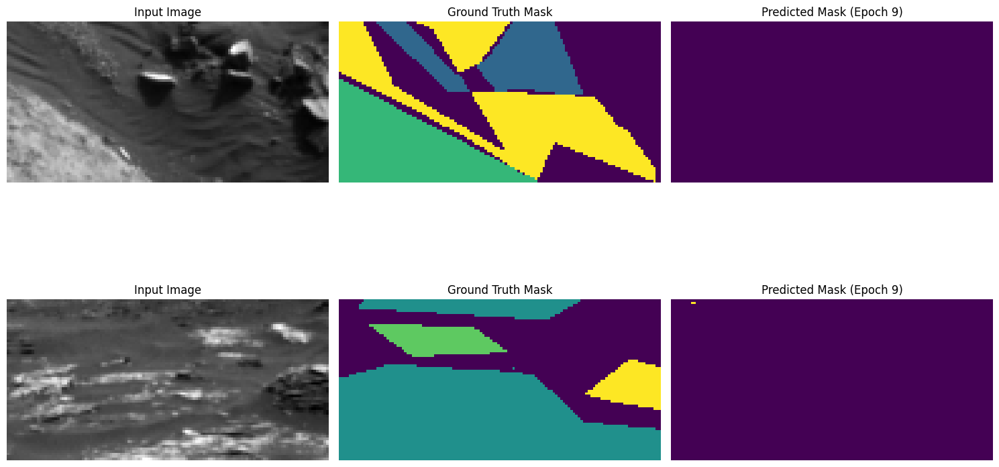

314/314 [==============================] - 26s 83ms/step - loss: 1.3408 - accuracy: 0.5155 - val_loss: 1.3310 - val_accuracy: 0.5275 - lr: 1.0000e-04
Epoch 10/1000
313/314 [============================>.] - ETA: 0s - loss: 1.3116 - accuracy: 0.5690
Epoch 10: val_loss did not improve from 0.59009
1/1 [==============================] - 0s 22ms/step


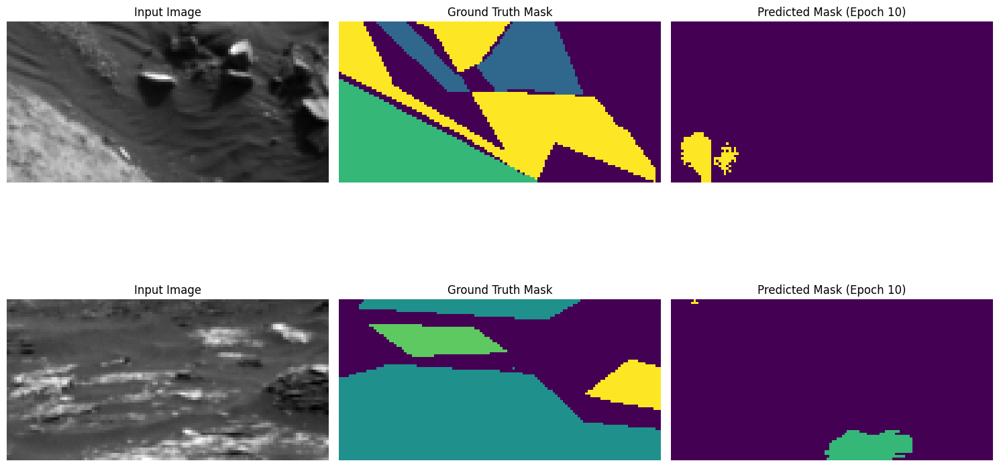

314/314 [==============================] - 26s 83ms/step - loss: 1.3117 - accuracy: 0.5690 - val_loss: 1.3032 - val_accuracy: 0.6231 - lr: 1.0000e-04
Epoch 11/1000
140/314 [============>.................] - ETA: 13s - loss: 1.2928 - accuracy: 0.6455

KeyboardInterrupt: 

In [40]:
ensembling_model = build_ensembling_network_add(X_train.shape[1:], num_classes)

# Compile and train the fusion network
ensembling_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
                     loss='sparse_categorical_crossentropy', 
                     metrics=['accuracy'])

reduce_lrE = ReduceLROnPlateau(
    monitor="val_loss",  # Monitor loss instead of validation loss
    factor=0.5,
    patience=2,
    verbose=1,
    mode="min",
    min_lr=1e-6
)

# Train the model
ensembling_model.fit(
    x=X_train, 
    y=y_train,
    epochs=1000, 
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, model_checkpoint, reduce_lrE, visualize_callback]
)

In [ ]:
# Load the saved model
best_model = tf.keras.models.load_model("best_model_mean_iou.h5", custom_objects={"MeanIoU": tf.keras.metrics.MeanIoU})



In [ ]:
model=ensembling_model

In [ ]:
model_filename = f"ensembling_fine_coarse.keras"
model.save(model_filename)

print(f"Model saved to {model_filename}")

## 📊 Prepare Your Submission

In our Kaggle competition, submissions are made as `csv` files. To create a proper `csv` file, you need to flatten your predictions and include an `id` column as the first column of your dataframe. To maintain consistency between your results and our solution, please avoid shuffling the test set. The code below demonstrates how to prepare the `csv` file from your model predictions.



In [ ]:
import os
# If model_filename is not defined, load the most recent model from Google Drive
if "model_filename" not in globals() or model_filename is None:
    files = [f for f in os.listdir('.') if os.path.isfile(f) and f.startswith('model_') and f.endswith('.keras')]
    files.sort(key=lambda x: os.path.getmtime(x), reverse=True)
    if files:
        model_filename = files[0]
    else:
        raise FileNotFoundError("No model files found in the current directory.")

In [ ]:
print(f"X_test shape before reshaping: {X_test.shape}")

In [ ]:
# Generate predictions
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels
print(f"Predictions shape: {preds.shape}")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)
# Randomly select 20 indices for prediction
random_indices = np.random.choice(X_test.shape[0], size=20, replace=False)
print(f"Randomly selected indices for prediction (seed=42): {random_indices}")

# Select 20 random samples and their corresponding masks
X_sample = X_test[random_indices]



predicted_masks = preds

# Visualize the predictions
num_images = len(X_sample)  # Number of images to visualize
fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

for i in range(num_images):
    # Original Image
    ax_img = axes[i, 0]
    ax_img.imshow(X_sample[i].squeeze(), cmap="gray")
    ax_img.set_title("Input Image")
    ax_img.axis("off")

    # Predicted Mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_masks[i], cmap="viridis")
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [ ]:
# Create and download the csv submission file
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_{timestep_str}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)



In [ ]:
len(submission_df.columns)

In [ ]:
len(submission_df)